# Visualizing Market Structure Across US Securities

**A comprehensive analysis of trading volumes, issuance patterns, and macro-economic relationships across US securities markets**

---

## Project Overview

This project analyzes trading volumes, issuance activity, and outstanding balances across major US securities markets from 2019-2021. Using data from SIFMA (Securities Industry and Financial Markets Association) and FRED (Federal Reserve Economic Data), we examine market dynamics, correlations with macroeconomic indicators, and cross-market relationships during a period that includes the COVID-19 pandemic and subsequent economic recovery.

### Markets Analyzed

**Trading Volume Analysis:**
1. US Treasury Securities
2. US Repo Markets (Primary Dealer, GCF, Triparty)
3. US Equity Markets (Issuance and Trading)
4. US Fixed Income Securities
5. US Structured Finance (ABS and MBS)
6. US Agency Debt
7. US Corporate Bonds

**Issuance and Outstanding Analysis:**
1. US Marketable Treasury Securities
2. US Mortgage-Backed Securities (MBS)
3. US Asset-Backed Securities (ABS)
4. US Fixed Income Securities
5. US Asset-Backed Commercial Paper (ABCP)
6. US Municipal Bonds
7. US Corporate Bonds

### Key Questions

1. What are the descriptive statistics and trends in trading volumes across different securities markets?
2. Are there observable patterns or seasonality in the time-series data?
3. How do trading volumes correlate with macroeconomic indicators (Federal Funds Rate, CPI, High Yield Spread)?
4. What is the correlation across various securities within each market (e.g., Treasury securities by tenor)?
5. What is the correlation in trading activity across different security markets?
6. How do issuance and outstanding patterns relate to macroeconomic conditions?

---
## Setup and Configuration

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from typing import Union, Optional, List
import re
from datetime import datetime
import warnings

# Configure display and plotting
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 150)
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")
warnings.filterwarnings('ignore')

# Set figure size defaults
plt.rcParams['figure.figsize'] = (14, 6)
plt.rcParams['font.size'] = 10

---
## Data Loading: SIFMA and FRED

### SIFMA Data

#### US Treasury Trading Volume

In [4]:
us_treasury_trading_volume = (
    pd.read_excel('data/US-Treasury-Securities-Statistics-SIFMA.xlsx', sheet_name="Trading Volume", header=8)
    .head(68)
    .tail(32)
    .reset_index(drop=True)
    .rename(columns={'Unnamed: 0': 'Date'})
    .assign(Date=lambda df: pd.to_datetime(df['Date']).dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "Treasury Bills", "Treasury Inflation Index Securities (TIPS)", "Coupon Securities", "Total"]])
)

print("Treasury:", us_treasury_trading_volume['Date'].min(), "to", us_treasury_trading_volume['Date'].max(), 
      f"| {len(us_treasury_trading_volume)} obs")

Treasury: 2019-01-01 00:00:00 to 2021-08-01 00:00:00 | 32 obs


#### US GCF Repo Index, Triparty Repo, and Primary Dealer Financing (Repo/Reverse Repo)

In [26]:
# Primary Dealer
us_repo_primary_dealer = (
    pd.read_excel("data/US-Repo-Statistics-SIFMA.xlsx", sheet_name="Primary Dealer", header=8)
    .head(73)
    .tail(31)
    .reset_index(drop=True)
    .rename(columns={'Unnamed: 0': 'Date', 'Total': "NA", "Unnamed: 9": "Total"})
    .assign(Date=lambda df: pd.to_datetime(df['Date']).dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "Total"]])
)

# GCF Repo
us_repo_gcf_repo_index = (
    pd.read_excel("data/US-Repo-Statistics-SIFMA.xlsx", sheet_name="GCF Repo", header=8)
    .head(64)
    .tail(31)
    .reset_index(drop=True)
    .rename(columns={"Unnamed: 0": "Date"})
    .assign(Date=lambda df: pd.to_datetime(df['Date']).dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "UST.1", "MBS.1"]])
    .rename(columns={"UST.1": "UST", "MBS.1": "MBS"})
    .assign(Total=lambda x: x['UST'] + x['MBS'])
)

# Triparty Repo
us_repo_triparty_repo = (
    pd.read_excel("data/US-Repo-Statistics-SIFMA.xlsx", skiprows=6, sheet_name="Triparty Repo")
    .set_index("Unnamed: 0")
    .rename_axis(index=None)
    .T
    .reset_index(drop=True)
    .pipe(lambda df: df.rename(columns={df.columns[0]: 'Date'}))
    .pipe(lambda x: x[["Date", "TOTAL"]])
    .iloc[:, [0, -4]]
    .assign(Date=lambda df: pd.to_datetime(df['Date']).dt.to_period('M').dt.to_timestamp())
    .assign(TOTAL=lambda x: x['TOTAL'].astype(float))
    .rename(columns={'TOTAL': 'Total'})
)

# Filter to match same period as other markets (2019-2021)
us_repo_triparty_repo = us_repo_triparty_repo[
    (us_repo_triparty_repo['Date'] >= '2019-01-01') & 
    (us_repo_triparty_repo['Date'] <= '2021-12-31')
].reset_index(drop=True)


# Validation
print("Primary Dealer:", us_repo_primary_dealer['Date'].min(), "to", us_repo_primary_dealer['Date'].max(), 
      f"| {len(us_repo_primary_dealer)} obs")
print("GCF Repo:", us_repo_gcf_repo_index['Date'].min(), "to", us_repo_gcf_repo_index['Date'].max(),
      f"| {len(us_repo_gcf_repo_index)} obs")
print("Triparty Repo:", us_repo_triparty_repo['Date'].min(), "to", us_repo_triparty_repo['Date'].max(),
      f"| {len(us_repo_triparty_repo)} obs")

Primary Dealer: 2019-01-01 00:00:00 to 2021-07-01 00:00:00 | 31 obs
GCF Repo: 2019-01-01 00:00:00 to 2021-07-01 00:00:00 | 31 obs
Triparty Repo: 2019-01-01 00:00:00 to 2021-07-01 00:00:00 | 31 obs


#### US Equity Issuance and Trading Volumes

In [5]:
us_equity_issuance = (
    pd.read_excel("data/US-Equities-and-Related-Statistics-SIFMA.xlsx", sheet_name="Capital Formation", header=8)
    .head(70)
    .tail(32)
    .reset_index(drop=True)
    .rename(columns={"Unnamed: 0": "Date"})
    .assign(Date=lambda df: pd.to_datetime(df['Date']).dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "IPOs", "Secondaries", "Total CS", "Preferred Stock", "Total Equity"]])
    .assign(Total=lambda x: x['Total CS'] + x['Total Equity'])
)

us_equity_trading_volume = (
    pd.read_excel("data/US-Equities-and-Related-Statistics-SIFMA.xlsx", sheet_name="ADV $", header=8)
    .head(62)
    .tail(32)
    .reset_index(drop=True)
    .rename(columns={"Unnamed: 0": "Date", "Market": "Total"})
    .assign(Date=lambda df: pd.to_datetime(df['Date']).dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "ICE", "Nasdaq", "Cboe", "Other", "Off Exchange", "Total"]])
)

print("Equity Issuance:", us_equity_issuance['Date'].min(), "to", us_equity_issuance['Date'].max(), 
      f"| {len(us_equity_issuance)} obs")
print("Equity Trading:", us_equity_trading_volume['Date'].min(), "to", us_equity_trading_volume['Date'].max(), 
      f"| {len(us_equity_trading_volume)} obs")

Equity Issuance: 2019-01-01 00:00:00 to 2021-08-01 00:00:00 | 32 obs
Equity Trading: 2019-01-01 00:00:00 to 2021-08-01 00:00:00 | 32 obs


#### US Fixed Income Trading Volume

In [6]:
us_fixed_trading_volume = (
    pd.read_excel("data/US-Fixed-Income-Securities-Statistics-SIFMA.xlsx", sheet_name="Trading Volume", header=7)
    .head(73)
    .tail(31)
    .reset_index(drop=True)
    .rename(columns={"Unnamed: 0": "Date"})
    .assign(Date=lambda df: pd.to_datetime(df['Date']).dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "Treasury", "Agency MBS", "Non-Agency MBS", "Corporate Debt", "Municipal", "Total"]])
)

print("Fixed Income:", us_fixed_trading_volume['Date'].min(), "to", us_fixed_trading_volume['Date'].max(), 
      f"| {len(us_fixed_trading_volume)} obs")

Fixed Income: 2019-01-01 00:00:00 to 2021-07-01 00:00:00 | 31 obs


#### US Structured Finance Trading Volume

In [7]:
us_asset_backed_securities = (
    pd.read_excel("data/US-Asset-Backed-Securities-Statistics-SIFMA.xlsx", sheet_name="ABS Trading Volume - $", header=7)
    .head(57)
    .tail(32)
    .reset_index(drop=True)
    .rename(columns={"Total": "Total Asset"})
    .assign(Date=lambda df: pd.to_datetime(df['Date']).dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "ABS", "CDO", "Other", "Total Asset"]])
)

us_mortgage_backed_securities = (
    pd.read_excel("data/US-Mortgage-Backed-Securities-Statistics-SIFMA.xlsx", sheet_name="Trading Volume - $", header=10)
    .head(57)
    .tail(32)
    .reset_index(drop=True)
    .assign(Date=lambda df: pd.to_datetime(df['Date']).dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "Agency CMO", "Agency Specified Pool", "Agency TBA", 
                       "Agency CMBS (IO/PO)", "Agency CMBS (P&I)", "TOTAL"]])
    .rename(columns={'TOTAL': 'Total Mortgage'})
)

# Merge the DataFrames on the 'Date' column
us_sf_trading_volume = pd.merge(us_asset_backed_securities, us_mortgage_backed_securities, on='Date', how='inner')
us_sf_trading_volume.sort_values('Date', inplace=True)
us_sf_trading_volume['Total'] = us_sf_trading_volume['Total Asset'] + us_sf_trading_volume['Total Mortgage']

print("Structured Finance:", us_sf_trading_volume['Date'].min(), "to", us_sf_trading_volume['Date'].max(), 
      f"| {len(us_sf_trading_volume)} obs")

Structured Finance: 2019-01-01 00:00:00 to 2021-08-01 00:00:00 | 32 obs


#### US Agency Trading Volume

In [8]:
us_agency_trading_volume = (
    pd.read_excel("data/US-Agency-Debt-Statistics-SIFMA.xlsx", sheet_name="Trading Volume", header=7)
    .head(60)
    .tail(32)
    .reset_index(drop=True)
    .rename(columns={"Unnamed: 0": "Date"})
    .assign(Date=lambda df: pd.to_datetime(df['Date']).dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "Fannie Mae", "FHLB", "Freddie Mac", "Other", "Total"]])
)

print("Agency Debt:", us_agency_trading_volume['Date'].min(), "to", us_agency_trading_volume['Date'].max(), 
      f"| {len(us_agency_trading_volume)} obs")

Agency Debt: 2019-01-01 00:00:00 to 2021-08-01 00:00:00 | 32 obs


#### US Corporate Bond Trading Volume

In [9]:
us_corporate_bond_trading_volume = (
    pd.read_excel("data/US-Corporate-Bonds-Statistics-SIFMA.xlsx", sheet_name="Trading Volume", header=8)
    .head(68)
    .tail(32)
    .reset_index(drop=True)
    .rename(columns={"Unnamed: 0": "Date"})
    .assign(Date=lambda df: pd.to_datetime(df['Date']).dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "Investment Grade", "High Yield", "Total"]])
)

print("Corporate Bonds:", us_corporate_bond_trading_volume['Date'].min(), "to", us_corporate_bond_trading_volume['Date'].max(), 
      f"| {len(us_corporate_bond_trading_volume)} obs")

Corporate Bonds: 2019-01-01 00:00:00 to 2021-08-01 00:00:00 | 32 obs


### FRED Macro Indicators

In [17]:
DATA_DIR = Path('data')
FRED_DIR = DATA_DIR / 'fred'


def load_cached_fred(series_id, name=None):
    """Load cached FRED data from CSV files."""
    filepath = FRED_DIR / f"{series_id}.csv"
    
    if not filepath.exists():
        raise FileNotFoundError(
            f"FRED data file not found: {filepath}\n"
            f"Please download {series_id} from FRED"
        )
    
    df = pd.read_csv(filepath)
    
    # Handle different FRED CSV formats
    date_col = 'DATE' if 'DATE' in df.columns else 'observation_date'
    value_col = series_id if series_id in df.columns else 'VALUE' if 'VALUE' in df.columns else df.columns[1]
    
    out_name = name or series_id
    result = df.rename(columns={date_col: 'Date', value_col: out_name}).copy()
    result['Date'] = pd.to_datetime(result['Date'], errors='coerce')
    result[out_name] = pd.to_numeric(result[out_name], errors='coerce')
    
    return result.dropna(subset=['Date']).set_index('Date')[[out_name]].sort_index()

# Load three key indicators
fed_funds = load_cached_fred('FEDFUNDS', 'FedFunds')
cpi = load_cached_fred('CPIAUCSL', 'CPI')
hy_spread = load_cached_fred('BAMLH0A0HYM2', 'HY_OAS')

# Resample to monthly
fed_funds_monthly = fed_funds.resample('M').mean()
hy_spread_monthly = hy_spread.resample('M').mean()
cpi_monthly = cpi.resample('M').last()
cpi_yoy = (cpi_monthly.pct_change(12) * 100).rename(columns={'CPI': 'CPI_YoY'})


print(f"  Fed Funds: {fed_funds_monthly.index.min()} to {fed_funds_monthly.index.max()}")
print(f"  CPI YoY: {cpi_yoy.index.min()} to {cpi_yoy.index.max()}")
print(f"  HY Spread: {hy_spread_monthly.index.min()} to {hy_spread_monthly.index.max()}")

# Normalize macro data to month start to match trading data
fed_funds_monthly.index = fed_funds_monthly.index.to_period('M').to_timestamp()
cpi_yoy.index = cpi_yoy.index.to_period('M').to_timestamp()
hy_spread_monthly.index = hy_spread_monthly.index.to_period('M').to_timestamp()

print("Macro data normalized to month start")
print(f"Fed Funds sample: {fed_funds_monthly.head(3)}")


  Fed Funds: 1954-07-31 00:00:00 to 2025-07-31 00:00:00
  CPI YoY: 1947-01-31 00:00:00 to 2025-07-31 00:00:00
  HY Spread: 1996-12-31 00:00:00 to 2025-08-31 00:00:00
Macro data normalized to month start
Fed Funds sample:             FedFunds
Date                
1954-07-01      0.80
1954-08-01      1.22
1954-09-01      1.07


---
## Utility Functions

In [11]:
def calculate_descriptive_stats(df, value_cols=None):
    """Calculate comprehensive descriptive statistics."""
    if value_cols is None:
        value_cols = df.select_dtypes(include=[np.number]).columns
    
    stats = df[value_cols].describe(percentiles=[0.25, 0.50, 0.75])
    stats.loc['skew'] = df[value_cols].skew()
    stats.loc['kurtosis'] = df[value_cols].kurtosis()
    
    return stats

def plot_time_series(df, date_col='Date', value_cols=None, title='', ylabel=''):
    """Plot multiple time series on the same chart."""
    if value_cols is None:
        value_cols = df.select_dtypes(include=[np.number]).columns
    
    fig, ax = plt.subplots(figsize=(14, 6))
    
    for col in value_cols:
        ax.plot(df[date_col], df[col], label=col, linewidth=1.5)
    
    ax.set_xlabel('Date')
    ax.set_ylabel(ylabel)
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.legend(loc='best', framealpha=0.9)
    ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

def calculate_correlation_matrix(dfs_dict):
    """Calculate correlation matrix across multiple markets."""
    merged = None
    
    for market_name, (df, col) in dfs_dict.items():
        temp = df[['Date', col]].copy()
        temp.columns = ['Date', market_name]
        
        if merged is None:
            merged = temp
        else:
            merged = merged.merge(temp, on='Date', how='outer')
    
    corr = merged.drop('Date', axis=1).corr()
    return corr

def plot_correlation_heatmap(corr_matrix, title='Correlation Matrix'):
    """Plot correlation heatmap."""
    fig, ax = plt.subplots(figsize=(12, 10))
    
    sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', 
                center=0, vmin=-1, vmax=1, square=True, ax=ax,
                cbar_kws={'label': 'Correlation Coefficient'})
    
    plt.title(title, fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

---
## Individual Market Analysis

### 1. US Treasury Trading Volume

In [12]:
# ============================================================================
# 1. US TREASURY SECURITIES ANALYSIS
# ============================================================================

print("=" * 80)
print("US TREASURY SECURITIES TRADING VOLUME ANALYSIS")
print("=" * 80)

# Get column names (exclude Date)
treasury_cols = ['Treasury Bills', 'Treasury Inflation Index Securities (TIPS)', 'Coupon Securities', 'Total']

# -----------------------------------------------------------------------------
# DESCRIPTIVE STATISTICS
# -----------------------------------------------------------------------------
print("\n DESCRIPTIVE STATISTICS")
print("-" * 80)

treasury_stats = calculate_descriptive_stats(us_treasury_trading_volume, treasury_cols)

print("\nTreasury Trading Volume Statistics ($ Billions)")
display(treasury_stats)

US TREASURY SECURITIES TRADING VOLUME ANALYSIS

 DESCRIPTIVE STATISTICS
--------------------------------------------------------------------------------

Treasury Trading Volume Statistics ($ Billions)


,Treasury Bills,Treasury Inflation Index Securities (TIPS),Coupon Securities,Total
count,32.000000,32.000000,32.000000,32.000000
mean,149.753267,19.629159,432.379706,604.967956
std,27.369708,3.730341,82.374892,83.019477
min,117.709000,14.740000,291.516600,492.474800
25%,132.176312,16.804650,387.618500,542.369537
50%,140.392675,18.896625,428.850125,600.867200
75%,166.445187,20.923462,475.413650,649.991500
max,218.288250,30.907000,741.869000,915.461250
skew,1.196607,1.168658,1.543134,1.647637
kurtosis,0.858014,1.403702,5.406229,5.090917




 TIME SERIES PLOTS
--------------------------------------------------------------------------------


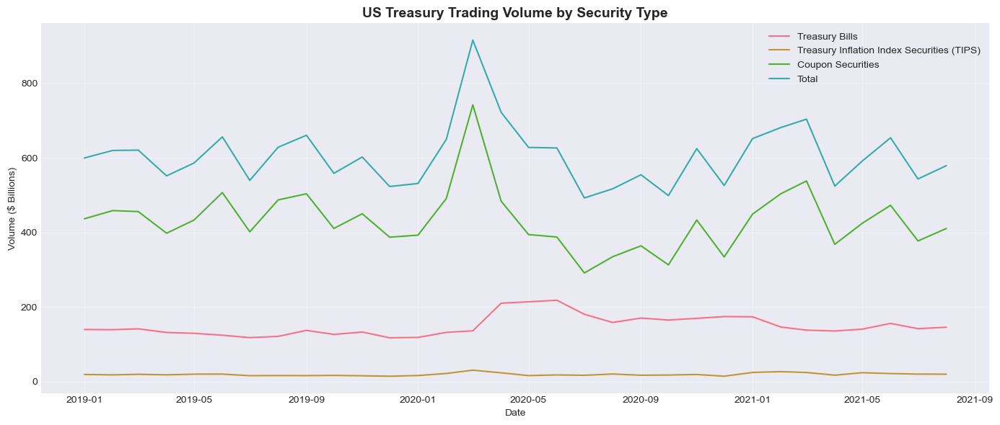



MACROECONOMIC CORRELATIONS
--------------------------------------------------------------------------------


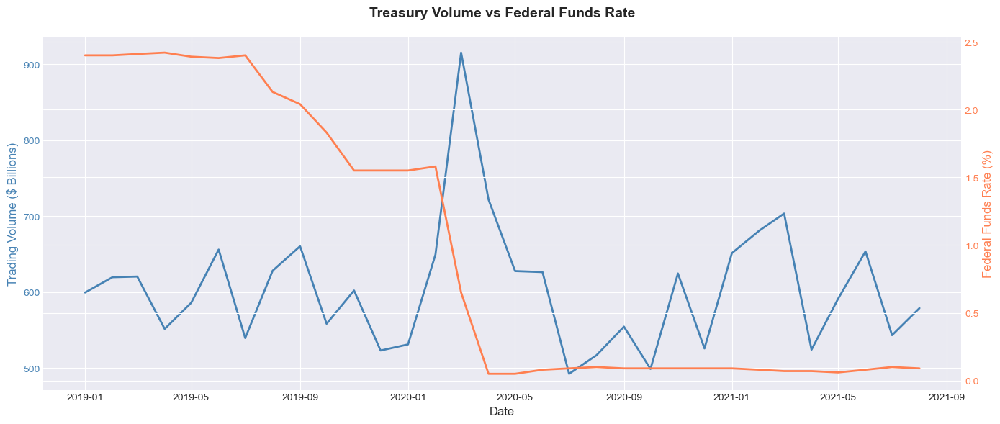

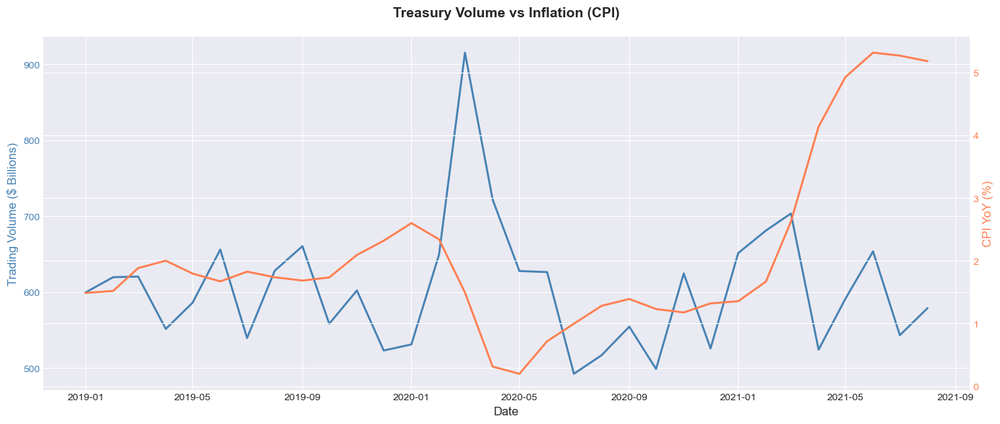

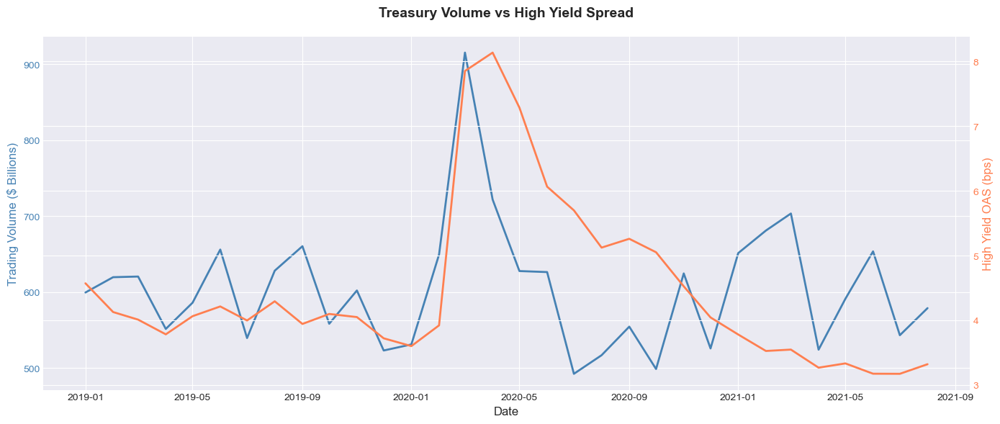


Correlation with Macro Indicators:
--------------------------------------------------------------------------------
  Federal Funds Rate...................... -0.026
  CPI YoY................................. -0.141
  High Yield Spread.......................  0.426


In [18]:
# -----------------------------------------------------------------------------
# TIME SERIES VISUALIZATION
# -----------------------------------------------------------------------------
print("\n\n TIME SERIES PLOTS")
print("-" * 80)

plot_time_series(
    us_treasury_trading_volume,
    value_cols=treasury_cols,
    title='US Treasury Trading Volume by Security Type',
    ylabel='Volume ($ Billions)'
)

# -----------------------------------------------------------------------------
# MACROECONOMIC RELATIONSHIPS
# -----------------------------------------------------------------------------
print("\n\nMACROECONOMIC CORRELATIONS")
print("-" * 80)

# Prepare macro data
fed_funds_df = fed_funds_monthly.reset_index()
fed_funds_df.columns = ['Date', 'FedFunds']

cpi_yoy_df = cpi_yoy.reset_index()
cpi_yoy_df.columns = ['Date', 'CPI_YoY']

hy_spread_df = hy_spread_monthly.reset_index()
hy_spread_df.columns = ['Date', 'HY_OAS']

# Merge data for analysis
treasury_macro = us_treasury_trading_volume[['Date', 'Total']].copy()
treasury_macro = treasury_macro.merge(fed_funds_df, on='Date', how='inner')
treasury_macro = treasury_macro.merge(cpi_yoy_df, on='Date', how='inner')
treasury_macro = treasury_macro.merge(hy_spread_df, on='Date', how='inner')

# Plot with Federal Funds Rate
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(treasury_macro['Date'], treasury_macro['Total'], color='steelblue', linewidth=2)
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Trading Volume ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(treasury_macro['Date'], treasury_macro['FedFunds'], color='coral', linewidth=2)
ax2.set_ylabel('Federal Funds Rate (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Treasury Volume vs Federal Funds Rate', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with CPI
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(treasury_macro['Date'], treasury_macro['Total'], color='steelblue', linewidth=2)
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Trading Volume ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(treasury_macro['Date'], treasury_macro['CPI_YoY'], color='coral', linewidth=2)
ax2.set_ylabel('CPI YoY (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Treasury Volume vs Inflation (CPI)', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with High Yield Spread
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(treasury_macro['Date'], treasury_macro['Total'], color='steelblue', linewidth=2)
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Trading Volume ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(treasury_macro['Date'], treasury_macro['HY_OAS'], color='coral', linewidth=2)
ax2.set_ylabel('High Yield OAS (bps)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Treasury Volume vs High Yield Spread', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Calculate and print correlations
print("\nCorrelation with Macro Indicators:")
print("-" * 80)

correlations = {
    'Federal Funds Rate': treasury_macro[['Total', 'FedFunds']].corr().iloc[0, 1],
    'CPI YoY': treasury_macro[['Total', 'CPI_YoY']].corr().iloc[0, 1],
    'High Yield Spread': treasury_macro[['Total', 'HY_OAS']].corr().iloc[0, 1]
}

for indicator, corr in correlations.items():
    print(f"  {indicator:.<40} {corr:>6.3f}")



 WITHIN-MARKET CORRELATIONS
--------------------------------------------------------------------------------
Correlation Matrix: Trading Volume Across Treasury Security Types



,Treasury Bills,Treasury Inflation Index Securities (TIPS),Coupon Securities,Total
Treasury Bills,1.000,0.046,-0.260,0.071
Treasury Inflation Index Securities (TIPS),0.046,1.000,0.684,0.744
Coupon Securities,-0.260,0.684,1.000,0.944
Total,0.071,0.744,0.944,1.000


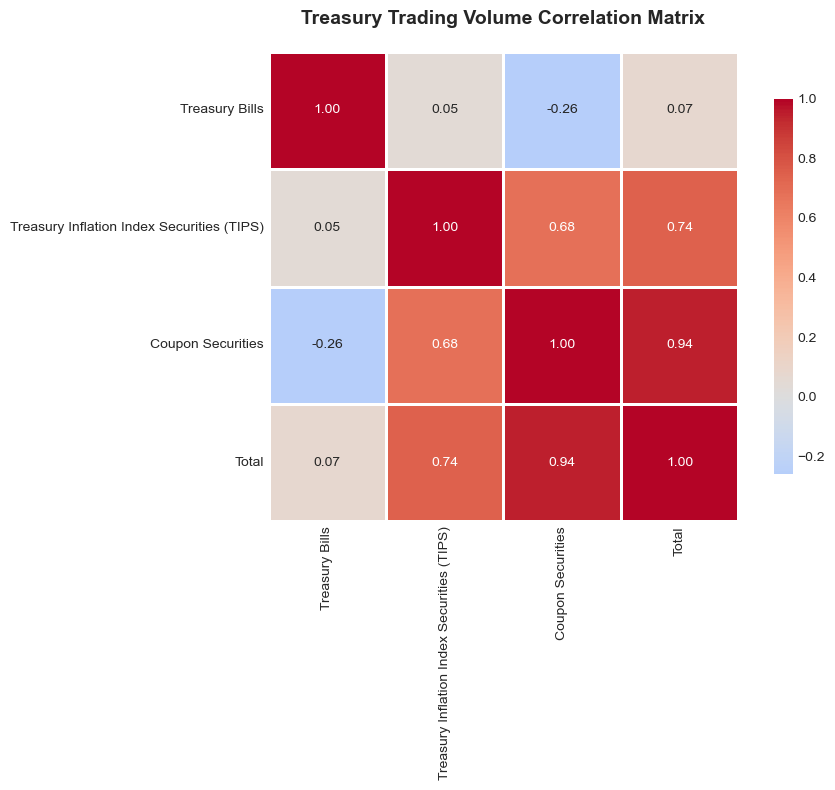



 KEY OBSERVATIONS
--------------------------------------------------------------------------------

1. VOLUME CHARACTERISTICS:
   - Average monthly volume: $604.97B
   - Standard deviation: $83.02B  
   - Coefficient of variation: 13.7%
   - High volatility months (>1 std): 3 (9.4%)
   - Low volatility months (<1 std): 3 (9.4%)

2. TREND:
   - Time trend correlation: -0.045

3. MACRO RELATIONSHIPS:
   - Federal Funds Rate: -0.026
   - Inflation (CPI): -0.141
   - Credit Stress (HY): 0.426

4. CROSS-TENOR CORRELATIONS:
   - Average correlation: 0.371
   - Range: [-0.260, 0.944]



In [21]:
# -----------------------------------------------------------------------------
# WITHIN-MARKET CORRELATIONS
# -----------------------------------------------------------------------------

print("\n\n WITHIN-MARKET CORRELATIONS")
print("-" * 80)
print("Correlation Matrix: Trading Volume Across Treasury Security Types\n")

# Calculate correlation matrix
treasury_corr = us_treasury_trading_volume[treasury_cols].corr()
display(treasury_corr.round(3))

# Visualize with heatmap
fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(
    treasury_corr, 
    annot=True, 
    fmt='.2f', 
    cmap='coolwarm',
    center=0,
    square=True,
    linewidths=1,
    cbar_kws={"shrink": 0.8},
    ax=ax
)
ax.set_title('Treasury Trading Volume Correlation Matrix', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# -----------------------------------------------------------------------------
# KEY OBSERVATIONS
# -----------------------------------------------------------------------------

print("\n\n KEY OBSERVATIONS")
print("-" * 80)

total_volume = us_treasury_trading_volume['Total']
avg_volume = total_volume.mean()
std_volume = total_volume.std()
cv = (std_volume / avg_volume) * 100

high_vol_threshold = avg_volume + std_volume
low_vol_threshold = avg_volume - std_volume
high_vol_months = (total_volume > high_vol_threshold).sum()
low_vol_months = (total_volume < low_vol_threshold).sum()

dates_numeric = np.arange(len(us_treasury_trading_volume))
trend_corr = np.corrcoef(dates_numeric, total_volume)[0, 1]

# Average correlation across security types
avg_corr = treasury_corr.values[np.triu_indices_from(treasury_corr.values, k=1)].mean()
corr_range_min = treasury_corr.values[np.triu_indices_from(treasury_corr.values, k=1)].min()
corr_range_max = treasury_corr.values[np.triu_indices_from(treasury_corr.values, k=1)].max()

print(f"""
1. VOLUME CHARACTERISTICS:
   - Average monthly volume: ${avg_volume:,.2f}B
   - Standard deviation: ${std_volume:,.2f}B  
   - Coefficient of variation: {cv:.1f}%
   - High volatility months (>1 std): {high_vol_months} ({high_vol_months/len(us_treasury_trading_volume)*100:.1f}%)
   - Low volatility months (<1 std): {low_vol_months} ({low_vol_months/len(us_treasury_trading_volume)*100:.1f}%)

2. TREND:
   - Time trend correlation: {trend_corr:.3f}

3. MACRO RELATIONSHIPS:
   - Federal Funds Rate: {correlations['Federal Funds Rate']:.3f}
   - Inflation (CPI): {correlations['CPI YoY']:.3f}
   - Credit Stress (HY): {correlations['High Yield Spread']:.3f}

4. CROSS-TENOR CORRELATIONS:
   - Average correlation: {avg_corr:.3f}
   - Range: [{corr_range_min:.3f}, {corr_range_max:.3f}]
""")

### 2. US GCF Repo Index, Triparty Repo, and Primary Dealer Financing (Repo/Reverse Repo)

In [27]:
# ============================================================================
# 2. REPO MARKETS ANALYSIS
# ============================================================================

print("=" * 80)
print("REPO MARKETS TRADING VOLUME ANALYSIS")
print("=" * 80)

# Primary Dealer
print("\n PRIMARY DEALER REPO")
print("-" * 80)

primary_cols = ['Total']
primary_stats = calculate_descriptive_stats(us_repo_primary_dealer, primary_cols)

print("\nPrimary Dealer Repo Statistics ($ Billions)")
display(primary_stats)

# GCF Repo
print("\n\n GCF REPO")
print("-" * 80)

gcf_cols = ['UST', 'MBS', 'Total']
gcf_stats = calculate_descriptive_stats(us_repo_gcf_repo_index, gcf_cols)

print("\nGCF Repo Statistics ($ Billions)")
display(gcf_stats)

# Triparty Repo
print("\n\n TRIPARTY REPO")
print("-" * 80)

triparty_cols = ['Total']
triparty_stats = calculate_descriptive_stats(us_repo_triparty_repo, triparty_cols)

print("\nTriparty Repo Statistics ($ Billions)")
display(triparty_stats)

REPO MARKETS TRADING VOLUME ANALYSIS

 PRIMARY DEALER REPO
--------------------------------------------------------------------------------

Primary Dealer Repo Statistics ($ Billions)


,Total
count,31.000000
mean,4472.000762
std,229.878789
min,4087.708750
25%,4322.638525
50%,4434.869667
75%,4614.127000
max,5220.721000
skew,0.973716
kurtosis,2.341625




 GCF REPO
--------------------------------------------------------------------------------

GCF Repo Statistics ($ Billions)


,UST,MBS,Total
count,31.000000,31.000000,31.000000
mean,1010.849677,1381.128129,2391.977806
std,166.739038,467.151148,475.927944
min,625.980000,486.220000,1467.818000
25%,882.450000,1084.365000,2038.399000
50%,1041.304000,1472.230000,2349.880000
75%,1121.102000,1703.970000,2818.420000
max,1305.240000,2118.850000,3235.070000
skew,-0.440285,-0.397894,0.101294
kurtosis,-0.500729,-0.831035,-0.766633




 TRIPARTY REPO
--------------------------------------------------------------------------------

Triparty Repo Statistics ($ Billions)


,Total
count,31.000000
mean,2342.540323
std,275.143936
min,1222.950000
25%,2245.200000
50%,2361.290000
75%,2456.335000
max,2964.130000
skew,-1.830364
kurtosis,9.267281




 TIME SERIES PLOTS
--------------------------------------------------------------------------------

Primary Dealer:


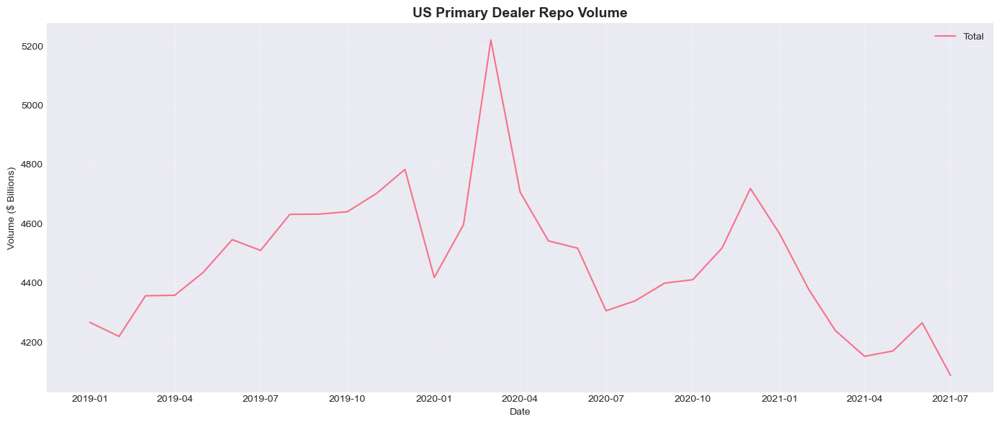


GCF Repo:


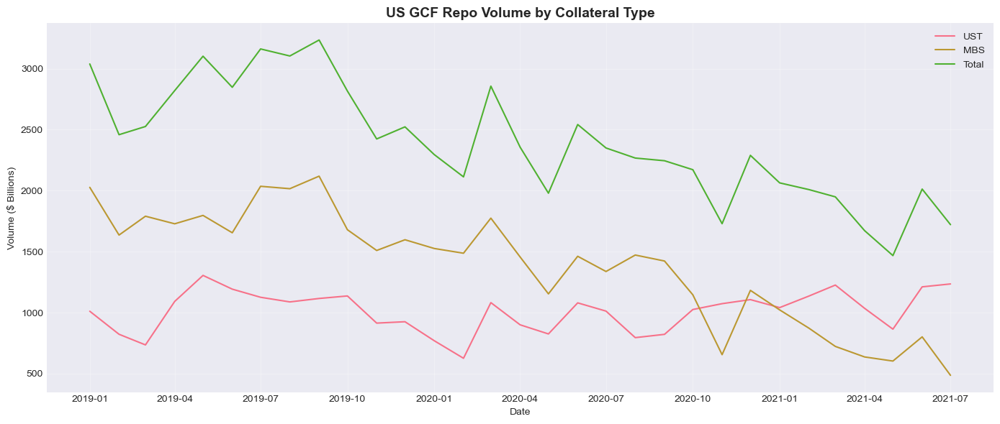


Triparty Repo:


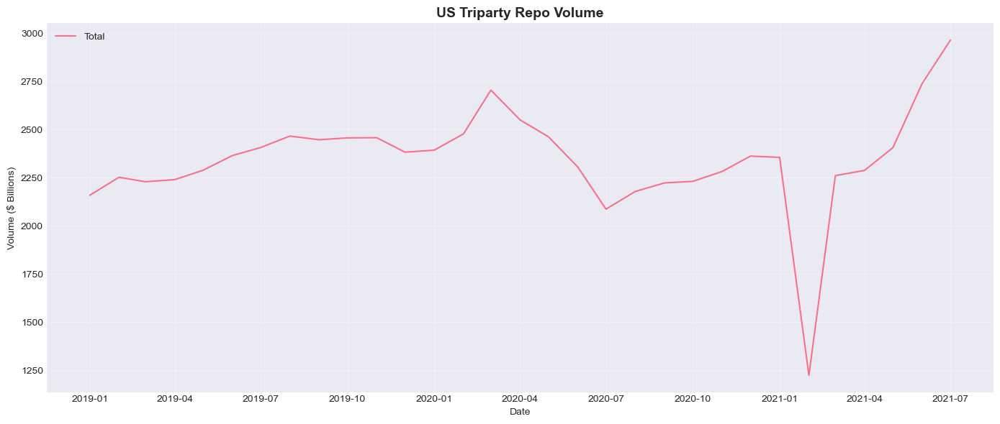



MACROECONOMIC CORRELATIONS
--------------------------------------------------------------------------------

Primary Dealer Repo:


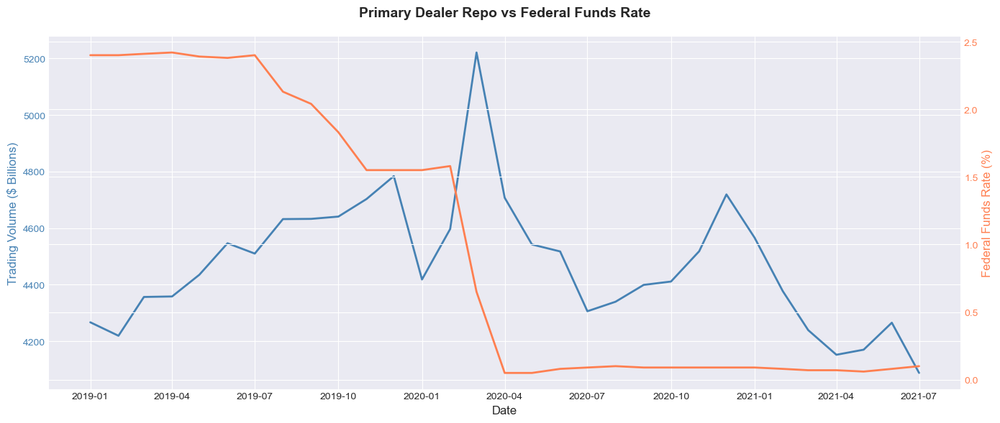

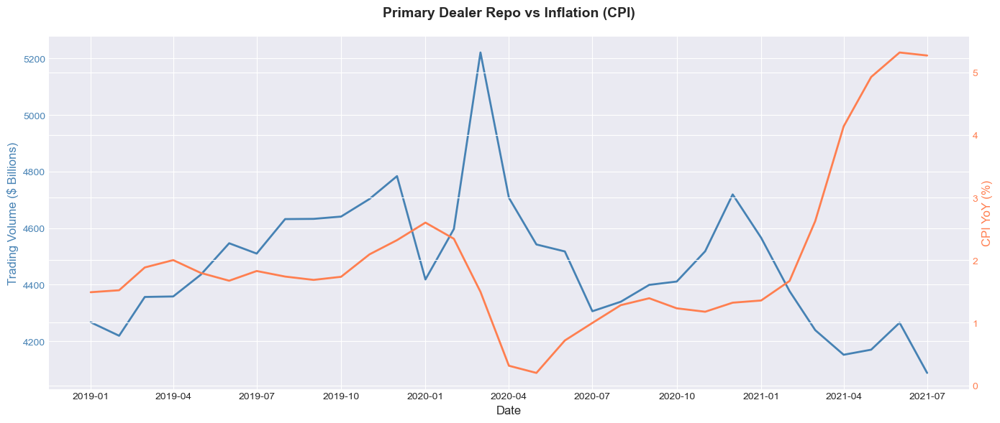

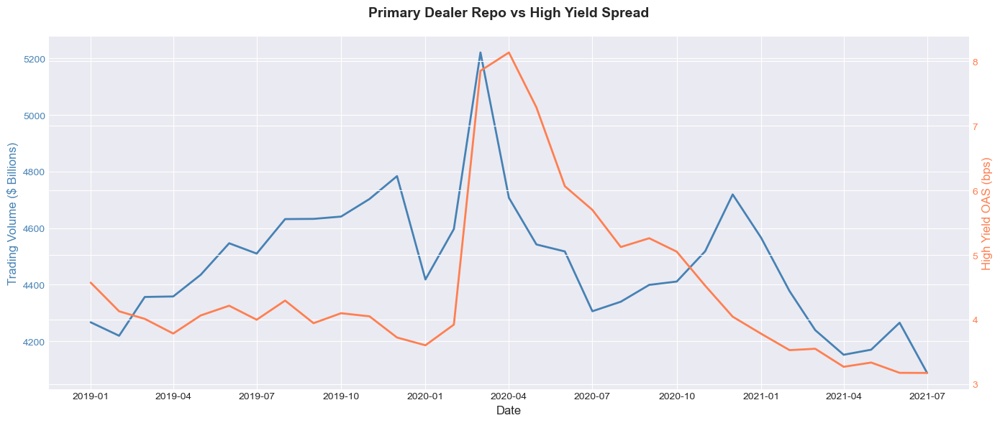


Primary Dealer - Correlation with Macro Indicators:
  Federal Funds Rate......................  0.118
  CPI YoY................................. -0.487
  High Yield Spread.......................  0.511


GCF Repo:


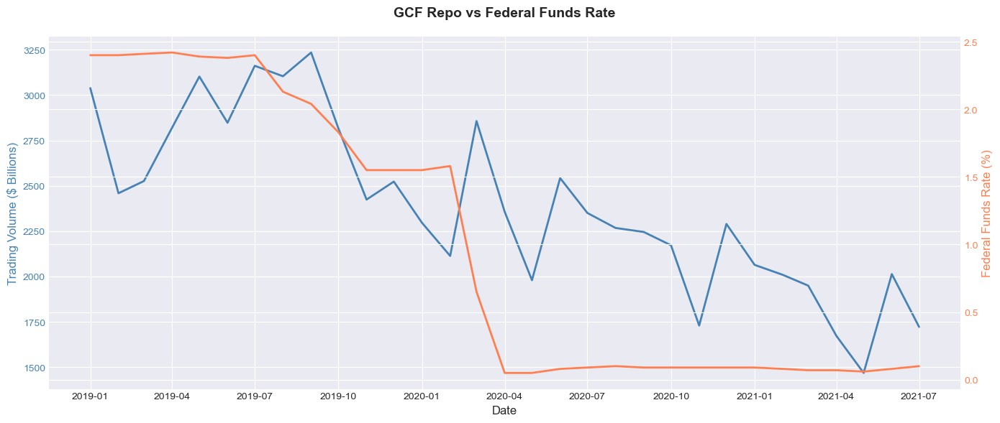

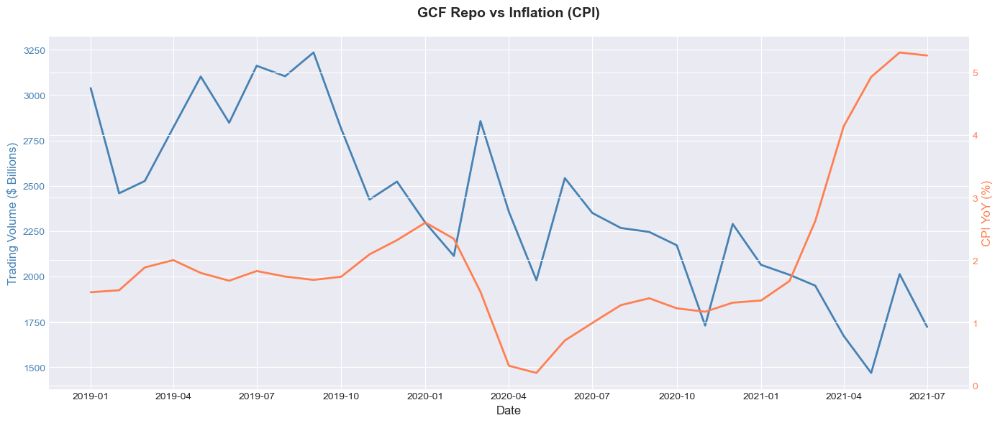

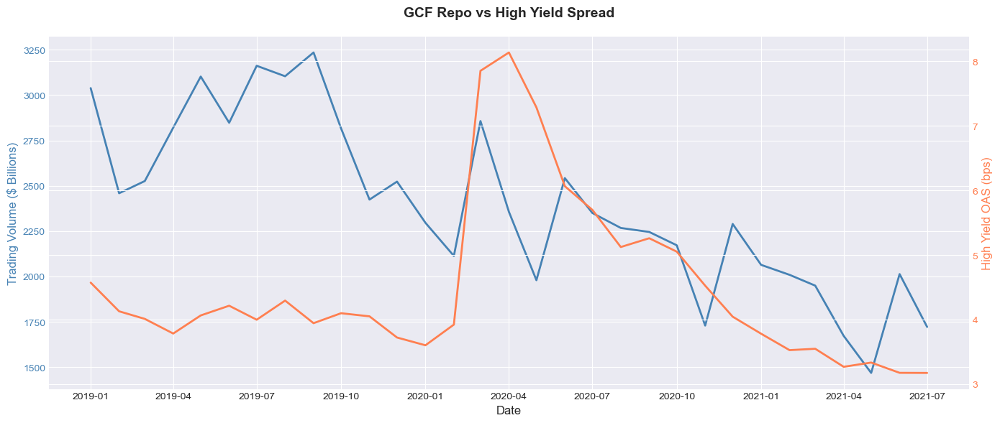


GCF Repo - Correlation with Macro Indicators:
  Federal Funds Rate......................  0.767
  CPI YoY................................. -0.424
  High Yield Spread.......................  0.148


Triparty Repo:


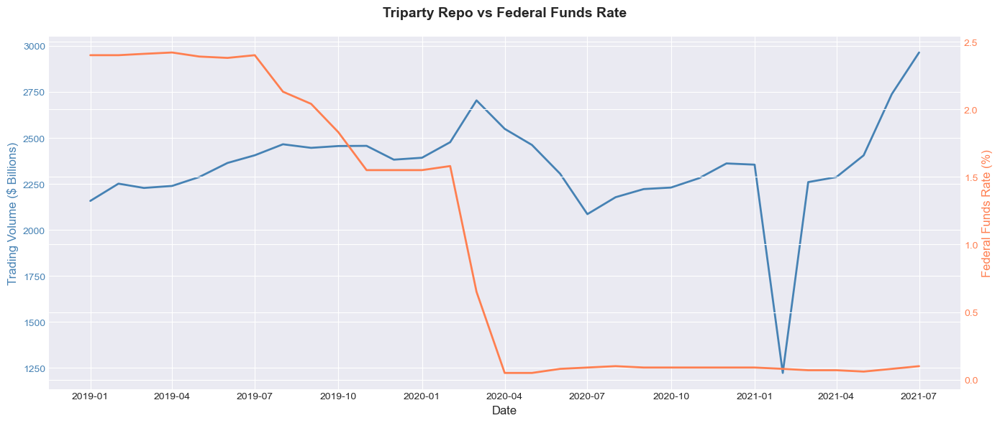

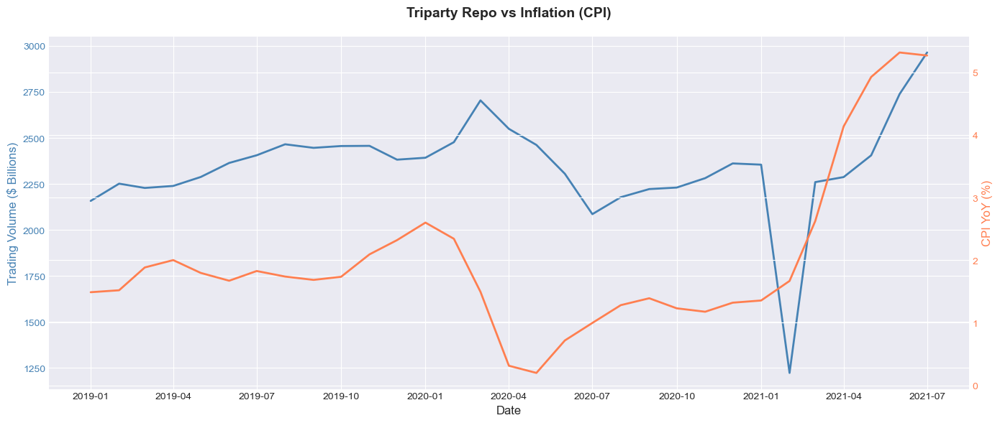

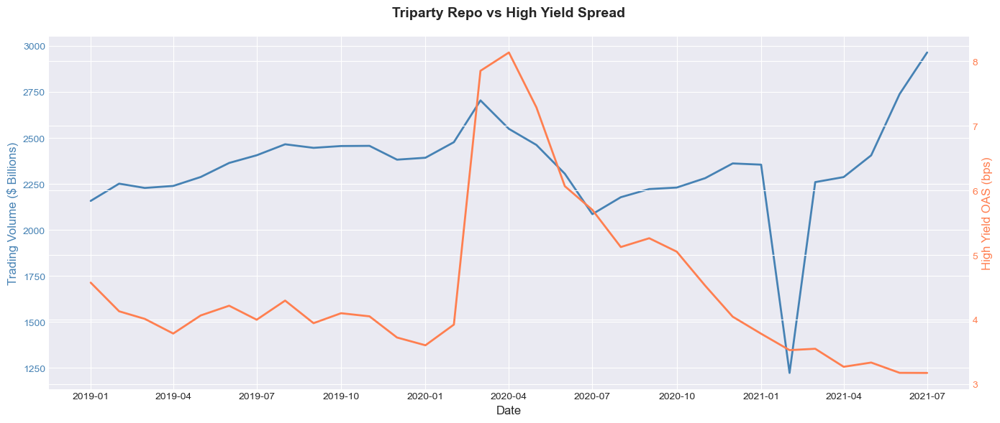


Triparty Repo - Correlation with Macro Indicators:
  Federal Funds Rate......................  0.032
  CPI YoY.................................  0.356
  High Yield Spread.......................  0.119


In [28]:
print("\n\n TIME SERIES PLOTS")
print("-" * 80)

# Primary Dealer
print("\nPrimary Dealer:")
plot_time_series(
    us_repo_primary_dealer,
    value_cols=primary_cols,
    title='US Primary Dealer Repo Volume',
    ylabel='Volume ($ Billions)'
)

# GCF Repo
print("\nGCF Repo:")
plot_time_series(
    us_repo_gcf_repo_index,
    value_cols=gcf_cols,
    title='US GCF Repo Volume by Collateral Type',
    ylabel='Volume ($ Billions)'
)

# Triparty Repo
print("\nTriparty Repo:")
plot_time_series(
    us_repo_triparty_repo,
    value_cols=triparty_cols,
    title='US Triparty Repo Volume',
    ylabel='Volume ($ Billions)'
)

print("\n\nMACROECONOMIC CORRELATIONS")
print("-" * 80)

# Prepare macro data
fed_funds_df = fed_funds_monthly.reset_index()
fed_funds_df.columns = ['Date', 'FedFunds']

cpi_yoy_df = cpi_yoy.reset_index()
cpi_yoy_df.columns = ['Date', 'CPI_YoY']

hy_spread_df = hy_spread_monthly.reset_index()
hy_spread_df.columns = ['Date', 'HY_OAS']

# PRIMARY DEALER - Macro Analysis
print("\nPrimary Dealer Repo:")
primary_macro = us_repo_primary_dealer[['Date', 'Total']].copy()
primary_macro = primary_macro.merge(fed_funds_df, on='Date', how='inner')
primary_macro = primary_macro.merge(cpi_yoy_df, on='Date', how='inner')
primary_macro = primary_macro.merge(hy_spread_df, on='Date', how='inner')

# Plot with Federal Funds Rate
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(primary_macro['Date'], primary_macro['Total'], color='steelblue', linewidth=2)
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Trading Volume ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(primary_macro['Date'], primary_macro['FedFunds'], color='coral', linewidth=2)
ax2.set_ylabel('Federal Funds Rate (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Primary Dealer Repo vs Federal Funds Rate', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with CPI
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(primary_macro['Date'], primary_macro['Total'], color='steelblue', linewidth=2)
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Trading Volume ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(primary_macro['Date'], primary_macro['CPI_YoY'], color='coral', linewidth=2)
ax2.set_ylabel('CPI YoY (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Primary Dealer Repo vs Inflation (CPI)', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with High Yield Spread
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(primary_macro['Date'], primary_macro['Total'], color='steelblue', linewidth=2)
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Trading Volume ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(primary_macro['Date'], primary_macro['HY_OAS'], color='coral', linewidth=2)
ax2.set_ylabel('High Yield OAS (bps)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Primary Dealer Repo vs High Yield Spread', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

correlations_primary = {
    'Federal Funds Rate': primary_macro[['Total', 'FedFunds']].corr().iloc[0, 1],
    'CPI YoY': primary_macro[['Total', 'CPI_YoY']].corr().iloc[0, 1],
    'High Yield Spread': primary_macro[['Total', 'HY_OAS']].corr().iloc[0, 1]
}

print("\nPrimary Dealer - Correlation with Macro Indicators:")
for indicator, corr in correlations_primary.items():
    print(f"  {indicator:.<40} {corr:>6.3f}")

# GCF REPO - Macro Analysis
print("\n\nGCF Repo:")
gcf_macro = us_repo_gcf_repo_index[['Date', 'Total']].copy()
gcf_macro = gcf_macro.merge(fed_funds_df, on='Date', how='inner')
gcf_macro = gcf_macro.merge(cpi_yoy_df, on='Date', how='inner')
gcf_macro = gcf_macro.merge(hy_spread_df, on='Date', how='inner')

# Plot with Federal Funds Rate
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(gcf_macro['Date'], gcf_macro['Total'], color='steelblue', linewidth=2)
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Trading Volume ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(gcf_macro['Date'], gcf_macro['FedFunds'], color='coral', linewidth=2)
ax2.set_ylabel('Federal Funds Rate (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('GCF Repo vs Federal Funds Rate', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with CPI
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(gcf_macro['Date'], gcf_macro['Total'], color='steelblue', linewidth=2)
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Trading Volume ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(gcf_macro['Date'], gcf_macro['CPI_YoY'], color='coral', linewidth=2)
ax2.set_ylabel('CPI YoY (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('GCF Repo vs Inflation (CPI)', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with High Yield Spread
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(gcf_macro['Date'], gcf_macro['Total'], color='steelblue', linewidth=2)
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Trading Volume ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(gcf_macro['Date'], gcf_macro['HY_OAS'], color='coral', linewidth=2)
ax2.set_ylabel('High Yield OAS (bps)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('GCF Repo vs High Yield Spread', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

correlations_gcf = {
    'Federal Funds Rate': gcf_macro[['Total', 'FedFunds']].corr().iloc[0, 1],
    'CPI YoY': gcf_macro[['Total', 'CPI_YoY']].corr().iloc[0, 1],
    'High Yield Spread': gcf_macro[['Total', 'HY_OAS']].corr().iloc[0, 1]
}

print("\nGCF Repo - Correlation with Macro Indicators:")
for indicator, corr in correlations_gcf.items():
    print(f"  {indicator:.<40} {corr:>6.3f}")

# TRIPARTY REPO - Macro Analysis
print("\n\nTriparty Repo:")
triparty_macro = us_repo_triparty_repo[['Date', 'Total']].copy()
triparty_macro = triparty_macro.merge(fed_funds_df, on='Date', how='inner')
triparty_macro = triparty_macro.merge(cpi_yoy_df, on='Date', how='inner')
triparty_macro = triparty_macro.merge(hy_spread_df, on='Date', how='inner')

# Plot with Federal Funds Rate
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(triparty_macro['Date'], triparty_macro['Total'], color='steelblue', linewidth=2)
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Trading Volume ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(triparty_macro['Date'], triparty_macro['FedFunds'], color='coral', linewidth=2)
ax2.set_ylabel('Federal Funds Rate (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Triparty Repo vs Federal Funds Rate', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with CPI
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(triparty_macro['Date'], triparty_macro['Total'], color='steelblue', linewidth=2)
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Trading Volume ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(triparty_macro['Date'], triparty_macro['CPI_YoY'], color='coral', linewidth=2)
ax2.set_ylabel('CPI YoY (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Triparty Repo vs Inflation (CPI)', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with High Yield Spread
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(triparty_macro['Date'], triparty_macro['Total'], color='steelblue', linewidth=2)
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Trading Volume ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(triparty_macro['Date'], triparty_macro['HY_OAS'], color='coral', linewidth=2)
ax2.set_ylabel('High Yield OAS (bps)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Triparty Repo vs High Yield Spread', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

correlations_triparty = {
    'Federal Funds Rate': triparty_macro[['Total', 'FedFunds']].corr().iloc[0, 1],
    'CPI YoY': triparty_macro[['Total', 'CPI_YoY']].corr().iloc[0, 1],
    'High Yield Spread': triparty_macro[['Total', 'HY_OAS']].corr().iloc[0, 1]
}

print("\nTriparty Repo - Correlation with Macro Indicators:")
for indicator, corr in correlations_triparty.items():
    print(f"  {indicator:.<40} {corr:>6.3f}")



 WITHIN-MARKET CORRELATIONS
--------------------------------------------------------------------------------
GCF Repo - Correlation Matrix Across Collateral Types



,UST,MBS,Total
UST,1.000,-0.125,0.227
MBS,-0.125,1.000,0.938
Total,0.227,0.938,1.000


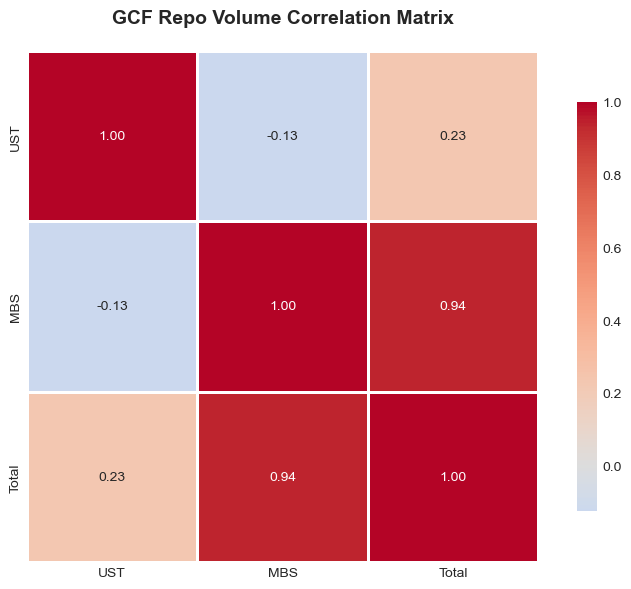



 KEY OBSERVATIONS
--------------------------------------------------------------------------------

Primary Dealer Repo:

   - Average monthly volume: $4,472.00B
   - Standard deviation: $229.88B  
   - Coefficient of variation: 5.1%
   - Time trend correlation: -0.259
   - Fed Funds correlation: 0.118
   - CPI correlation: -0.487
   - HY Spread correlation: 0.511


GCF Repo:

   - Average monthly volume: $2,391.98B
   - Standard deviation: $475.93B  
   - Coefficient of variation: 19.9%
   - Time trend correlation: -0.826
   - Fed Funds correlation: 0.767
   - CPI correlation: -0.424
   - HY Spread correlation: 0.148
   - Cross-collateral avg correlation: 0.347
   - Cross-collateral correlation range: [-0.125, 0.938]


Triparty Repo:

   - Average monthly volume: $2,342.54B
   - Standard deviation: $275.14B  
   - Coefficient of variation: 11.7%
   - Time trend correlation: 0.037
   - Fed Funds correlation: 0.032
   - CPI correlation: 0.356
   - HY Spread correlation: 0.119



In [29]:
print("\n\n WITHIN-MARKET CORRELATIONS")
print("-" * 80)

# GCF Repo Correlation Matrix (only one with multiple columns)
print("GCF Repo - Correlation Matrix Across Collateral Types\n")

gcf_corr = us_repo_gcf_repo_index[gcf_cols].corr()
display(gcf_corr.round(3))

fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(
    gcf_corr, 
    annot=True, 
    fmt='.2f', 
    cmap='coolwarm',
    center=0,
    square=True,
    linewidths=1,
    cbar_kws={"shrink": 0.8},
    ax=ax
)
ax.set_title('GCF Repo Volume Correlation Matrix', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

print("\n\n KEY OBSERVATIONS")
print("-" * 80)

# Primary Dealer
print("\nPrimary Dealer Repo:")
primary_volume = us_repo_primary_dealer['Total']
print(f"""
   - Average monthly volume: ${primary_volume.mean():,.2f}B
   - Standard deviation: ${primary_volume.std():,.2f}B  
   - Coefficient of variation: {(primary_volume.std() / primary_volume.mean() * 100):.1f}%
   - Time trend correlation: {np.corrcoef(np.arange(len(us_repo_primary_dealer)), primary_volume)[0, 1]:.3f}
   - Fed Funds correlation: {correlations_primary['Federal Funds Rate']:.3f}
   - CPI correlation: {correlations_primary['CPI YoY']:.3f}
   - HY Spread correlation: {correlations_primary['High Yield Spread']:.3f}
""")

# GCF Repo
print("\nGCF Repo:")
gcf_volume = us_repo_gcf_repo_index['Total']
avg_corr_gcf = gcf_corr.values[np.triu_indices_from(gcf_corr.values, k=1)].mean()
corr_range_min_gcf = gcf_corr.values[np.triu_indices_from(gcf_corr.values, k=1)].min()
corr_range_max_gcf = gcf_corr.values[np.triu_indices_from(gcf_corr.values, k=1)].max()

print(f"""
   - Average monthly volume: ${gcf_volume.mean():,.2f}B
   - Standard deviation: ${gcf_volume.std():,.2f}B  
   - Coefficient of variation: {(gcf_volume.std() / gcf_volume.mean() * 100):.1f}%
   - Time trend correlation: {np.corrcoef(np.arange(len(us_repo_gcf_repo_index)), gcf_volume)[0, 1]:.3f}
   - Fed Funds correlation: {correlations_gcf['Federal Funds Rate']:.3f}
   - CPI correlation: {correlations_gcf['CPI YoY']:.3f}
   - HY Spread correlation: {correlations_gcf['High Yield Spread']:.3f}
   - Cross-collateral avg correlation: {avg_corr_gcf:.3f}
   - Cross-collateral correlation range: [{corr_range_min_gcf:.3f}, {corr_range_max_gcf:.3f}]
""")

# Triparty Repo
print("\nTriparty Repo:")
triparty_volume = us_repo_triparty_repo['Total']
print(f"""
   - Average monthly volume: ${triparty_volume.mean():,.2f}B
   - Standard deviation: ${triparty_volume.std():,.2f}B  
   - Coefficient of variation: {(triparty_volume.std() / triparty_volume.mean() * 100):.1f}%
   - Time trend correlation: {np.corrcoef(np.arange(len(us_repo_triparty_repo)), triparty_volume)[0, 1]:.3f}
   - Fed Funds correlation: {correlations_triparty['Federal Funds Rate']:.3f}
   - CPI correlation: {correlations_triparty['CPI YoY']:.3f}
   - HY Spread correlation: {correlations_triparty['High Yield Spread']:.3f}
""")

### 3. US Equity Issuance and Trading Volumes

In [30]:
# ============================================================================
# 3. EQUITY MARKETS ANALYSIS
# ============================================================================

print("=" * 80)
print("EQUITY MARKETS ANALYSIS")
print("=" * 80)

# Equity Issuance
print("\n EQUITY ISSUANCE")
print("-" * 80)

issuance_cols = ['IPOs', 'Secondaries', 'Total CS', 'Preferred Stock', 'Total Equity', 'Total']
issuance_stats = calculate_descriptive_stats(us_equity_issuance, issuance_cols)

print("\nEquity Issuance Statistics ($ Billions)")
display(issuance_stats)

# Equity Trading Volume
print("\n\n EQUITY TRADING VOLUME")
print("-" * 80)

trading_cols = ['ICE', 'Nasdaq', 'Cboe', 'Other', 'Off Exchange', 'Total']
trading_stats = calculate_descriptive_stats(us_equity_trading_volume, trading_cols)

print("\nEquity Trading Volume Statistics ($ Billions)")
display(trading_stats)

EQUITY MARKETS ANALYSIS

 EQUITY ISSUANCE
--------------------------------------------------------------------------------

Equity Issuance Statistics ($ Billions)


,IPOs,Secondaries,Total CS,Preferred Stock,Total Equity,Total
count,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000
mean,7.471241,17.341072,24.812313,3.859031,28.671343,53.483656
std,6.445746,11.075111,14.499293,2.555509,15.380868,29.783730
min,0.291720,2.772290,4.309900,0.300000,4.609900,8.919800
25%,2.264663,9.557643,13.542357,1.960500,16.205545,30.450590
50%,5.609700,15.550035,22.592120,3.521250,27.772865,50.507830
75%,12.632475,19.815112,31.681000,5.286187,33.718690,64.601930
max,25.117660,50.413650,64.589100,11.825000,68.871100,133.460200
skew,0.877060,1.679566,0.858079,1.077867,0.731265,0.802828
kurtosis,0.098977,3.246304,0.409868,1.610577,0.199622,0.326064




 EQUITY TRADING VOLUME
--------------------------------------------------------------------------------

Equity Trading Volume Statistics ($ Billions)


,ICE,Nasdaq,Cboe,Other,Off Exchange,Total
count,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000
mean,97.133110,95.494319,68.735683,14.819749,163.633875,439.816736
std,22.166982,23.492098,17.602257,7.147068,45.301030,111.367429
min,63.609595,62.714480,46.911581,8.055347,100.402738,289.503854
25%,78.092737,75.324364,54.439104,9.445738,115.126298,332.672425
50%,93.933451,97.760521,68.252529,10.666286,171.595495,444.240182
75%,111.391928,108.060157,77.282338,20.406228,197.897559,513.002325
max,152.929944,146.684703,122.024245,27.654183,249.850167,665.774889
skew,0.729744,0.450213,1.014291,0.850179,0.088534,0.355214
kurtosis,0.035034,-0.531496,1.314014,-0.988885,-1.295477,-0.882350




 TIME SERIES PLOTS
--------------------------------------------------------------------------------

Equity Issuance:


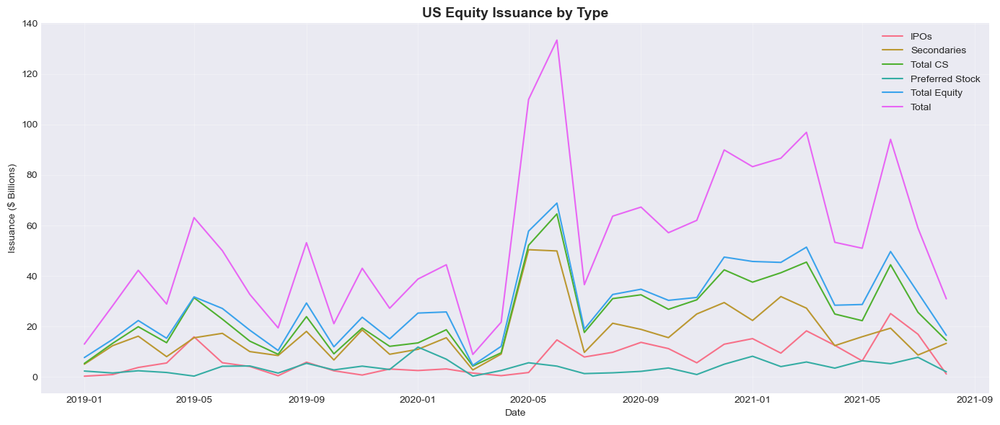


Equity Trading Volume:


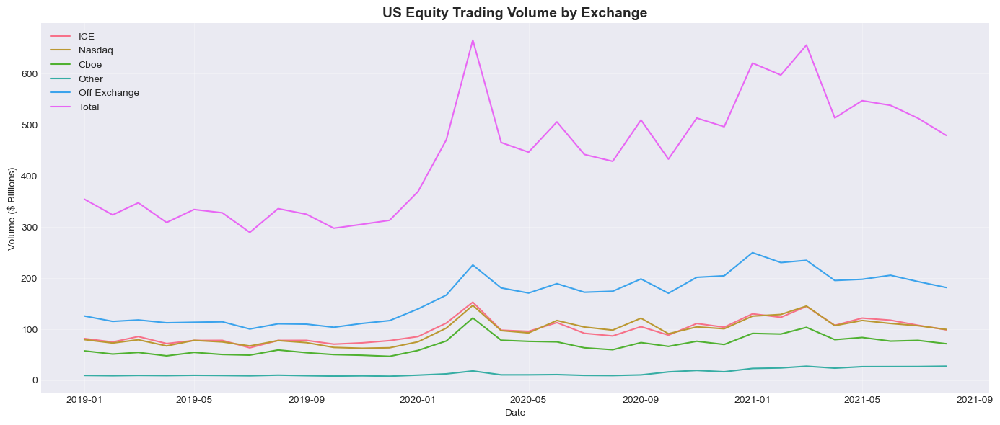



MACROECONOMIC CORRELATIONS
--------------------------------------------------------------------------------

Equity Issuance:


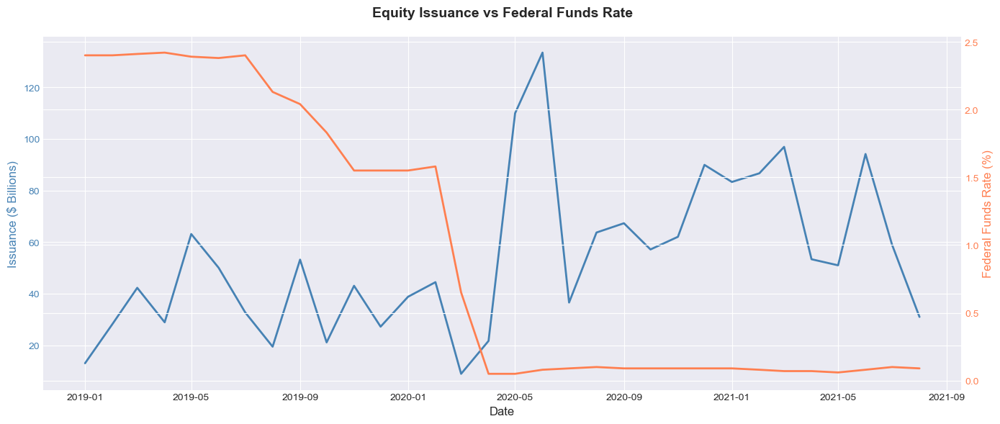

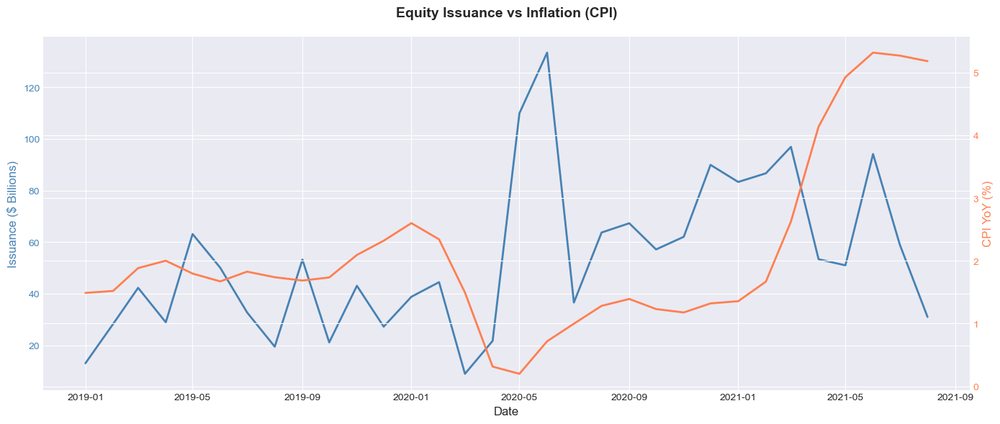

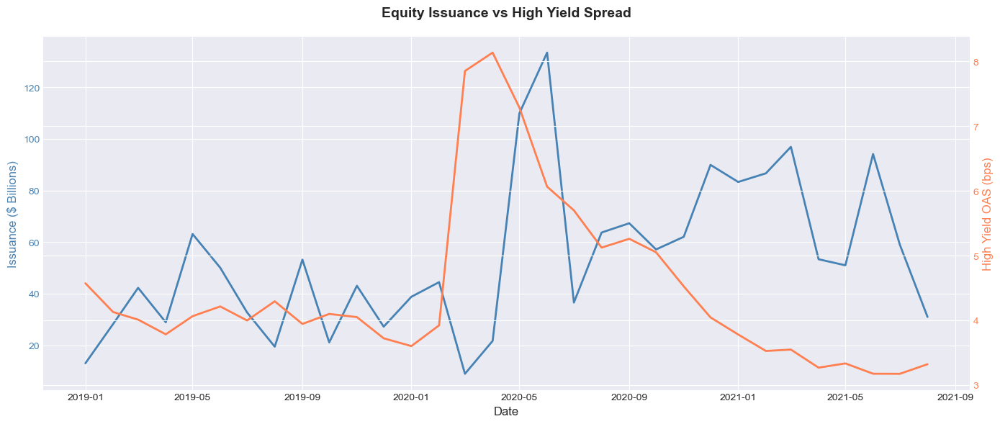


Equity Issuance - Correlation with Macro Indicators:
  Federal Funds Rate...................... -0.542
  CPI YoY................................. -0.046
  High Yield Spread....................... -0.022


Equity Trading Volume:


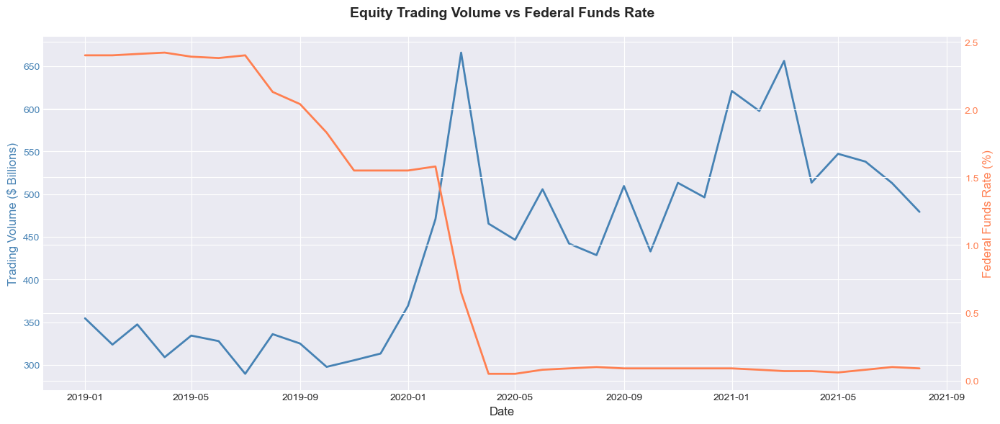

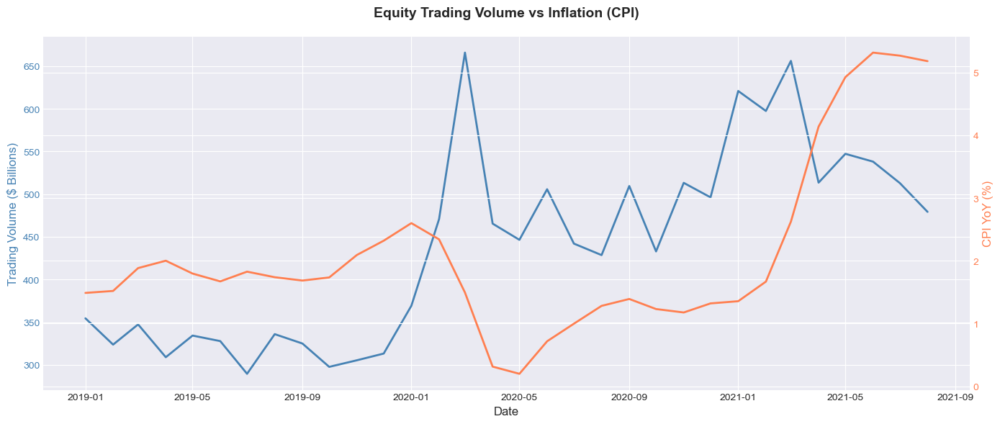

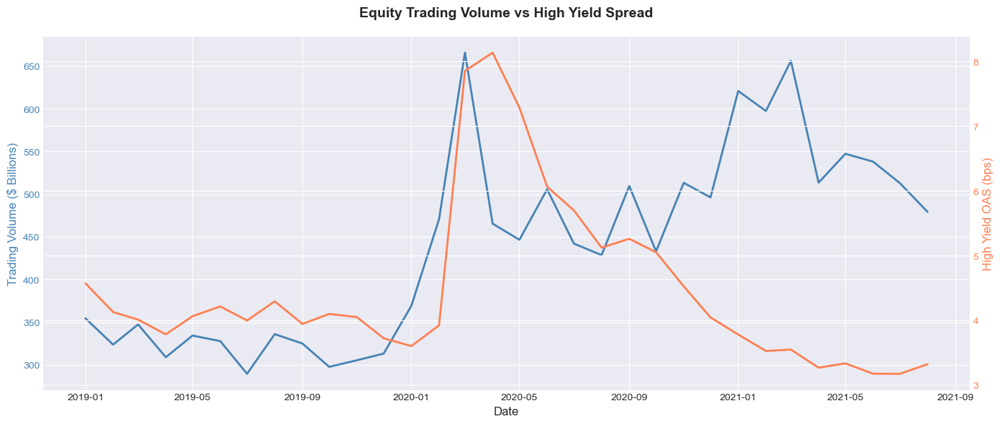


Equity Trading Volume - Correlation with Macro Indicators:
  Federal Funds Rate...................... -0.803
  CPI YoY.................................  0.201
  High Yield Spread.......................  0.155


In [31]:
print("\n\n TIME SERIES PLOTS")
print("-" * 80)

# Equity Issuance
print("\nEquity Issuance:")
plot_time_series(
    us_equity_issuance,
    value_cols=issuance_cols,
    title='US Equity Issuance by Type',
    ylabel='Issuance ($ Billions)'
)

# Equity Trading Volume
print("\nEquity Trading Volume:")
plot_time_series(
    us_equity_trading_volume,
    value_cols=trading_cols,
    title='US Equity Trading Volume by Exchange',
    ylabel='Volume ($ Billions)'
)

print("\n\nMACROECONOMIC CORRELATIONS")
print("-" * 80)

# Prepare macro data
fed_funds_df = fed_funds_monthly.reset_index()
fed_funds_df.columns = ['Date', 'FedFunds']

cpi_yoy_df = cpi_yoy.reset_index()
cpi_yoy_df.columns = ['Date', 'CPI_YoY']

hy_spread_df = hy_spread_monthly.reset_index()
hy_spread_df.columns = ['Date', 'HY_OAS']

# EQUITY ISSUANCE - Macro Analysis
print("\nEquity Issuance:")
issuance_macro = us_equity_issuance[['Date', 'Total']].copy()
issuance_macro = issuance_macro.merge(fed_funds_df, on='Date', how='inner')
issuance_macro = issuance_macro.merge(cpi_yoy_df, on='Date', how='inner')
issuance_macro = issuance_macro.merge(hy_spread_df, on='Date', how='inner')

# Plot with Federal Funds Rate
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(issuance_macro['Date'], issuance_macro['Total'], color='steelblue', linewidth=2)
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Issuance ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(issuance_macro['Date'], issuance_macro['FedFunds'], color='coral', linewidth=2)
ax2.set_ylabel('Federal Funds Rate (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Equity Issuance vs Federal Funds Rate', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with CPI
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(issuance_macro['Date'], issuance_macro['Total'], color='steelblue', linewidth=2)
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Issuance ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(issuance_macro['Date'], issuance_macro['CPI_YoY'], color='coral', linewidth=2)
ax2.set_ylabel('CPI YoY (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Equity Issuance vs Inflation (CPI)', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with High Yield Spread
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(issuance_macro['Date'], issuance_macro['Total'], color='steelblue', linewidth=2)
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Issuance ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(issuance_macro['Date'], issuance_macro['HY_OAS'], color='coral', linewidth=2)
ax2.set_ylabel('High Yield OAS (bps)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Equity Issuance vs High Yield Spread', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

correlations_issuance = {
    'Federal Funds Rate': issuance_macro[['Total', 'FedFunds']].corr().iloc[0, 1],
    'CPI YoY': issuance_macro[['Total', 'CPI_YoY']].corr().iloc[0, 1],
    'High Yield Spread': issuance_macro[['Total', 'HY_OAS']].corr().iloc[0, 1]
}

print("\nEquity Issuance - Correlation with Macro Indicators:")
for indicator, corr in correlations_issuance.items():
    print(f"  {indicator:.<40} {corr:>6.3f}")

# EQUITY TRADING VOLUME - Macro Analysis
print("\n\nEquity Trading Volume:")
trading_macro = us_equity_trading_volume[['Date', 'Total']].copy()
trading_macro = trading_macro.merge(fed_funds_df, on='Date', how='inner')
trading_macro = trading_macro.merge(cpi_yoy_df, on='Date', how='inner')
trading_macro = trading_macro.merge(hy_spread_df, on='Date', how='inner')

# Plot with Federal Funds Rate
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(trading_macro['Date'], trading_macro['Total'], color='steelblue', linewidth=2)
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Trading Volume ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(trading_macro['Date'], trading_macro['FedFunds'], color='coral', linewidth=2)
ax2.set_ylabel('Federal Funds Rate (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Equity Trading Volume vs Federal Funds Rate', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with CPI
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(trading_macro['Date'], trading_macro['Total'], color='steelblue', linewidth=2)
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Trading Volume ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(trading_macro['Date'], trading_macro['CPI_YoY'], color='coral', linewidth=2)
ax2.set_ylabel('CPI YoY (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Equity Trading Volume vs Inflation (CPI)', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with High Yield Spread
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(trading_macro['Date'], trading_macro['Total'], color='steelblue', linewidth=2)
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Trading Volume ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(trading_macro['Date'], trading_macro['HY_OAS'], color='coral', linewidth=2)
ax2.set_ylabel('High Yield OAS (bps)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Equity Trading Volume vs High Yield Spread', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

correlations_trading = {
    'Federal Funds Rate': trading_macro[['Total', 'FedFunds']].corr().iloc[0, 1],
    'CPI YoY': trading_macro[['Total', 'CPI_YoY']].corr().iloc[0, 1],
    'High Yield Spread': trading_macro[['Total', 'HY_OAS']].corr().iloc[0, 1]
}

print("\nEquity Trading Volume - Correlation with Macro Indicators:")
for indicator, corr in correlations_trading.items():
    print(f"  {indicator:.<40} {corr:>6.3f}")



 WITHIN-MARKET CORRELATIONS
--------------------------------------------------------------------------------
Equity Issuance - Correlation Matrix Across Issuance Types



,IPOs,Secondaries,Total CS,Preferred Stock,Total Equity,Total
IPOs,1.000,0.322,0.691,0.221,0.688,0.692
Secondaries,0.322,1.000,0.907,0.221,0.892,0.902
Total CS,0.691,0.907,1.000,0.267,0.987,0.997
Preferred Stock,0.221,0.221,0.267,1.000,0.418,0.346
Total Equity,0.688,0.892,0.987,0.418,1.000,0.997
Total,0.692,0.902,0.997,0.346,0.997,1.000


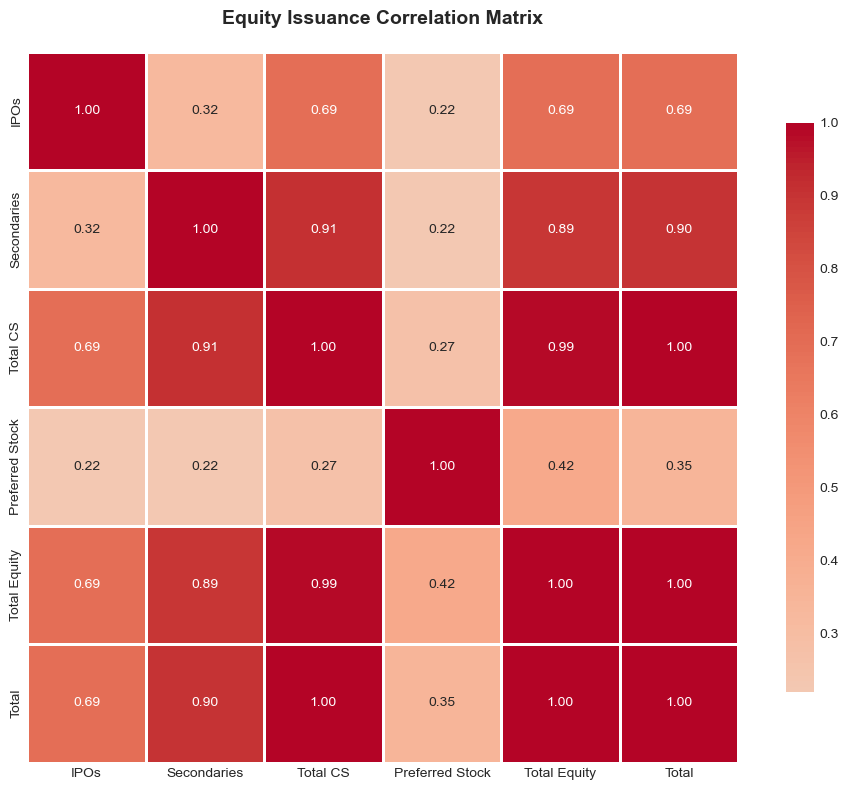



Equity Trading Volume - Correlation Matrix Across Exchanges



,ICE,Nasdaq,Cboe,Other,Off Exchange,Total
ICE,1.000,0.959,0.967,0.743,0.921,0.977
Nasdaq,0.959,1.000,0.942,0.702,0.940,0.978
Cboe,0.967,0.942,1.000,0.700,0.891,0.957
Other,0.743,0.702,0.700,1.000,0.765,0.782
Off Exchange,0.921,0.940,0.891,0.765,1.000,0.978
Total,0.977,0.978,0.957,0.782,0.978,1.000


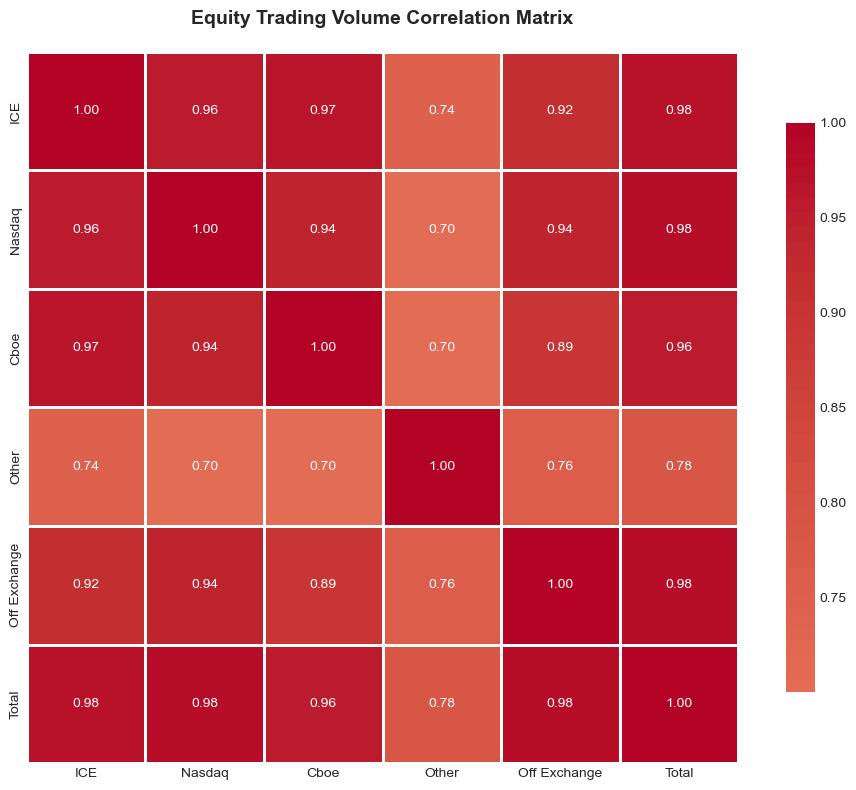



 KEY OBSERVATIONS
--------------------------------------------------------------------------------

Equity Issuance:

   - Average monthly issuance: $53.48B
   - Standard deviation: $29.78B  
   - Coefficient of variation: 55.7%
   - Time trend correlation: 0.489
   - Fed Funds correlation: -0.542
   - CPI correlation: -0.046
   - HY Spread correlation: -0.022
   - Cross-type avg correlation: 0.637
   - Cross-type correlation range: [0.221, 0.997]


Equity Trading Volume:

   - Average monthly volume: $439.82B
   - Standard deviation: $111.37B  
   - Coefficient of variation: 25.3%
   - Time trend correlation: 0.779
   - Fed Funds correlation: -0.803
   - CPI correlation: 0.201
   - HY Spread correlation: 0.155
   - Cross-exchange avg correlation: 0.880
   - Cross-exchange correlation range: [0.700, 0.978]



In [33]:
print("\n\n WITHIN-MARKET CORRELATIONS")
print("-" * 80)

# Equity Issuance Correlation Matrix
print("Equity Issuance - Correlation Matrix Across Issuance Types\n")

issuance_corr = us_equity_issuance[issuance_cols].corr()
display(issuance_corr.round(3))

fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(
    issuance_corr, 
    annot=True, 
    fmt='.2f', 
    cmap='coolwarm',
    center=0,
    square=True,
    linewidths=1,
    cbar_kws={"shrink": 0.8},
    ax=ax
)
ax.set_title('Equity Issuance Correlation Matrix', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Equity Trading Volume Correlation Matrix
print("\n\nEquity Trading Volume - Correlation Matrix Across Exchanges\n")

trading_corr = us_equity_trading_volume[trading_cols].corr()
display(trading_corr.round(3))

fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(
    trading_corr, 
    annot=True, 
    fmt='.2f', 
    cmap='coolwarm',
    center=0,
    square=True,
    linewidths=1,
    cbar_kws={"shrink": 0.8},
    ax=ax
)
ax.set_title('Equity Trading Volume Correlation Matrix', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

print("\n\n KEY OBSERVATIONS")
print("-" * 80)

# Equity Issuance
print("\nEquity Issuance:")
issuance_volume = us_equity_issuance['Total']
avg_corr_issuance = issuance_corr.values[np.triu_indices_from(issuance_corr.values, k=1)].mean()
corr_range_min_issuance = issuance_corr.values[np.triu_indices_from(issuance_corr.values, k=1)].min()
corr_range_max_issuance = issuance_corr.values[np.triu_indices_from(issuance_corr.values, k=1)].max()

print(f"""
   - Average monthly issuance: ${issuance_volume.mean():,.2f}B
   - Standard deviation: ${issuance_volume.std():,.2f}B  
   - Coefficient of variation: {(issuance_volume.std() / issuance_volume.mean() * 100):.1f}%
   - Time trend correlation: {np.corrcoef(np.arange(len(us_equity_issuance)), issuance_volume)[0, 1]:.3f}
   - Fed Funds correlation: {correlations_issuance['Federal Funds Rate']:.3f}
   - CPI correlation: {correlations_issuance['CPI YoY']:.3f}
   - HY Spread correlation: {correlations_issuance['High Yield Spread']:.3f}
   - Cross-type avg correlation: {avg_corr_issuance:.3f}
   - Cross-type correlation range: [{corr_range_min_issuance:.3f}, {corr_range_max_issuance:.3f}]
""")

# Equity Trading Volume
print("\nEquity Trading Volume:")
trading_volume = us_equity_trading_volume['Total']
avg_corr_trading = trading_corr.values[np.triu_indices_from(trading_corr.values, k=1)].mean()
corr_range_min_trading = trading_corr.values[np.triu_indices_from(trading_corr.values, k=1)].min()
corr_range_max_trading = trading_corr.values[np.triu_indices_from(trading_corr.values, k=1)].max()

print(f"""
   - Average monthly volume: ${trading_volume.mean():,.2f}B
   - Standard deviation: ${trading_volume.std():,.2f}B  
   - Coefficient of variation: {(trading_volume.std() / trading_volume.mean() * 100):.1f}%
   - Time trend correlation: {np.corrcoef(np.arange(len(us_equity_trading_volume)), trading_volume)[0, 1]:.3f}
   - Fed Funds correlation: {correlations_trading['Federal Funds Rate']:.3f}
   - CPI correlation: {correlations_trading['CPI YoY']:.3f}
   - HY Spread correlation: {correlations_trading['High Yield Spread']:.3f}
   - Cross-exchange avg correlation: {avg_corr_trading:.3f}
   - Cross-exchange correlation range: [{corr_range_min_trading:.3f}, {corr_range_max_trading:.3f}]
""")

### 4. US Fixed Income Trading Volume

In [34]:
# ============================================================================
# 4. FIXED INCOME TRADING VOLUME ANALYSIS
# ============================================================================

print("=" * 80)
print("FIXED INCOME TRADING VOLUME ANALYSIS")
print("=" * 80)

fixed_cols = ['Treasury', 'Agency MBS', 'Non-Agency MBS', 'Corporate Debt', 'Municipal', 'Total']

print("\n DESCRIPTIVE STATISTICS")
print("-" * 80)

fixed_stats = calculate_descriptive_stats(us_fixed_trading_volume, fixed_cols)

print("\nFixed Income Trading Volume Statistics ($ Billions)")
display(fixed_stats)

FIXED INCOME TRADING VOLUME ANALYSIS

 DESCRIPTIVE STATISTICS
--------------------------------------------------------------------------------

Fixed Income Trading Volume Statistics ($ Billions)


,Treasury,Agency MBS,Non-Agency MBS,Corporate Debt,Municipal,Total
count,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000
mean,605.806374,275.584935,2.932057,37.303413,11.136000,938.695035
std,84.253965,34.000580,0.830445,5.960060,2.708012,110.321233
min,492.474800,227.080689,1.988509,26.633952,7.671000,795.415093
25%,541.441825,250.699667,2.523090,32.685527,9.666500,857.363880
50%,602.202000,270.821550,2.758759,37.638455,11.118000,910.941622
75%,650.465750,294.104708,3.108952,40.479578,11.908000,984.214629
max,915.461250,366.348537,6.494620,49.872955,23.419000,1338.209344
skew,1.601455,0.783657,2.834247,0.361321,3.127869,1.703724
kurtosis,4.841036,0.545265,10.993826,-0.463414,14.227244,4.443946




 TIME SERIES PLOTS
--------------------------------------------------------------------------------


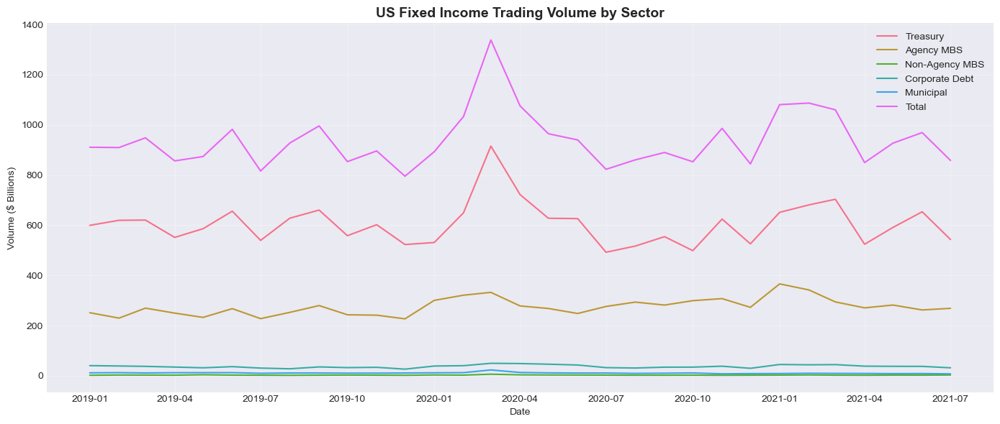



MACROECONOMIC CORRELATIONS
--------------------------------------------------------------------------------


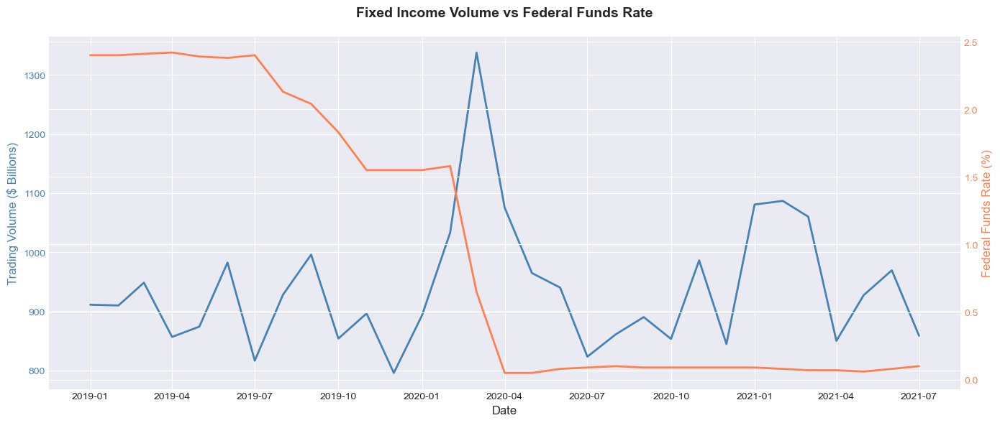

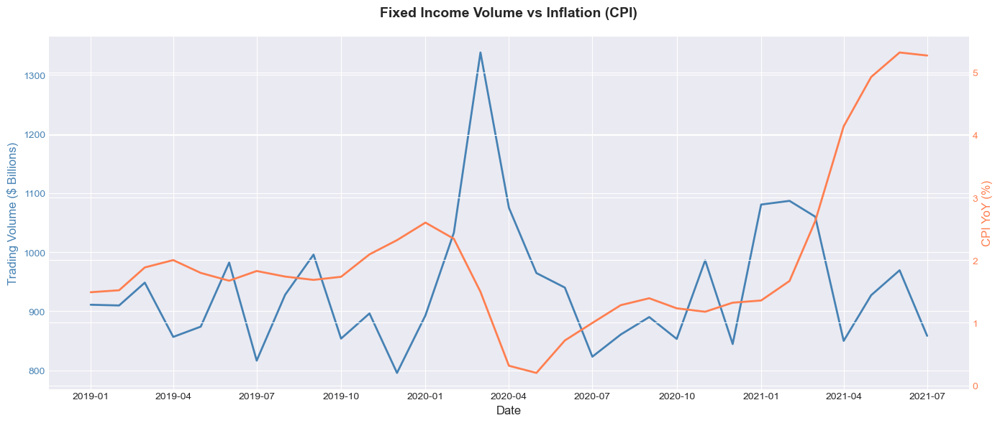

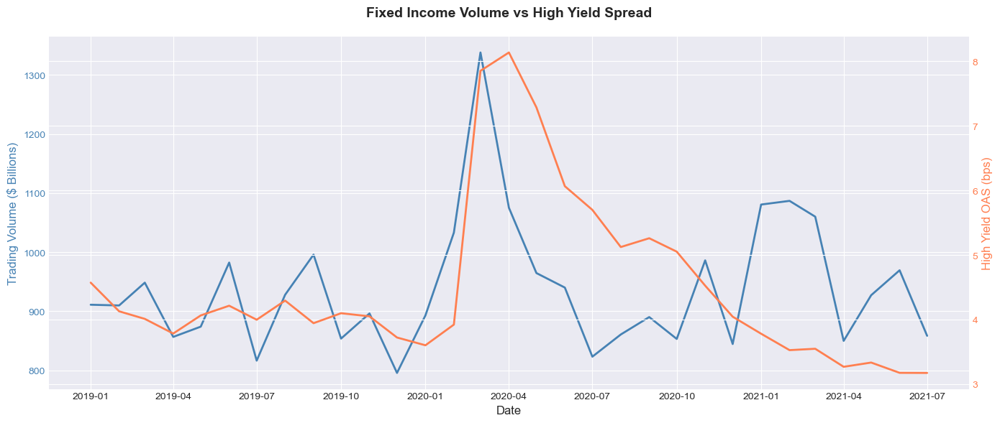


Correlation with Macro Indicators:
--------------------------------------------------------------------------------
  Federal Funds Rate...................... -0.199
  CPI YoY................................. -0.149
  High Yield Spread.......................  0.414


In [35]:
print("\n\n TIME SERIES PLOTS")
print("-" * 80)

plot_time_series(
    us_fixed_trading_volume,
    value_cols=fixed_cols,
    title='US Fixed Income Trading Volume by Sector',
    ylabel='Volume ($ Billions)'
)

print("\n\nMACROECONOMIC CORRELATIONS")
print("-" * 80)

# Prepare macro data
fed_funds_df = fed_funds_monthly.reset_index()
fed_funds_df.columns = ['Date', 'FedFunds']

cpi_yoy_df = cpi_yoy.reset_index()
cpi_yoy_df.columns = ['Date', 'CPI_YoY']

hy_spread_df = hy_spread_monthly.reset_index()
hy_spread_df.columns = ['Date', 'HY_OAS']

# Merge data for analysis
fixed_macro = us_fixed_trading_volume[['Date', 'Total']].copy()
fixed_macro = fixed_macro.merge(fed_funds_df, on='Date', how='inner')
fixed_macro = fixed_macro.merge(cpi_yoy_df, on='Date', how='inner')
fixed_macro = fixed_macro.merge(hy_spread_df, on='Date', how='inner')

# Plot with Federal Funds Rate
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(fixed_macro['Date'], fixed_macro['Total'], color='steelblue', linewidth=2)
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Trading Volume ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(fixed_macro['Date'], fixed_macro['FedFunds'], color='coral', linewidth=2)
ax2.set_ylabel('Federal Funds Rate (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Fixed Income Volume vs Federal Funds Rate', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with CPI
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(fixed_macro['Date'], fixed_macro['Total'], color='steelblue', linewidth=2)
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Trading Volume ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(fixed_macro['Date'], fixed_macro['CPI_YoY'], color='coral', linewidth=2)
ax2.set_ylabel('CPI YoY (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Fixed Income Volume vs Inflation (CPI)', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with High Yield Spread
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(fixed_macro['Date'], fixed_macro['Total'], color='steelblue', linewidth=2)
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Trading Volume ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(fixed_macro['Date'], fixed_macro['HY_OAS'], color='coral', linewidth=2)
ax2.set_ylabel('High Yield OAS (bps)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Fixed Income Volume vs High Yield Spread', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Calculate and print correlations
print("\nCorrelation with Macro Indicators:")
print("-" * 80)

correlations_fixed = {
    'Federal Funds Rate': fixed_macro[['Total', 'FedFunds']].corr().iloc[0, 1],
    'CPI YoY': fixed_macro[['Total', 'CPI_YoY']].corr().iloc[0, 1],
    'High Yield Spread': fixed_macro[['Total', 'HY_OAS']].corr().iloc[0, 1]
}

for indicator, corr in correlations_fixed.items():
    print(f"  {indicator:.<40} {corr:>6.3f}")



 WITHIN-MARKET CORRELATIONS
--------------------------------------------------------------------------------
Correlation Matrix: Fixed Income Trading Volume Across Sectors



,Treasury,Agency MBS,Non-Agency MBS,Corporate Debt,Municipal,Total
Treasury,1.000,0.402,0.667,0.726,0.647,0.954
Agency MBS,0.402,1.000,0.274,0.545,0.119,0.653
Non-Agency MBS,0.667,0.274,1.000,0.542,0.789,0.659
Corporate Debt,0.726,0.545,0.542,1.000,0.412,0.798
Municipal,0.647,0.119,0.789,0.412,1.000,0.593
Total,0.954,0.653,0.659,0.798,0.593,1.000


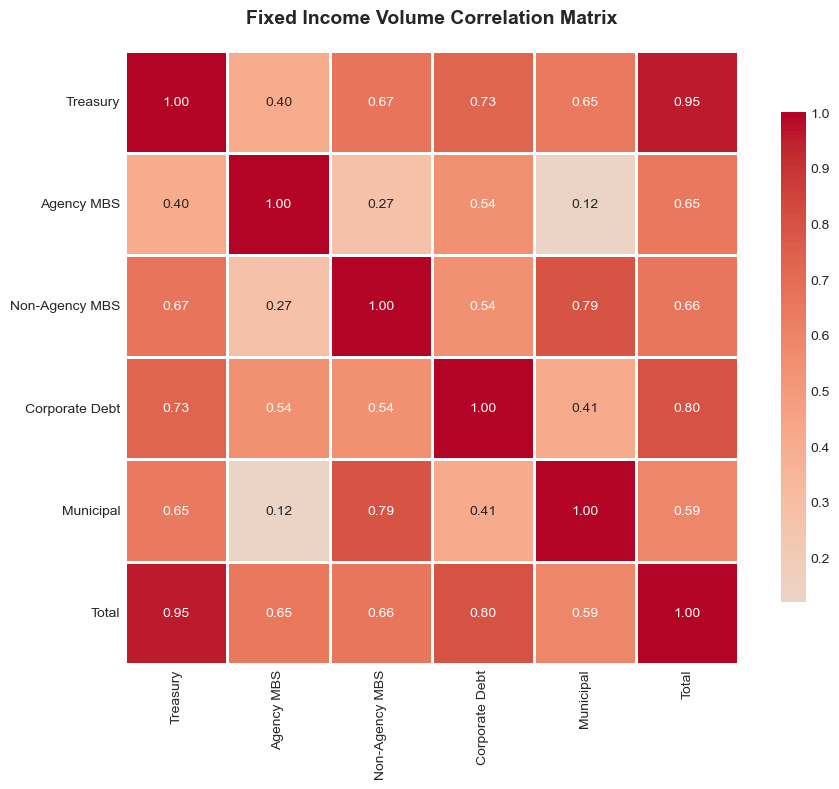



 KEY OBSERVATIONS
--------------------------------------------------------------------------------

   - Average monthly volume: $938.70B
   - Standard deviation: $110.32B  
   - Coefficient of variation: 11.8%
   - Time trend correlation: 0.129
   - Fed Funds correlation: -0.199
   - CPI correlation: -0.149
   - HY Spread correlation: 0.414
   - Cross-sector avg correlation: 0.585
   - Cross-sector correlation range: [0.119, 0.954]



In [36]:
print("\n\n WITHIN-MARKET CORRELATIONS")
print("-" * 80)
print("Correlation Matrix: Fixed Income Trading Volume Across Sectors\n")

# Calculate correlation matrix
fixed_corr = us_fixed_trading_volume[fixed_cols].corr()
display(fixed_corr.round(3))

# Visualize with heatmap
fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(
    fixed_corr, 
    annot=True, 
    fmt='.2f', 
    cmap='coolwarm',
    center=0,
    square=True,
    linewidths=1,
    cbar_kws={"shrink": 0.8},
    ax=ax
)
ax.set_title('Fixed Income Volume Correlation Matrix', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

print("\n\n KEY OBSERVATIONS")
print("-" * 80)

total_volume = us_fixed_trading_volume['Total']
avg_volume = total_volume.mean()
std_volume = total_volume.std()
cv = (std_volume / avg_volume) * 100

dates_numeric = np.arange(len(us_fixed_trading_volume))
trend_corr = np.corrcoef(dates_numeric, total_volume)[0, 1]

# Average correlation across sectors
avg_corr = fixed_corr.values[np.triu_indices_from(fixed_corr.values, k=1)].mean()
corr_range_min = fixed_corr.values[np.triu_indices_from(fixed_corr.values, k=1)].min()
corr_range_max = fixed_corr.values[np.triu_indices_from(fixed_corr.values, k=1)].max()

print(f"""
   - Average monthly volume: ${avg_volume:,.2f}B
   - Standard deviation: ${std_volume:,.2f}B  
   - Coefficient of variation: {cv:.1f}%
   - Time trend correlation: {trend_corr:.3f}
   - Fed Funds correlation: {correlations_fixed['Federal Funds Rate']:.3f}
   - CPI correlation: {correlations_fixed['CPI YoY']:.3f}
   - HY Spread correlation: {correlations_fixed['High Yield Spread']:.3f}
   - Cross-sector avg correlation: {avg_corr:.3f}
   - Cross-sector correlation range: [{corr_range_min:.3f}, {corr_range_max:.3f}]
""")

### 5. US Structured Finance Trading Volume

In [37]:
# ============================================================================
# 5. STRUCTURED FINANCE TRADING VOLUME ANALYSIS
# ============================================================================

print("=" * 80)
print("STRUCTURED FINANCE TRADING VOLUME ANALYSIS")
print("=" * 80)

sf_cols = ['ABS', 'CDO', 'Other', 'Total Asset', 'Agency CMO', 'Agency Specified Pool', 
           'Agency TBA', 'Agency CMBS (IO/PO)', 'Agency CMBS (P&I)', 'Total Mortgage', 'Total']

print("\n DESCRIPTIVE STATISTICS")
print("-" * 80)

sf_stats = calculate_descriptive_stats(us_sf_trading_volume, sf_cols)

print("\nStructured Finance Trading Volume Statistics ($ Billions)")
display(sf_stats)

STRUCTURED FINANCE TRADING VOLUME ANALYSIS

 DESCRIPTIVE STATISTICS
--------------------------------------------------------------------------------

Structured Finance Trading Volume Statistics ($ Billions)


,ABS,CDO,Other,Total Asset,Agency CMO,Agency Specified Pool,Agency TBA,Agency CMBS (IO/PO),Agency CMBS (P&I),Total Mortgage,Total
count,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000
mean,1054.502974,578.239501,0.453563,1633.196038,1675.227849,22532.852671,250626.132419,784.974094,509.344962,274834.212939,276467.408976
std,293.486389,193.340134,1.568236,439.215830,395.785178,5177.444572,29715.396559,391.320128,197.955013,33716.205495,33917.783416
min,580.947009,315.093991,0.000000,964.335186,945.074619,13168.489442,206382.202500,316.913573,227.990377,227080.688581,228384.293581
25%,912.779859,462.290764,0.000000,1442.763726,1467.631211,18685.989299,231115.162500,558.023417,354.856120,251089.075458,252230.506256
50%,1011.055353,536.116068,0.000000,1594.517053,1646.223865,23069.445245,246490.335190,667.509011,522.301771,270258.761014,271935.569667
75%,1160.254684,685.417278,0.000000,1758.563789,1886.922802,25638.403258,266366.593146,873.572263,622.430848,293920.680672,295581.343137
max,2326.550532,1261.757405,8.263048,3588.307936,2636.735718,34451.432136,331958.867479,1973.592400,1123.452895,366348.537163,368121.214984
skew,2.587635,1.502910,4.440485,2.796622,0.188362,0.285463,0.860056,1.530163,0.914800,0.834874,0.837895
kurtosis,11.112402,3.662287,21.176486,12.552988,-0.059607,-0.256969,0.671123,2.392165,1.587490,0.625819,0.608539




 TIME SERIES PLOTS
--------------------------------------------------------------------------------


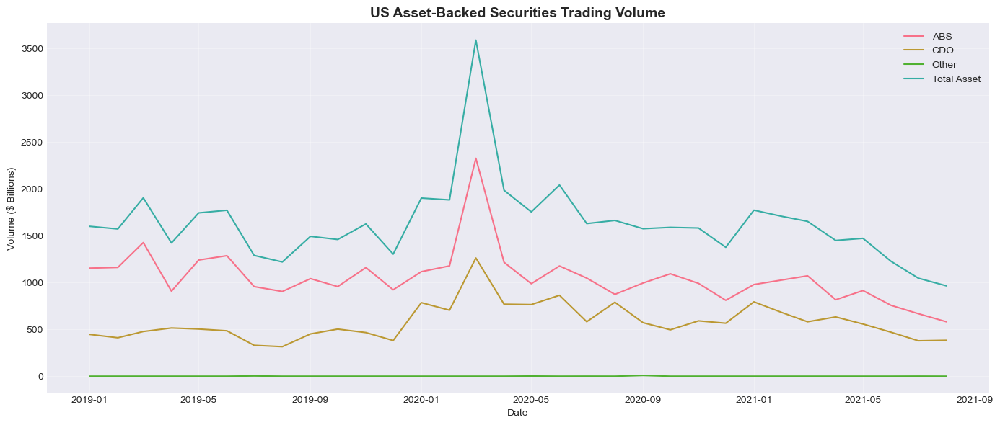

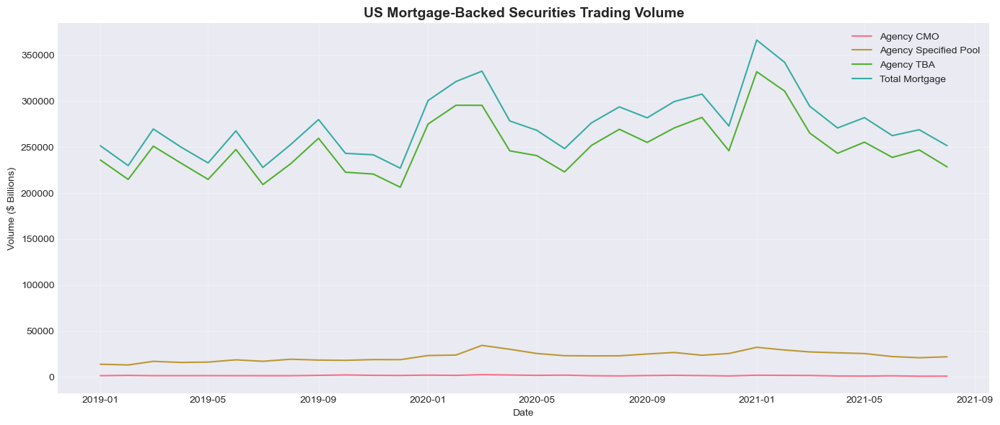

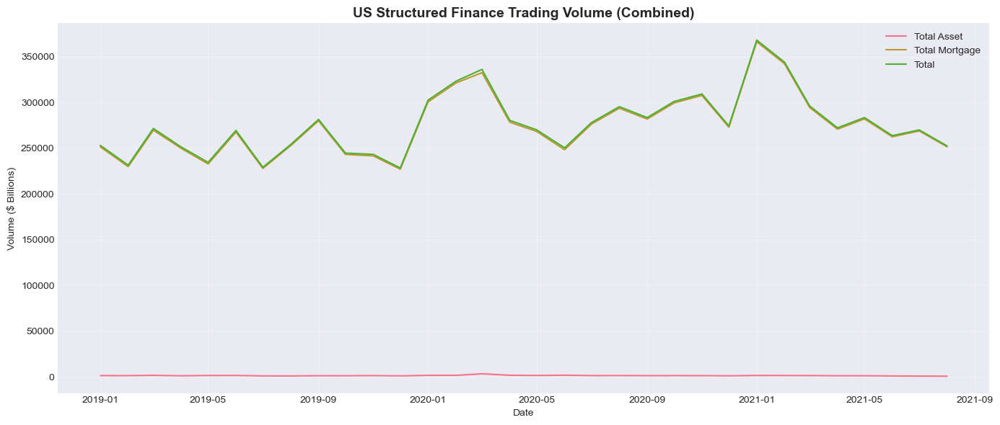



MACROECONOMIC CORRELATIONS
--------------------------------------------------------------------------------


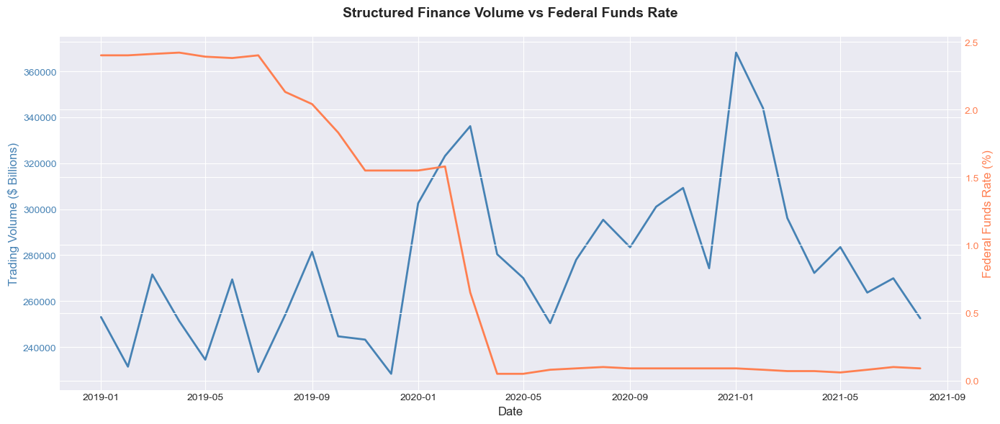

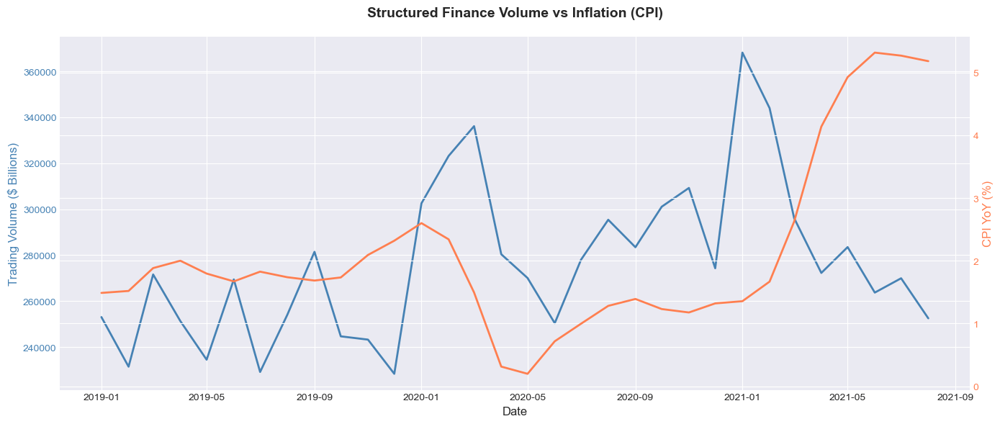

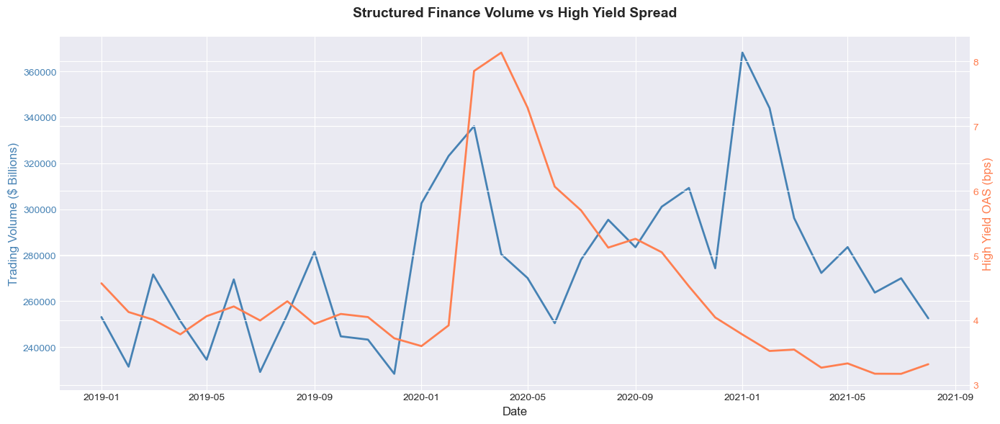


Correlation with Macro Indicators:
--------------------------------------------------------------------------------
  Federal Funds Rate...................... -0.482
  CPI YoY................................. -0.120
  High Yield Spread.......................  0.137


In [38]:
print("\n\n TIME SERIES PLOTS")
print("-" * 80)

# Plot ABS components
abs_cols = ['ABS', 'CDO', 'Other', 'Total Asset']
plot_time_series(
    us_sf_trading_volume,
    value_cols=abs_cols,
    title='US Asset-Backed Securities Trading Volume',
    ylabel='Volume ($ Billions)'
)

# Plot MBS components
mbs_cols = ['Agency CMO', 'Agency Specified Pool', 'Agency TBA', 'Total Mortgage']
plot_time_series(
    us_sf_trading_volume,
    value_cols=mbs_cols,
    title='US Mortgage-Backed Securities Trading Volume',
    ylabel='Volume ($ Billions)'
)

# Plot combined
combined_cols = ['Total Asset', 'Total Mortgage', 'Total']
plot_time_series(
    us_sf_trading_volume,
    value_cols=combined_cols,
    title='US Structured Finance Trading Volume (Combined)',
    ylabel='Volume ($ Billions)'
)

print("\n\nMACROECONOMIC CORRELATIONS")
print("-" * 80)

# Prepare macro data
fed_funds_df = fed_funds_monthly.reset_index()
fed_funds_df.columns = ['Date', 'FedFunds']

cpi_yoy_df = cpi_yoy.reset_index()
cpi_yoy_df.columns = ['Date', 'CPI_YoY']

hy_spread_df = hy_spread_monthly.reset_index()
hy_spread_df.columns = ['Date', 'HY_OAS']

# Merge data for analysis
sf_macro = us_sf_trading_volume[['Date', 'Total']].copy()
sf_macro = sf_macro.merge(fed_funds_df, on='Date', how='inner')
sf_macro = sf_macro.merge(cpi_yoy_df, on='Date', how='inner')
sf_macro = sf_macro.merge(hy_spread_df, on='Date', how='inner')

# Plot with Federal Funds Rate
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(sf_macro['Date'], sf_macro['Total'], color='steelblue', linewidth=2)
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Trading Volume ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(sf_macro['Date'], sf_macro['FedFunds'], color='coral', linewidth=2)
ax2.set_ylabel('Federal Funds Rate (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Structured Finance Volume vs Federal Funds Rate', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with CPI
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(sf_macro['Date'], sf_macro['Total'], color='steelblue', linewidth=2)
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Trading Volume ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(sf_macro['Date'], sf_macro['CPI_YoY'], color='coral', linewidth=2)
ax2.set_ylabel('CPI YoY (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Structured Finance Volume vs Inflation (CPI)', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with High Yield Spread
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(sf_macro['Date'], sf_macro['Total'], color='steelblue', linewidth=2)
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Trading Volume ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(sf_macro['Date'], sf_macro['HY_OAS'], color='coral', linewidth=2)
ax2.set_ylabel('High Yield OAS (bps)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Structured Finance Volume vs High Yield Spread', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Calculate and print correlations
print("\nCorrelation with Macro Indicators:")
print("-" * 80)

correlations_sf = {
    'Federal Funds Rate': sf_macro[['Total', 'FedFunds']].corr().iloc[0, 1],
    'CPI YoY': sf_macro[['Total', 'CPI_YoY']].corr().iloc[0, 1],
    'High Yield Spread': sf_macro[['Total', 'HY_OAS']].corr().iloc[0, 1]
}

for indicator, corr in correlations_sf.items():
    print(f"  {indicator:.<40} {corr:>6.3f}")



 WITHIN-MARKET CORRELATIONS
--------------------------------------------------------------------------------
Correlation Matrix: Structured Finance Trading Volume



,ABS,CDO,Other,Total Asset,Agency CMO,Agency Specified Pool,Agency TBA,Agency CMBS (IO/PO),Agency CMBS (P&I),Total Mortgage,Total
ABS,1.000,0.613,-0.085,0.938,0.665,0.232,0.252,0.400,0.749,0.265,0.276
CDO,0.613,1.000,-0.069,0.849,0.569,0.725,0.580,0.331,0.349,0.629,0.636
Other,-0.085,-0.069,1.000,-0.084,-0.049,0.035,-0.081,-0.076,-0.210,-0.066,-0.067
Total Asset,0.938,0.849,-0.084,1.000,0.694,0.474,0.423,0.413,0.653,0.454,0.464
Agency CMO,0.665,0.569,-0.049,0.694,1.000,0.308,0.264,0.228,0.479,0.292,0.299
Agency Specified Pool,0.232,0.725,0.035,0.474,0.308,1.000,0.713,0.247,-0.074,0.785,0.787
Agency TBA,0.252,0.580,-0.081,0.423,0.264,0.713,1.000,0.299,-0.134,0.994,0.993
Agency CMBS (IO/PO),0.400,0.331,-0.076,0.413,0.228,0.247,0.299,1.000,0.243,0.304,0.307
Agency CMBS (P&I),0.749,0.349,-0.210,0.653,0.479,-0.074,-0.134,0.243,1.000,-0.124,-0.115
Total Mortgage,0.265,0.629,-0.066,0.454,0.292,0.785,0.994,0.304,-0.124,1.000,1.000


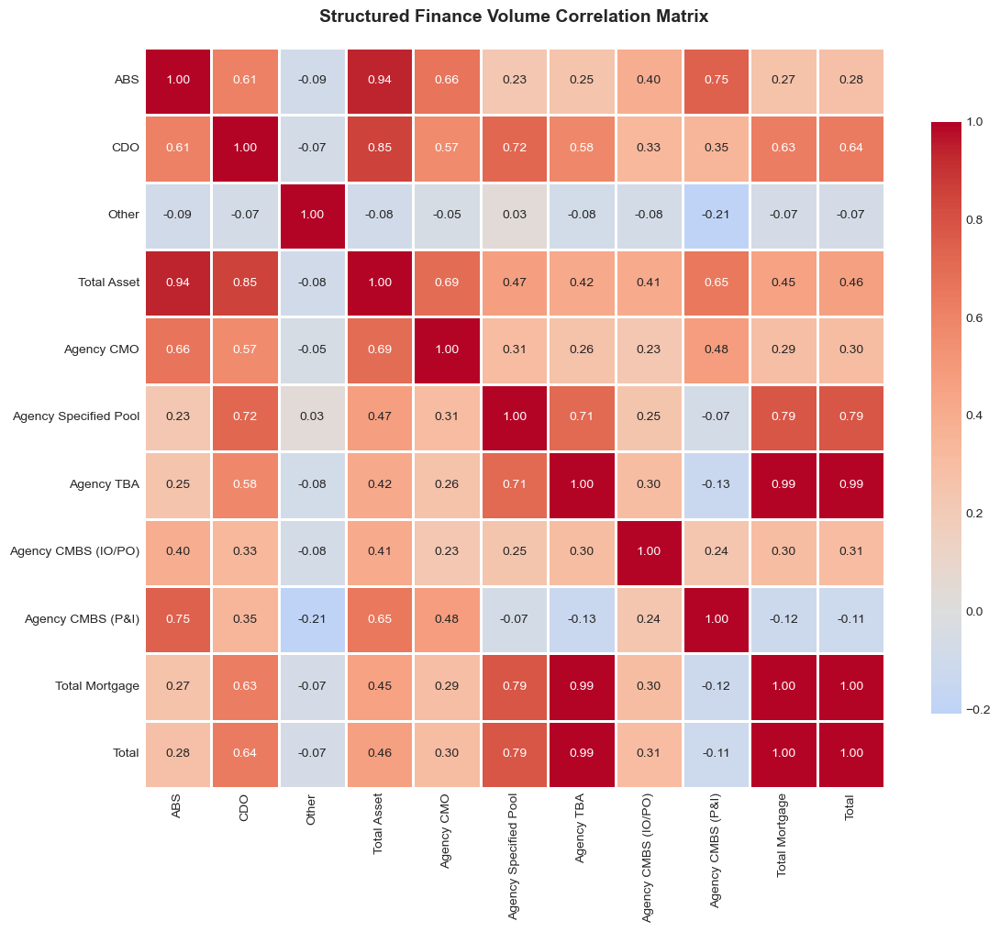



 KEY OBSERVATIONS
--------------------------------------------------------------------------------

   - Average monthly volume (Total): $276,467.41B
   - Average ABS volume: $1,633.20B
   - Average MBS volume: $274,834.21B
   - Standard deviation: $33,917.78B  
   - Coefficient of variation: 12.3%
   - Time trend correlation: 0.434
   - Fed Funds correlation: -0.482
   - CPI correlation: -0.120
   - HY Spread correlation: 0.137
   - ABS vs MBS correlation: 0.454
   - Cross-product avg correlation: 0.363
   - Cross-product correlation range: [-0.210, 1.000]



In [39]:
print("\n\n WITHIN-MARKET CORRELATIONS")
print("-" * 80)
print("Correlation Matrix: Structured Finance Trading Volume\n")

# Calculate correlation matrix
sf_corr = us_sf_trading_volume[sf_cols].corr()
display(sf_corr.round(3))

# Visualize with heatmap
fig, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(
    sf_corr, 
    annot=True, 
    fmt='.2f', 
    cmap='coolwarm',
    center=0,
    square=True,
    linewidths=1,
    cbar_kws={"shrink": 0.8},
    ax=ax
)
ax.set_title('Structured Finance Volume Correlation Matrix', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

print("\n\n KEY OBSERVATIONS")
print("-" * 80)

total_volume = us_sf_trading_volume['Total']
abs_volume = us_sf_trading_volume['Total Asset']
mbs_volume = us_sf_trading_volume['Total Mortgage']

avg_volume = total_volume.mean()
std_volume = total_volume.std()
cv = (std_volume / avg_volume) * 100

dates_numeric = np.arange(len(us_sf_trading_volume))
trend_corr = np.corrcoef(dates_numeric, total_volume)[0, 1]

# Average correlation
avg_corr = sf_corr.values[np.triu_indices_from(sf_corr.values, k=1)].mean()
corr_range_min = sf_corr.values[np.triu_indices_from(sf_corr.values, k=1)].min()
corr_range_max = sf_corr.values[np.triu_indices_from(sf_corr.values, k=1)].max()

# ABS vs MBS correlation
abs_mbs_corr = us_sf_trading_volume[['Total Asset', 'Total Mortgage']].corr().iloc[0, 1]

print(f"""
   - Average monthly volume (Total): ${avg_volume:,.2f}B
   - Average ABS volume: ${abs_volume.mean():,.2f}B
   - Average MBS volume: ${mbs_volume.mean():,.2f}B
   - Standard deviation: ${std_volume:,.2f}B  
   - Coefficient of variation: {cv:.1f}%
   - Time trend correlation: {trend_corr:.3f}
   - Fed Funds correlation: {correlations_sf['Federal Funds Rate']:.3f}
   - CPI correlation: {correlations_sf['CPI YoY']:.3f}
   - HY Spread correlation: {correlations_sf['High Yield Spread']:.3f}
   - ABS vs MBS correlation: {abs_mbs_corr:.3f}
   - Cross-product avg correlation: {avg_corr:.3f}
   - Cross-product correlation range: [{corr_range_min:.3f}, {corr_range_max:.3f}]
""")

### 6. US Agency Trading Volume

In [40]:
# ============================================================================
# 6. AGENCY DEBT TRADING VOLUME ANALYSIS
# ============================================================================

print("=" * 80)
print("AGENCY DEBT TRADING VOLUME ANALYSIS")
print("=" * 80)

agency_cols = ['Fannie Mae', 'FHLB', 'Freddie Mac', 'Other', 'Total']

print("\n DESCRIPTIVE STATISTICS")
print("-" * 80)

agency_stats = calculate_descriptive_stats(us_agency_trading_volume, agency_cols)

print("\nAgency Debt Trading Volume Statistics ($ Billions)")
display(agency_stats)

AGENCY DEBT TRADING VOLUME ANALYSIS

 DESCRIPTIVE STATISTICS
--------------------------------------------------------------------------------

Agency Debt Trading Volume Statistics ($ Billions)


,Fannie Mae,FHLB,Freddie Mac,Other,Total
count,32.000000,32.000000,32.000000,32.000000,32.000000
mean,0.695290,1.407398,0.855113,1.252052,4.209854
std,0.355916,0.429006,0.493099,0.368914,1.154587
min,0.166727,0.616000,0.131545,0.692364,2.113318
25%,0.492091,1.079288,0.536504,0.946641,3.591945
50%,0.556993,1.314913,0.786593,1.192197,4.198491
75%,0.778576,1.735810,1.287952,1.454715,4.726881
max,1.489762,2.237684,2.217909,2.355455,6.880524
skew,0.930549,0.249400,0.730399,0.949666,0.453836
kurtosis,0.041314,-0.800606,0.347632,1.314159,0.421764




 TIME SERIES PLOTS
--------------------------------------------------------------------------------


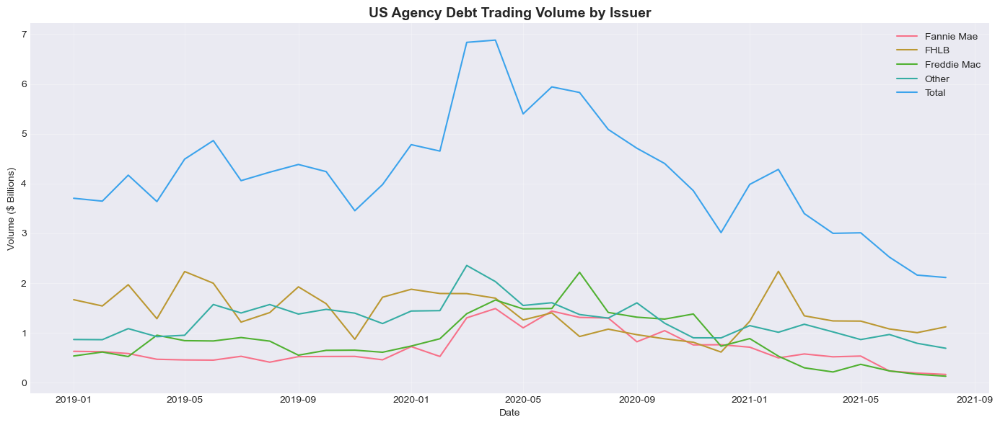



MACROECONOMIC CORRELATIONS
--------------------------------------------------------------------------------


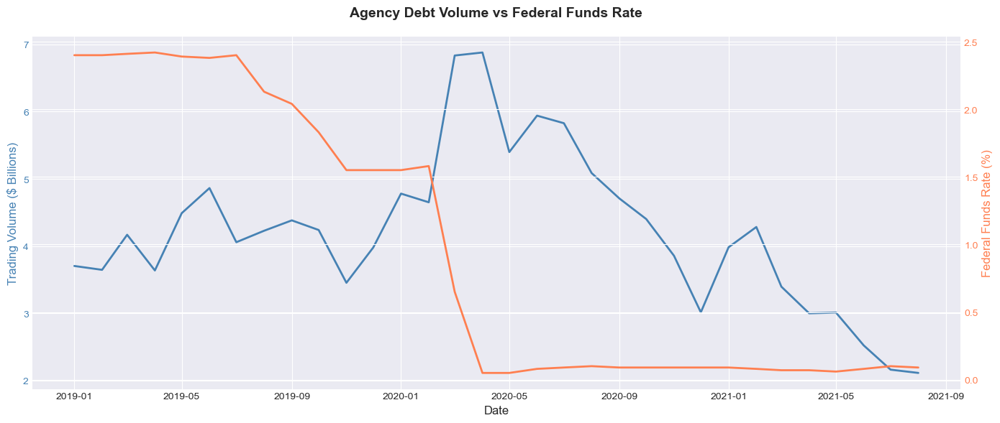

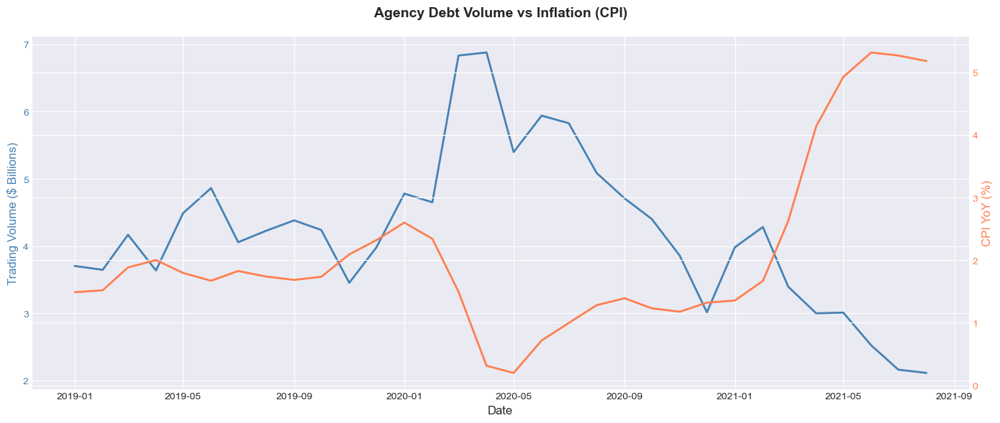

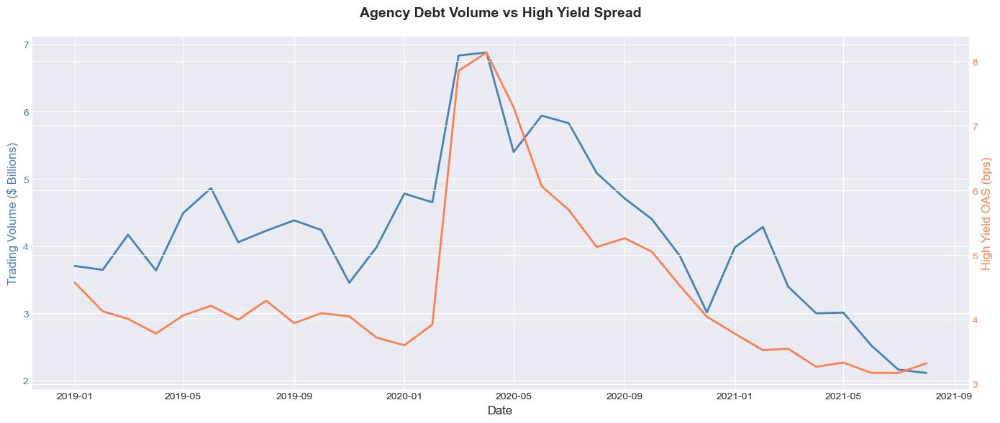


Correlation with Macro Indicators:
--------------------------------------------------------------------------------
  Federal Funds Rate...................... -0.007
  CPI YoY................................. -0.745
  High Yield Spread.......................  0.850


In [41]:
print("\n\n TIME SERIES PLOTS")
print("-" * 80)

plot_time_series(
    us_agency_trading_volume,
    value_cols=agency_cols,
    title='US Agency Debt Trading Volume by Issuer',
    ylabel='Volume ($ Billions)'
)

print("\n\nMACROECONOMIC CORRELATIONS")
print("-" * 80)

# Prepare macro data
fed_funds_df = fed_funds_monthly.reset_index()
fed_funds_df.columns = ['Date', 'FedFunds']

cpi_yoy_df = cpi_yoy.reset_index()
cpi_yoy_df.columns = ['Date', 'CPI_YoY']

hy_spread_df = hy_spread_monthly.reset_index()
hy_spread_df.columns = ['Date', 'HY_OAS']

# Merge data for analysis
agency_macro = us_agency_trading_volume[['Date', 'Total']].copy()
agency_macro = agency_macro.merge(fed_funds_df, on='Date', how='inner')
agency_macro = agency_macro.merge(cpi_yoy_df, on='Date', how='inner')
agency_macro = agency_macro.merge(hy_spread_df, on='Date', how='inner')

# Plot with Federal Funds Rate
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(agency_macro['Date'], agency_macro['Total'], color='steelblue', linewidth=2)
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Trading Volume ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(agency_macro['Date'], agency_macro['FedFunds'], color='coral', linewidth=2)
ax2.set_ylabel('Federal Funds Rate (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Agency Debt Volume vs Federal Funds Rate', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with CPI
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(agency_macro['Date'], agency_macro['Total'], color='steelblue', linewidth=2)
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Trading Volume ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(agency_macro['Date'], agency_macro['CPI_YoY'], color='coral', linewidth=2)
ax2.set_ylabel('CPI YoY (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Agency Debt Volume vs Inflation (CPI)', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with High Yield Spread
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(agency_macro['Date'], agency_macro['Total'], color='steelblue', linewidth=2)
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Trading Volume ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(agency_macro['Date'], agency_macro['HY_OAS'], color='coral', linewidth=2)
ax2.set_ylabel('High Yield OAS (bps)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Agency Debt Volume vs High Yield Spread', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Calculate and print correlations
print("\nCorrelation with Macro Indicators:")
print("-" * 80)

correlations_agency = {
    'Federal Funds Rate': agency_macro[['Total', 'FedFunds']].corr().iloc[0, 1],
    'CPI YoY': agency_macro[['Total', 'CPI_YoY']].corr().iloc[0, 1],
    'High Yield Spread': agency_macro[['Total', 'HY_OAS']].corr().iloc[0, 1]
}

for indicator, corr in correlations_agency.items():
    print(f"  {indicator:.<40} {corr:>6.3f}")



 WITHIN-MARKET CORRELATIONS
--------------------------------------------------------------------------------
Correlation Matrix: Agency Debt Trading Volume Across Issuers



,Fannie Mae,FHLB,Freddie Mac,Other,Total
Fannie Mae,1.000,-0.116,0.855,0.613,0.826
FHLB,-0.116,1.000,-0.160,0.232,0.342
Freddie Mac,0.855,-0.160,1.000,0.581,0.817
Other,0.613,0.232,0.581,1.000,0.843
Total,0.826,0.342,0.817,0.843,1.000


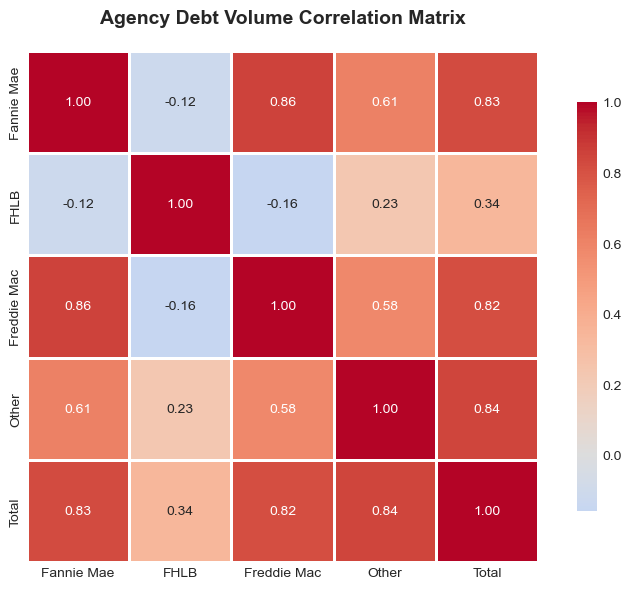



 KEY OBSERVATIONS
--------------------------------------------------------------------------------

   - Average monthly volume: $4.21B
   - Standard deviation: $1.15B  
   - Coefficient of variation: 27.4%
   - Time trend correlation: -0.331
   - Fed Funds correlation: -0.007
   - CPI correlation: -0.745
   - HY Spread correlation: 0.850
   - Cross-issuer avg correlation: 0.483
   - Cross-issuer correlation range: [-0.160, 0.855]



In [42]:
print("\n\n WITHIN-MARKET CORRELATIONS")
print("-" * 80)
print("Correlation Matrix: Agency Debt Trading Volume Across Issuers\n")

# Calculate correlation matrix
agency_corr = us_agency_trading_volume[agency_cols].corr()
display(agency_corr.round(3))

# Visualize with heatmap
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(
    agency_corr, 
    annot=True, 
    fmt='.2f', 
    cmap='coolwarm',
    center=0,
    square=True,
    linewidths=1,
    cbar_kws={"shrink": 0.8},
    ax=ax
)
ax.set_title('Agency Debt Volume Correlation Matrix', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

print("\n\n KEY OBSERVATIONS")
print("-" * 80)

total_volume = us_agency_trading_volume['Total']
avg_volume = total_volume.mean()
std_volume = total_volume.std()
cv = (std_volume / avg_volume) * 100

dates_numeric = np.arange(len(us_agency_trading_volume))
trend_corr = np.corrcoef(dates_numeric, total_volume)[0, 1]

# Average correlation across issuers
avg_corr = agency_corr.values[np.triu_indices_from(agency_corr.values, k=1)].mean()
corr_range_min = agency_corr.values[np.triu_indices_from(agency_corr.values, k=1)].min()
corr_range_max = agency_corr.values[np.triu_indices_from(agency_corr.values, k=1)].max()

print(f"""
   - Average monthly volume: ${avg_volume:,.2f}B
   - Standard deviation: ${std_volume:,.2f}B  
   - Coefficient of variation: {cv:.1f}%
   - Time trend correlation: {trend_corr:.3f}
   - Fed Funds correlation: {correlations_agency['Federal Funds Rate']:.3f}
   - CPI correlation: {correlations_agency['CPI YoY']:.3f}
   - HY Spread correlation: {correlations_agency['High Yield Spread']:.3f}
   - Cross-issuer avg correlation: {avg_corr:.3f}
   - Cross-issuer correlation range: [{corr_range_min:.3f}, {corr_range_max:.3f}]
""")

### 7. US Corporate Bond Trading Volume

In [43]:
# ============================================================================
# 7. CORPORATE BONDS TRADING VOLUME ANALYSIS
# ============================================================================

print("=" * 80)
print("CORPORATE BONDS TRADING VOLUME ANALYSIS")
print("=" * 80)

corporate_cols = ['Investment Grade', 'High Yield', 'Total']

print("\n DESCRIPTIVE STATISTICS")
print("-" * 80)

corporate_stats = calculate_descriptive_stats(us_corporate_bond_trading_volume, corporate_cols)

print("\nCorporate Bond Trading Volume Statistics ($ Billions)")
display(corporate_stats)

CORPORATE BONDS TRADING VOLUME ANALYSIS

 DESCRIPTIVE STATISTICS
--------------------------------------------------------------------------------

Corporate Bond Trading Volume Statistics ($ Billions)


,Investment Grade,High Yield,Total
count,32.000000,32.000000,32.000000
mean,20.474942,7.538574,28.013516
std,3.200796,1.657068,4.734846
min,15.167571,5.102048,20.269619
25%,18.061524,6.596376,24.743864
50%,20.001900,7.076680,27.467907
75%,23.136842,8.520266,31.285500
max,26.633714,11.979864,38.349095
skew,0.333521,1.053255,0.539605
kurtosis,-0.701425,1.140535,-0.242758




 TIME SERIES PLOTS
--------------------------------------------------------------------------------


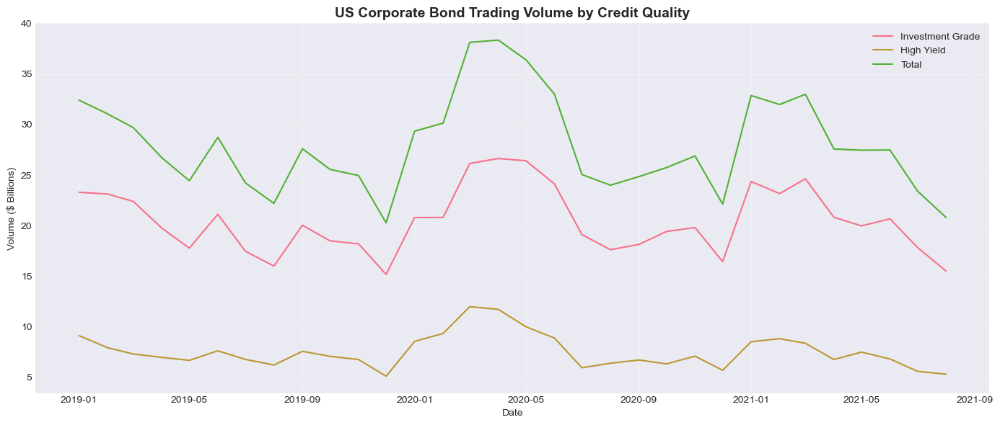



MACROECONOMIC CORRELATIONS
--------------------------------------------------------------------------------


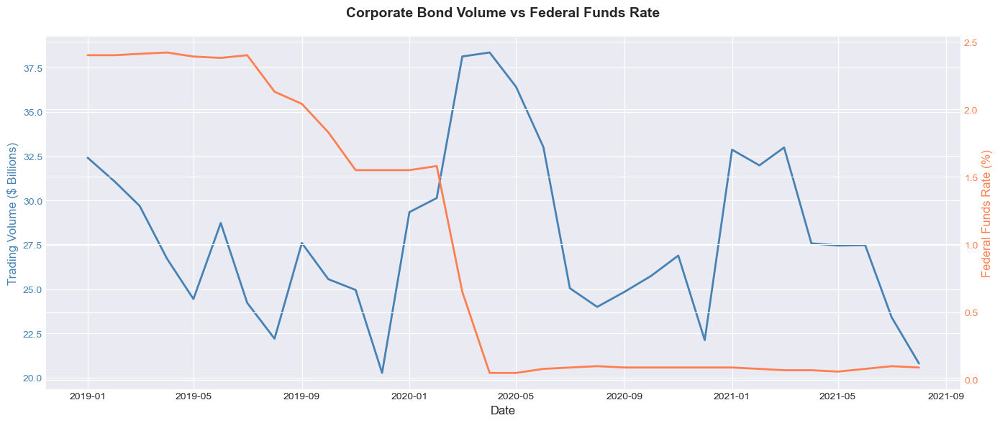

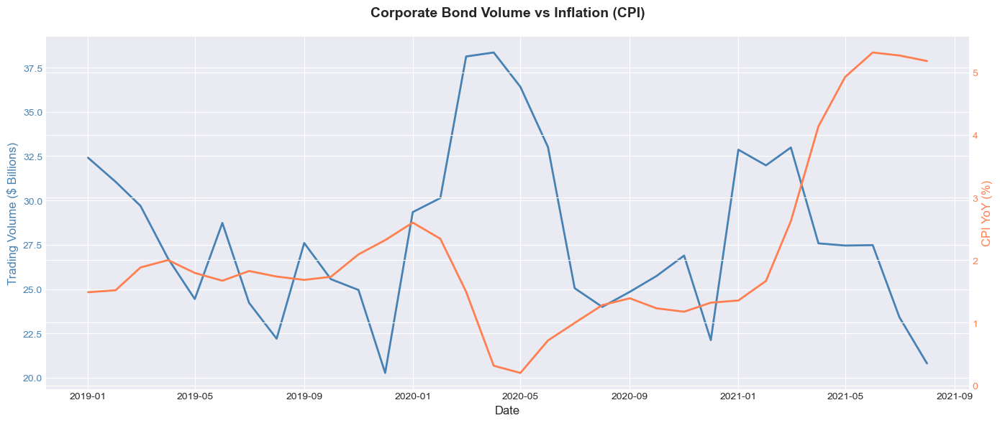

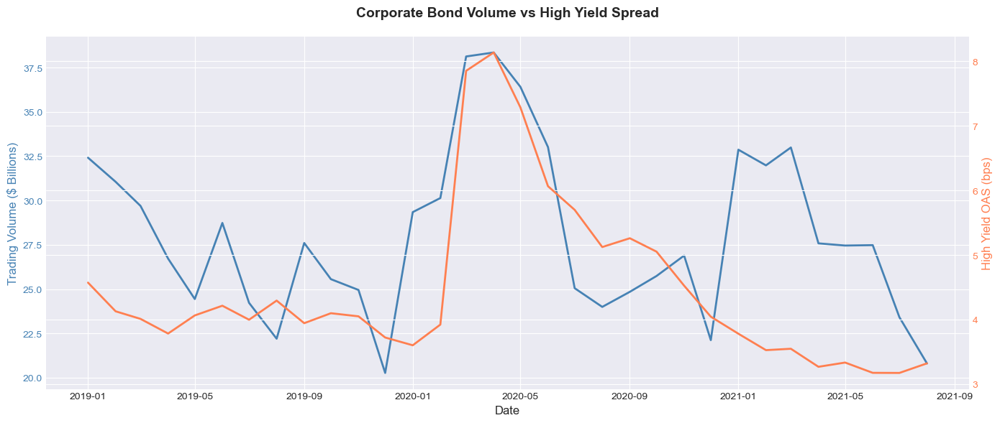


Correlation with Macro Indicators:
--------------------------------------------------------------------------------
  Federal Funds Rate...................... -0.134
  CPI YoY................................. -0.371
  High Yield Spread.......................  0.581


In [44]:
print("\n\n TIME SERIES PLOTS")
print("-" * 80)

plot_time_series(
    us_corporate_bond_trading_volume,
    value_cols=corporate_cols,
    title='US Corporate Bond Trading Volume by Credit Quality',
    ylabel='Volume ($ Billions)'
)

print("\n\nMACROECONOMIC CORRELATIONS")
print("-" * 80)

# Prepare macro data
fed_funds_df = fed_funds_monthly.reset_index()
fed_funds_df.columns = ['Date', 'FedFunds']

cpi_yoy_df = cpi_yoy.reset_index()
cpi_yoy_df.columns = ['Date', 'CPI_YoY']

hy_spread_df = hy_spread_monthly.reset_index()
hy_spread_df.columns = ['Date', 'HY_OAS']

# Merge data for analysis
corporate_macro = us_corporate_bond_trading_volume[['Date', 'Total']].copy()
corporate_macro = corporate_macro.merge(fed_funds_df, on='Date', how='inner')
corporate_macro = corporate_macro.merge(cpi_yoy_df, on='Date', how='inner')
corporate_macro = corporate_macro.merge(hy_spread_df, on='Date', how='inner')

# Plot with Federal Funds Rate
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(corporate_macro['Date'], corporate_macro['Total'], color='steelblue', linewidth=2)
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Trading Volume ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(corporate_macro['Date'], corporate_macro['FedFunds'], color='coral', linewidth=2)
ax2.set_ylabel('Federal Funds Rate (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Corporate Bond Volume vs Federal Funds Rate', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with CPI
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(corporate_macro['Date'], corporate_macro['Total'], color='steelblue', linewidth=2)
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Trading Volume ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(corporate_macro['Date'], corporate_macro['CPI_YoY'], color='coral', linewidth=2)
ax2.set_ylabel('CPI YoY (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Corporate Bond Volume vs Inflation (CPI)', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with High Yield Spread
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(corporate_macro['Date'], corporate_macro['Total'], color='steelblue', linewidth=2)
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Trading Volume ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(corporate_macro['Date'], corporate_macro['HY_OAS'], color='coral', linewidth=2)
ax2.set_ylabel('High Yield OAS (bps)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Corporate Bond Volume vs High Yield Spread', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Calculate and print correlations
print("\nCorrelation with Macro Indicators:")
print("-" * 80)

correlations_corporate = {
    'Federal Funds Rate': corporate_macro[['Total', 'FedFunds']].corr().iloc[0, 1],
    'CPI YoY': corporate_macro[['Total', 'CPI_YoY']].corr().iloc[0, 1],
    'High Yield Spread': corporate_macro[['Total', 'HY_OAS']].corr().iloc[0, 1]
}

for indicator, corr in correlations_corporate.items():
    print(f"  {indicator:.<40} {corr:>6.3f}")



 WITHIN-MARKET CORRELATIONS
--------------------------------------------------------------------------------
Correlation Matrix: Corporate Bond Trading Volume Across Credit Qualities



,Investment Grade,High Yield,Total
Investment Grade,1.000,0.889,0.987
High Yield,0.889,1.000,0.951
Total,0.987,0.951,1.000


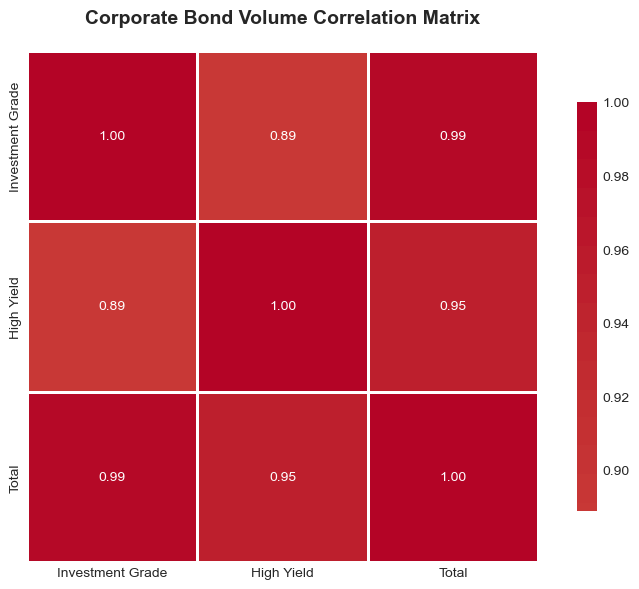



 KEY OBSERVATIONS
--------------------------------------------------------------------------------

   - Average monthly volume: $28.01B
   - Standard deviation: $4.73B  
   - Coefficient of variation: 16.9%
   - Time trend correlation: -0.083
   - Fed Funds correlation: -0.134
   - CPI correlation: -0.371
   - HY Spread correlation: 0.581
   - Investment Grade vs High Yield correlation: 0.889
   - Cross-quality avg correlation: 0.942
   - Cross-quality correlation range: [0.889, 0.987]



In [45]:
print("\n\n WITHIN-MARKET CORRELATIONS")
print("-" * 80)
print("Correlation Matrix: Corporate Bond Trading Volume Across Credit Qualities\n")

# Calculate correlation matrix
corporate_corr = us_corporate_bond_trading_volume[corporate_cols].corr()
display(corporate_corr.round(3))

# Visualize with heatmap
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(
    corporate_corr, 
    annot=True, 
    fmt='.2f', 
    cmap='coolwarm',
    center=0,
    square=True,
    linewidths=1,
    cbar_kws={"shrink": 0.8},
    ax=ax
)
ax.set_title('Corporate Bond Volume Correlation Matrix', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

print("\n\n KEY OBSERVATIONS")
print("-" * 80)

total_volume = us_corporate_bond_trading_volume['Total']
avg_volume = total_volume.mean()
std_volume = total_volume.std()
cv = (std_volume / avg_volume) * 100

dates_numeric = np.arange(len(us_corporate_bond_trading_volume))
trend_corr = np.corrcoef(dates_numeric, total_volume)[0, 1]

# Average correlation across credit qualities
avg_corr = corporate_corr.values[np.triu_indices_from(corporate_corr.values, k=1)].mean()
corr_range_min = corporate_corr.values[np.triu_indices_from(corporate_corr.values, k=1)].min()
corr_range_max = corporate_corr.values[np.triu_indices_from(corporate_corr.values, k=1)].max()

print(f"""
   - Average monthly volume: ${avg_volume:,.2f}B
   - Standard deviation: ${std_volume:,.2f}B  
   - Coefficient of variation: {cv:.1f}%
   - Time trend correlation: {trend_corr:.3f}
   - Fed Funds correlation: {correlations_corporate['Federal Funds Rate']:.3f}
   - CPI correlation: {correlations_corporate['CPI YoY']:.3f}
   - HY Spread correlation: {correlations_corporate['High Yield Spread']:.3f}
   - Investment Grade vs High Yield correlation: {corporate_corr.loc['Investment Grade', 'High Yield']:.3f}
   - Cross-quality avg correlation: {avg_corr:.3f}
   - Cross-quality correlation range: [{corr_range_min:.3f}, {corr_range_max:.3f}]
""")

---
## Cross Market Correlation

In [46]:
# ============================================================================
# CROSS-MARKET CORRELATION ANALYSIS
# ============================================================================

print("=" * 80)
print("CROSS-MARKET TRADING VOLUME CORRELATION ANALYSIS")
print("=" * 80)

# Create dictionary of markets with their dataframes and total column
markets_dict = {
    'Treasury': (us_treasury_trading_volume, 'Total'),
    'Repo Primary': (us_repo_primary_dealer, 'Total'),
    'Repo GCF': (us_repo_gcf_repo_index, 'Total'),
    'Repo Triparty': (us_repo_triparty_repo, 'Total'),
    'Equity Issuance': (us_equity_issuance, 'Total'),
    'Equity Trading': (us_equity_trading_volume, 'Total'),
    'Fixed Income': (us_fixed_trading_volume, 'Total'),
    'Structured Finance': (us_sf_trading_volume, 'Total'),
    'Agency Debt': (us_agency_trading_volume, 'Total'),
    'Corporate Bonds': (us_corporate_bond_trading_volume, 'Total')
}

# Calculate cross-market correlation matrix
cross_market_corr = calculate_correlation_matrix(markets_dict)

print("\nCross-Market Correlation Matrix:")
print("(Correlations based on total monthly trading volumes)")
print()
display(cross_market_corr.round(3))

CROSS-MARKET TRADING VOLUME CORRELATION ANALYSIS

Cross-Market Correlation Matrix:
(Correlations based on total monthly trading volumes)



,Treasury,Repo Primary,Repo GCF,Repo Triparty,Equity Issuance,Equity Trading,Fixed Income,Structured Finance,Agency Debt,Corporate Bonds
Treasury,1.000,0.506,0.120,0.133,-0.017,0.449,0.954,0.412,0.394,0.718
Repo Primary,0.506,1.000,0.434,0.217,-0.234,-0.025,0.464,0.147,0.552,0.182
Repo GCF,0.120,0.434,1.000,0.030,-0.446,-0.639,-0.040,-0.430,0.320,-0.097
Repo Triparty,0.133,0.217,0.030,1.000,-0.160,-0.049,0.031,-0.228,-0.090,-0.046
Equity Issuance,-0.017,-0.234,-0.446,-0.160,1.000,0.469,0.045,0.226,-0.066,0.162
Equity Trading,0.449,-0.025,-0.639,-0.049,0.469,1.000,0.608,0.710,0.020,0.409
Fixed Income,0.954,0.464,-0.040,0.031,0.045,0.608,1.000,0.659,0.424,0.767
Structured Finance,0.412,0.147,-0.430,-0.228,0.226,0.710,0.659,1.000,0.244,0.445
Agency Debt,0.394,0.552,0.320,-0.090,-0.066,0.020,0.424,0.244,1.000,0.555
Corporate Bonds,0.718,0.182,-0.097,-0.046,0.162,0.409,0.767,0.445,0.555,1.000


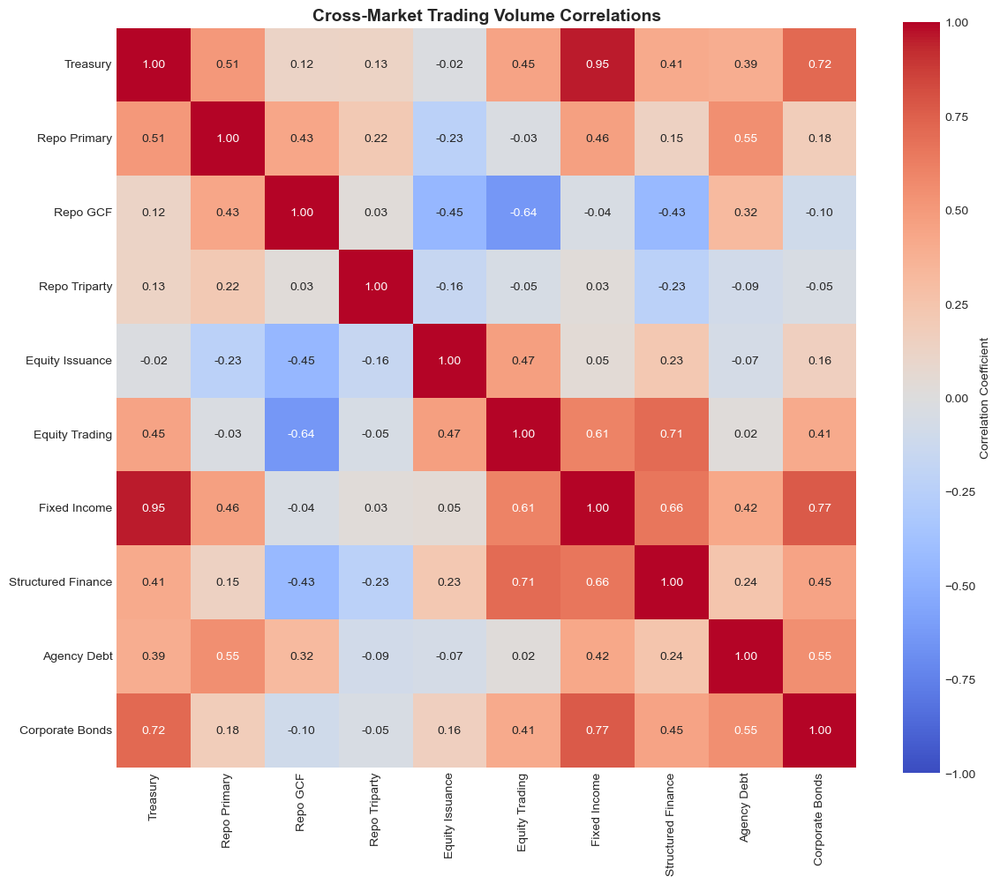



 CROSS-MARKET CORRELATION STATISTICS
--------------------------------------------------------------------------------

Overall Cross-Market Correlation Statistics:
   - Average correlation: 0.205
   - Maximum correlation: 0.954
   - Minimum correlation: -0.639
   - Standard deviation: 0.344


Highest Correlations (Top 5):
--------------------------------------------------------------------------------
   1. Fixed Income ↔ Treasury: 0.954
   2. Corporate Bonds ↔ Fixed Income: 0.767
   3. Corporate Bonds ↔ Treasury: 0.718
   4. Structured Finance ↔ Equity Trading: 0.710
   5. Structured Finance ↔ Fixed Income: 0.659


Lowest Correlations (Bottom 5):
--------------------------------------------------------------------------------
   1. Structured Finance ↔ Repo Triparty: -0.228
   2. Equity Issuance ↔ Repo Primary: -0.234
   3. Structured Finance ↔ Repo GCF: -0.430
   4. Equity Issuance ↔ Repo GCF: -0.446
   5. Equity Trading ↔ Repo GCF: -0.639


In [47]:
# Visualize cross-market correlations
plot_correlation_heatmap(
    cross_market_corr, 
    title='Cross-Market Trading Volume Correlations'
)

print("\n\n CROSS-MARKET CORRELATION STATISTICS")
print("-" * 80)

# Get upper triangle of correlation matrix (excluding diagonal)
mask = np.triu(np.ones_like(cross_market_corr, dtype=bool), k=1)
upper_triangle = cross_market_corr.where(mask)

# Calculate statistics
all_correlations = upper_triangle.values[mask]
avg_correlation = all_correlations.mean()
max_correlation = all_correlations.max()
min_correlation = all_correlations.min()
std_correlation = all_correlations.std()

print(f"""
Overall Cross-Market Correlation Statistics:
   - Average correlation: {avg_correlation:.3f}
   - Maximum correlation: {max_correlation:.3f}
   - Minimum correlation: {min_correlation:.3f}
   - Standard deviation: {std_correlation:.3f}
""")

# Find highest and lowest correlations
print("\nHighest Correlations (Top 5):")
print("-" * 80)
upper_corr_flat = upper_triangle.unstack().dropna().sort_values(ascending=False)
for i, ((market1, market2), corr) in enumerate(upper_corr_flat.head(5).items()):
    print(f"   {i+1}. {market1} ↔ {market2}: {corr:.3f}")

print("\n\nLowest Correlations (Bottom 5):")
print("-" * 80)
for i, ((market1, market2), corr) in enumerate(upper_corr_flat.tail(5).items()):
    print(f"   {i+1}. {market1} ↔ {market2}: {corr:.3f}")


---
## Data Loading: Issuance

### 1. US Marketable Treasury Issuance, Outstanding, and Interest Rates

In [48]:
# US Treasury Issuance
us_treasury_issuance = (
    pd.read_excel('data/US-Treasury-Securities-Statistics-SIFMA.xlsx', sheet_name="Issuance Net", header=8)
    .head(21)
    .rename(columns={'Unnamed: 0': 'Date',
                     "Net": "Bills", 
                     "Net.1": "Notes",
                     "Net.2": "Bonds",
                     "Net Cash Raised": "Total"})
    .assign(Date=lambda df: pd.to_datetime(df['Date'].astype(str) + '-01-01').dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "Bills", "Notes", "Bonds", "Total"]])
)

# US Treasury Outstanding
us_treasury_outstanding = (
    pd.read_excel('data/US-Treasury-Securities-Statistics-SIFMA.xlsx', sheet_name="Outstanding", header=7)
    .head(31)
    .rename(columns={'Unnamed: 0': 'Date'})
    .assign(Date=lambda df: pd.to_datetime(df['Date'].astype(str) + '-01-01').dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "Bills", "Notes", "Bonds", "TIPS", "FRN", "Total"]])
)

# US Treasury Yield
us_treasury_yield = (
    pd.read_excel('data/US-Treasury-Securities-Statistics-SIFMA.xlsx', sheet_name="Yield Curve Rates", header=8)
    .rename(columns={'Unnamed: 0': 'Date'})
    .head(31)
    .assign(Date=lambda df: pd.to_datetime(df['Date'].astype(str) + '-01-01').dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "3-Month Bills", "10-Year Notes", "Spread"]])
)
us_treasury_yield["3-Month Bills"] = pd.to_numeric(us_treasury_yield["3-Month Bills"], errors='coerce')
us_treasury_yield["10-Year Notes"] = pd.to_numeric(us_treasury_yield["10-Year Notes"], errors='coerce')
us_treasury_yield["Spread"] = pd.to_numeric(us_treasury_yield["Spread"], errors='coerce')

print("Treasury Issuance:", us_treasury_issuance['Date'].min(), "to", us_treasury_issuance['Date'].max(), 
      f"| {len(us_treasury_issuance)} obs")
print("Treasury Outstanding:", us_treasury_outstanding['Date'].min(), "to", us_treasury_outstanding['Date'].max(), 
      f"| {len(us_treasury_outstanding)} obs")
print("Treasury Yield:", us_treasury_yield['Date'].min(), "to", us_treasury_yield['Date'].max(), 
      f"| {len(us_treasury_yield)} obs")

Treasury Issuance: 2000-01-01 00:00:00 to 2020-01-01 00:00:00 | 21 obs
Treasury Outstanding: 1990-01-01 00:00:00 to 2020-01-01 00:00:00 | 31 obs
Treasury Yield: 1990-01-01 00:00:00 to 2020-01-01 00:00:00 | 31 obs


### 2. US MBS Issuance and Outstanding

In [49]:
# US MBS Issuance
us_mortgage_issuance = (
    pd.read_excel('data/US-Mortgage-Backed-Securities-Statistics-SIFMA.xlsx', sheet_name="MBS Issuance", header=18)
    .rename(columns={'Unnamed: 0': 'Date'})
    .head(25)
    .assign(Date=lambda df: pd.to_datetime(df['Date'].astype(str) + '-01-01').dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "Agency", "Non-Agency", "Total"]])
)

# US MBS Outstanding
us_mortgage_outstanding = (
    pd.read_excel('data/US-Mortgage-Backed-Securities-Statistics-SIFMA.xlsx', sheet_name="MBS Outstanding", header=17)
    .rename(columns={'Unnamed: 0': 'Date'})
    .head(19)
    .assign(Date=lambda df: pd.to_datetime(df['Date'].astype(str) + '-01-01').dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "Agency", "Non-Agency", "Total"]])
)

print("MBS Issuance:", us_mortgage_issuance['Date'].min(), "to", us_mortgage_issuance['Date'].max(), 
      f"| {len(us_mortgage_issuance)} obs")
print("MBS Outstanding:", us_mortgage_outstanding['Date'].min(), "to", us_mortgage_outstanding['Date'].max(), 
      f"| {len(us_mortgage_outstanding)} obs")

MBS Issuance: 1996-01-01 00:00:00 to 2020-01-01 00:00:00 | 25 obs
MBS Outstanding: 2002-01-01 00:00:00 to 2020-01-01 00:00:00 | 19 obs


### 3. US ABS Issuance and Outstanding

In [50]:
# US ABS Issuance
us_abs_issuance = (
    pd.read_excel('data/US-Asset-Backed-Securities-Statistics-SIFMA.xlsx', sheet_name="ABS Issuance", header=10)
    .rename(columns={'Unnamed: 0': 'Date'})
    .head(36)
    .assign(Date=lambda df: pd.to_datetime(df['Date'].astype(str) + '-01-01').dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "Auto", "CDO/CLO", "Credit Cards", "Equipment", "Other", "Student Loans", "Total"]])
)

# US ABS Outstanding
us_abs_outstanding = (
    pd.read_excel('data/US-Asset-Backed-Securities-Statistics-SIFMA.xlsx', sheet_name="ABS Outstanding", header=13)
    .head(36)
    .assign(Date=lambda df: pd.to_datetime(df['Date'].astype(str) + '-01-01').dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "Automobile", "CDO/CLO", "Credit Card", "Equipment", "Other", "Student Loans", "Total"]])
)

print("ABS Issuance:", us_abs_issuance['Date'].min(), "to", us_abs_issuance['Date'].max(), 
      f"| {len(us_abs_issuance)} obs")
print("ABS Outstanding:", us_abs_outstanding['Date'].min(), "to", us_abs_outstanding['Date'].max(), 
      f"| {len(us_abs_outstanding)} obs")

ABS Issuance: 1985-01-01 00:00:00 to 2020-01-01 00:00:00 | 36 obs
ABS Outstanding: 1985-01-01 00:00:00 to 2020-01-01 00:00:00 | 36 obs


### 4. US Fixed Income Issuance and Outstanding

In [51]:
# US Fixed Income Issuance
us_fixed_income_issuance = (
    pd.read_excel('data/US-Fixed-Income-Securities-Statistics-SIFMA.xlsx', sheet_name="Issuance", header=7)
    .rename(columns={'Unnamed: 0': 'Date'})
    .head(25)
    .assign(Date=lambda df: pd.to_datetime(df['Date'].astype(str) + '-01-01').dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "Treasury", "Corporate Debt", "Municipal", "Mortgage-Related", "Total"]])
)

# US Fixed Income Outstanding
us_fixed_income_outstanding = (
    pd.read_excel('data/US-Fixed-Income-Securities-Statistics-SIFMA.xlsx', sheet_name="Outstanding", header=7)
    .rename(columns={'Unnamed: 0': 'Date'})
    .head(41)
    .assign(Date=lambda df: pd.to_datetime(df['Date'].astype(str) + '-01-01').dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "Treasury", "Corporate Debt", "Municipal", "Mortgage-Related", "Total"]])
)

print("Fixed Income Issuance:", us_fixed_income_issuance['Date'].min(), "to", us_fixed_income_issuance['Date'].max(), 
      f"| {len(us_fixed_income_issuance)} obs")
print("Fixed Income Outstanding:", us_fixed_income_outstanding['Date'].min(), "to", us_fixed_income_outstanding['Date'].max(), 
      f"| {len(us_fixed_income_outstanding)} obs")

Fixed Income Issuance: 1996-01-01 00:00:00 to 2020-01-01 00:00:00 | 25 obs
Fixed Income Outstanding: 1980-01-01 00:00:00 to 2020-01-01 00:00:00 | 41 obs


### 5. US ABCP and CP Outstanding

In [52]:
# US ABCP and CP Outstanding
us_abcp_outstanding = (
    pd.read_excel("data/ABCP and OP.xls", sheet_name="CP Outstanding", header=3, engine="xlrd")
    .rename(columns={'Unnamed: 0': 'Date'})
    .head(18)
    .assign(Date=lambda df: pd.to_datetime(df['Date'].astype(str) + '-01-01').dt.to_period('M').dt.to_timestamp())
)

print("ABCP Outstanding:", us_abcp_outstanding['Date'].min(), "to", us_abcp_outstanding['Date'].max(), 
      f"| {len(us_abcp_outstanding)} obs")

ABCP Outstanding: 2002-01-01 00:00:00 to 2019-01-01 00:00:00 | 18 obs


### 6. US Municipal Issuance

In [53]:
# US Municipal Issuance
us_municipal_issuance = (
    pd.read_excel('data/US-Municipal-Bonds-Statistics-SIFMA.xlsx', sheet_name="Issuance Total", header=8)
    .rename(columns={'Unnamed: 0': 'Date'})
    .head(25)
    .assign(Date=lambda df: pd.to_datetime(df['Date'].astype(str) + '-01-01').dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", 'GO', 'Revenue', 'Competitive', 'Negotiated', 'Private Placement', 'New Capital', 'Refunding', 'Total']])
)

print("Municipal Issuance:", us_municipal_issuance['Date'].min(), "to", us_municipal_issuance['Date'].max(), 
      f"| {len(us_municipal_issuance)} obs")

Municipal Issuance: 1996-01-01 00:00:00 to 2020-01-01 00:00:00 | 25 obs


### 7. US Corporate Bond Issuance

In [54]:
# US Corporate Bond Issuance
us_corporate_bond_issuance = (
    pd.read_excel('data/US-Corporate-Bonds-Statistics-SIFMA.xlsx', sheet_name="Issuance", header=8)
    .rename(columns={'Unnamed: 0': 'Date', "Total": "Nonconvertible", 
                     "Convertible": "___", "Unnamed: 11": "Convertible", "Unnamed: 13": "Total"})
    .head(19)
    .assign(Date=lambda df: pd.to_datetime(df['Date'].astype(str) + '-01-01').dt.to_period('M').dt.to_timestamp())
    .pipe(lambda x: x[["Date", "Nonconvertible", "Convertible", "Total"]])
)

print("Corporate Bond Issuance:", us_corporate_bond_issuance['Date'].min(), "to", us_corporate_bond_issuance['Date'].max(), 
      f"| {len(us_corporate_bond_issuance)} obs")

Corporate Bond Issuance: 1996-01-01 00:00:00 to 2014-01-01 00:00:00 | 19 obs


---
## Issuance Analysis

### 1. US Marketable Treasury Issuance, Outstanding, and Interest Rates

US TREASURY ISSUANCE AND OUTSTANDING ANALYSIS

 DESCRIPTIVE STATISTICS
--------------------------------------------------------------------------------

Treasury Issuance:


,Bills,Notes,Bonds,Total
count,21.000000,21.000000,21.000000,21.000000
mean,201.288457,508.826571,120.078668,830.193696
std,583.452813,467.025212,123.081254,936.425711
min,-257.008300,-183.563000,-24.343000,-285.936000
25%,-37.017000,233.794000,-5.926000,234.341000
50%,59.738000,350.898000,144.575018,684.221000
75%,137.968000,743.171000,190.993000,1104.877000
max,2547.366000,1416.643000,475.844000,4281.521000
skew,3.607073,0.664747,0.974334,2.604369
kurtosis,14.309721,-0.281161,1.922693,9.252921



Treasury Outstanding:


,Bills,Notes,Bonds,TIPS,FRN,Total
count,31.000000,31.000000,31.000000,24.000000,7.000000,31.000000
mean,1314.098161,4280.254387,974.562742,659.923208,356.181000,7160.251548
std,869.972367,3235.984386,671.852081,511.297154,105.299940,5281.677561
min,527.415000,1265.215000,388.170000,33.039000,163.991000,2180.800000
25%,735.410500,1825.733000,535.114500,168.857250,331.548500,3235.622000
50%,963.867000,2360.793000,602.731000,549.092500,343.052000,4169.959000
75%,1700.749500,7604.424500,1324.157000,1100.146500,412.312500,11450.263000
max,4964.140000,11091.924000,2839.293000,1579.270000,498.502000,20973.129000
skew,2.632492,0.796665,1.388406,0.442673,-0.724022,1.032236
kurtosis,9.652436,-1.051517,0.861826,-1.220843,1.536118,-0.081838



 TIME SERIES PLOTS
--------------------------------------------------------------------------------


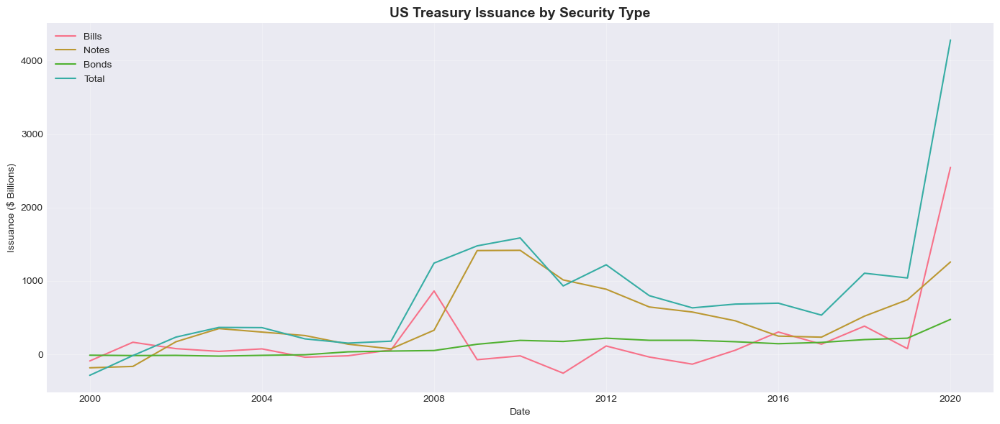

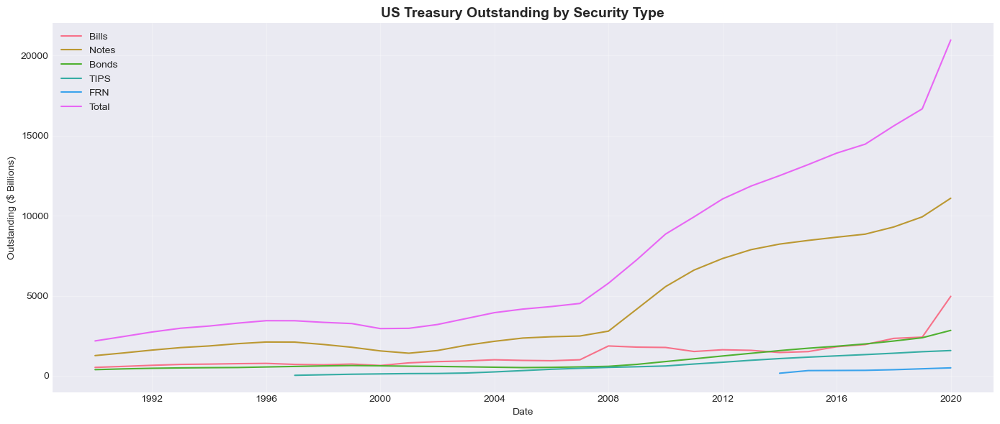


 MACROECONOMIC CORRELATIONS
--------------------------------------------------------------------------------

Issuance:


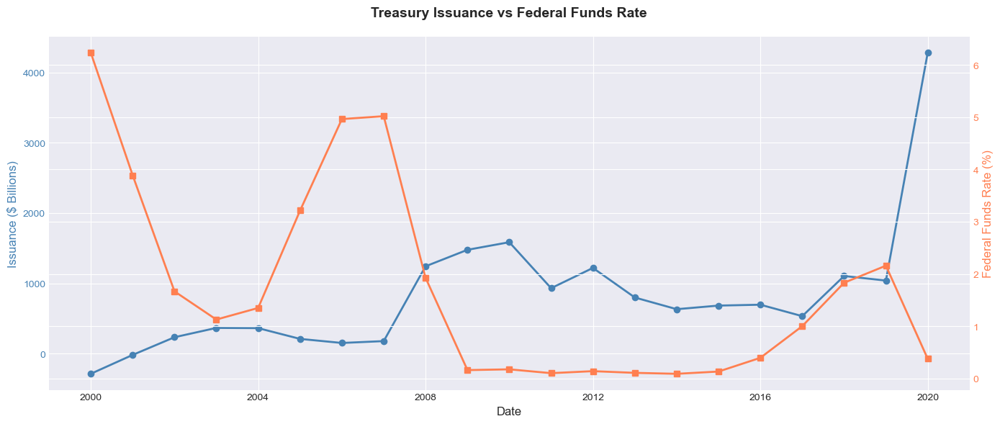

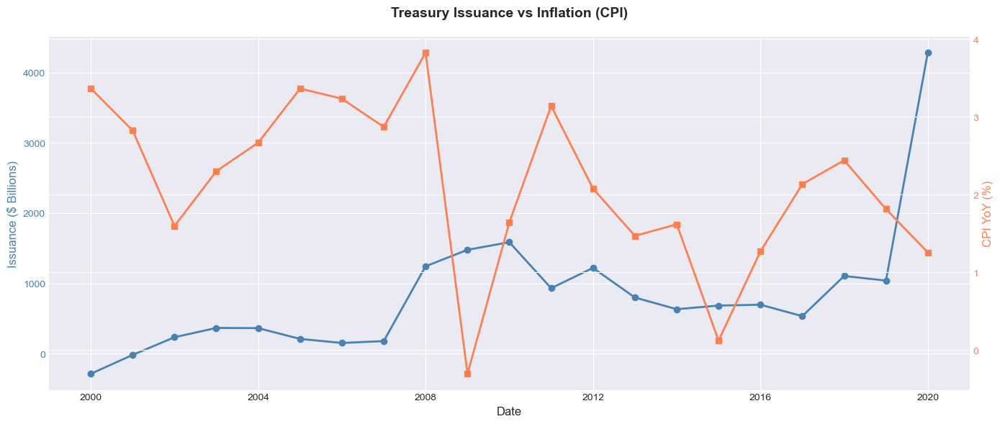

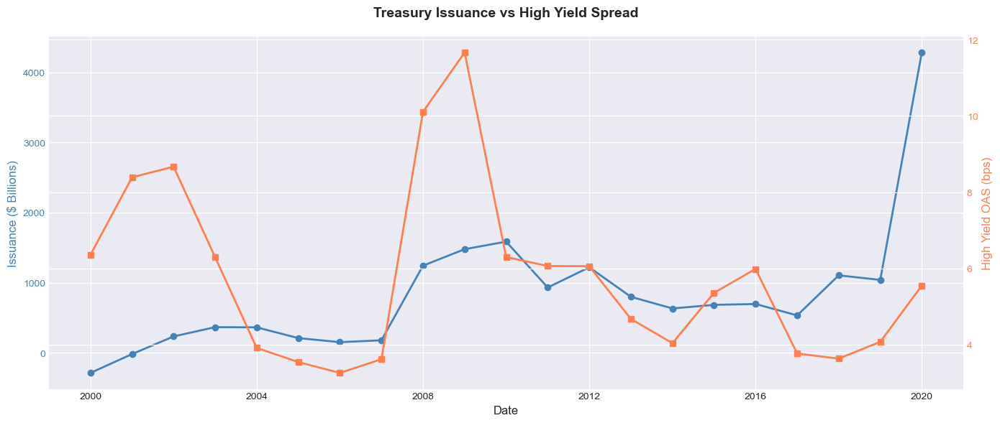


Issuance - Correlation with Macro Indicators:
  Federal Funds Rate...................... -0.511
  CPI YoY................................. -0.384
  High Yield Spread.......................  0.138


Outstanding:


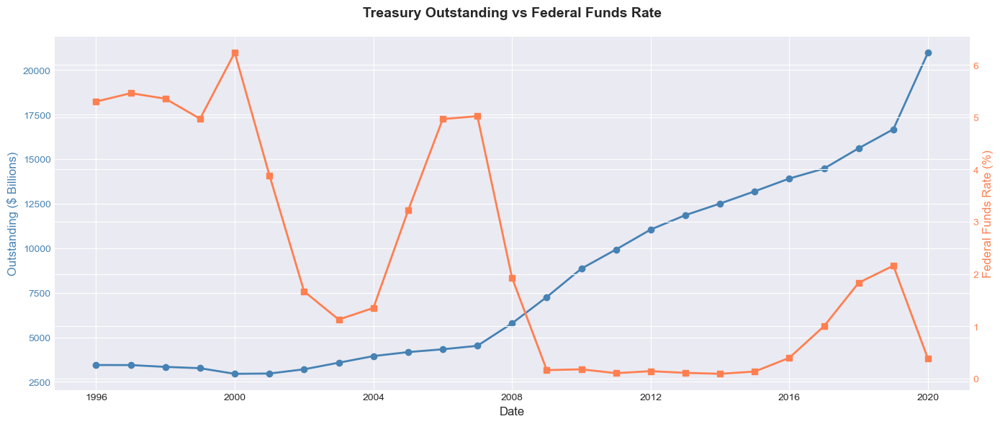

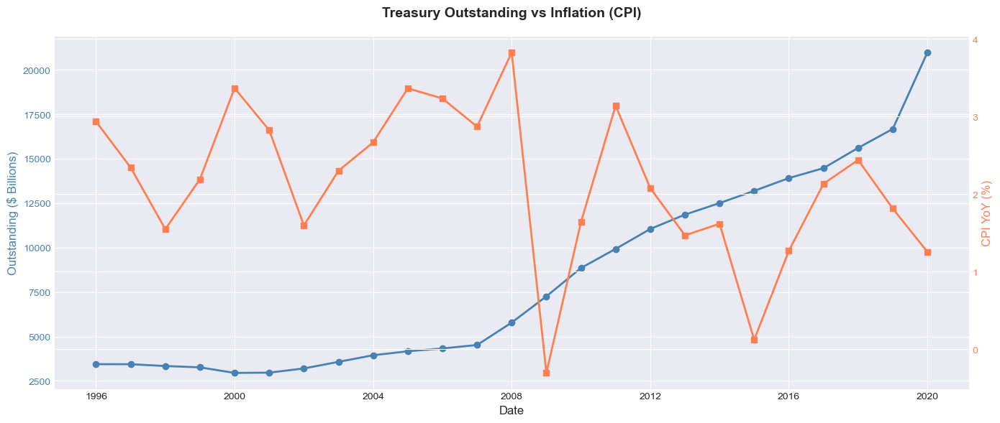

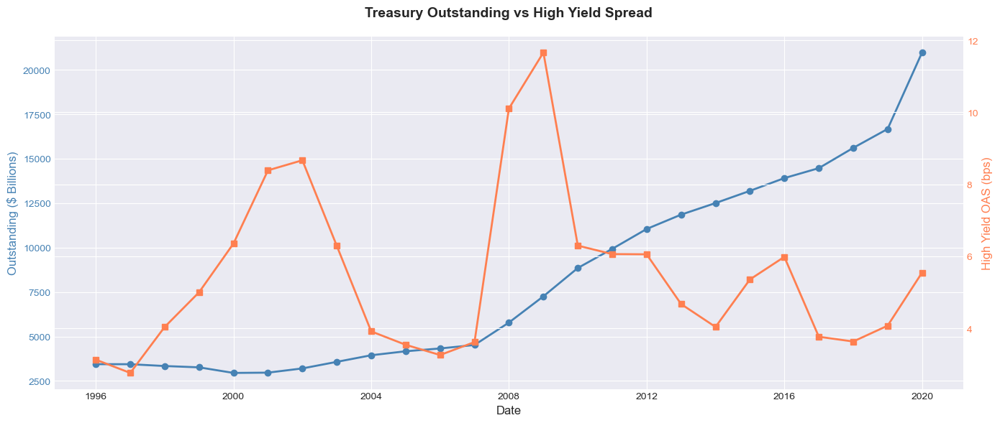


Outstanding - Correlation with Macro Indicators:
  Federal Funds Rate...................... -0.650
  CPI YoY................................. -0.443
  High Yield Spread....................... -0.111


In [58]:
# ============================================================================
# TREASURY ISSUANCE AND OUTSTANDING ANALYSIS
# ============================================================================

print("=" * 80)
print("US TREASURY ISSUANCE AND OUTSTANDING ANALYSIS")
print("=" * 80)

# Descriptive Statistics
print("\n DESCRIPTIVE STATISTICS")
print("-" * 80)

print("\nTreasury Issuance:")
issuance_cols = ['Bills', 'Notes', 'Bonds', 'Total']
treasury_issuance_stats = calculate_descriptive_stats(us_treasury_issuance, issuance_cols)
display(treasury_issuance_stats)

print("\nTreasury Outstanding:")
outstanding_cols = ['Bills', 'Notes', 'Bonds', 'TIPS', 'FRN', 'Total']
treasury_outstanding_stats = calculate_descriptive_stats(us_treasury_outstanding, outstanding_cols)
display(treasury_outstanding_stats)

# Time Series Plots
print("\n TIME SERIES PLOTS")
print("-" * 80)

plot_time_series(
    us_treasury_issuance,
    value_cols=issuance_cols,
    title='US Treasury Issuance by Security Type',
    ylabel='Issuance ($ Billions)'
)

plot_time_series(
    us_treasury_outstanding,
    value_cols=outstanding_cols,
    title='US Treasury Outstanding by Security Type',
    ylabel='Outstanding ($ Billions)'
)

# Macroeconomic Correlations
print("\n MACROECONOMIC CORRELATIONS")
print("-" * 80)

# Prepare annual macro data
fed_funds_annual = fed_funds_monthly.resample('Y').mean().reset_index()
fed_funds_annual.columns = ['Date', 'FedFunds']
fed_funds_annual['Date'] = fed_funds_annual['Date'].dt.to_period('Y').dt.to_timestamp()

cpi_yoy_annual = cpi_yoy.resample('Y').mean().reset_index()
cpi_yoy_annual.columns = ['Date', 'CPI_YoY']
cpi_yoy_annual['Date'] = cpi_yoy_annual['Date'].dt.to_period('Y').dt.to_timestamp()

hy_spread_annual = hy_spread_monthly.resample('Y').mean().reset_index()
hy_spread_annual.columns = ['Date', 'HY_OAS']
hy_spread_annual['Date'] = hy_spread_annual['Date'].dt.to_period('Y').dt.to_timestamp()

# ISSUANCE - Merge and plot
print("\nIssuance:")
treasury_issuance_macro = us_treasury_issuance[['Date', 'Total']].copy()
treasury_issuance_macro = treasury_issuance_macro.merge(fed_funds_annual, on='Date', how='inner')
treasury_issuance_macro = treasury_issuance_macro.merge(cpi_yoy_annual, on='Date', how='inner')
treasury_issuance_macro = treasury_issuance_macro.merge(hy_spread_annual, on='Date', how='inner')

# Plot with Federal Funds Rate
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(treasury_issuance_macro['Date'], treasury_issuance_macro['Total'], color='steelblue', linewidth=2, marker='o')
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Issuance ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(treasury_issuance_macro['Date'], treasury_issuance_macro['FedFunds'], color='coral', linewidth=2, marker='s')
ax2.set_ylabel('Federal Funds Rate (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Treasury Issuance vs Federal Funds Rate', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with CPI
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(treasury_issuance_macro['Date'], treasury_issuance_macro['Total'], color='steelblue', linewidth=2, marker='o')
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Issuance ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(treasury_issuance_macro['Date'], treasury_issuance_macro['CPI_YoY'], color='coral', linewidth=2, marker='s')
ax2.set_ylabel('CPI YoY (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Treasury Issuance vs Inflation (CPI)', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with High Yield Spread
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(treasury_issuance_macro['Date'], treasury_issuance_macro['Total'], color='steelblue', linewidth=2, marker='o')
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Issuance ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(treasury_issuance_macro['Date'], treasury_issuance_macro['HY_OAS'], color='coral', linewidth=2, marker='s')
ax2.set_ylabel('High Yield OAS (bps)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Treasury Issuance vs High Yield Spread', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

correlations_issuance = {
    'Federal Funds Rate': treasury_issuance_macro[['Total', 'FedFunds']].corr().iloc[0, 1],
    'CPI YoY': treasury_issuance_macro[['Total', 'CPI_YoY']].corr().iloc[0, 1],
    'High Yield Spread': treasury_issuance_macro[['Total', 'HY_OAS']].corr().iloc[0, 1]
}

print("\nIssuance - Correlation with Macro Indicators:")
for indicator, corr in correlations_issuance.items():
    print(f"  {indicator:.<40} {corr:>6.3f}")

# OUTSTANDING - Merge and plot
print("\n\nOutstanding:")
treasury_outstanding_macro = us_treasury_outstanding[['Date', 'Total']].copy()
treasury_outstanding_macro = treasury_outstanding_macro.merge(fed_funds_annual, on='Date', how='inner')
treasury_outstanding_macro = treasury_outstanding_macro.merge(cpi_yoy_annual, on='Date', how='inner')
treasury_outstanding_macro = treasury_outstanding_macro.merge(hy_spread_annual, on='Date', how='inner')

# Plot with Federal Funds Rate
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(treasury_outstanding_macro['Date'], treasury_outstanding_macro['Total'], color='steelblue', linewidth=2, marker='o')
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Outstanding ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(treasury_outstanding_macro['Date'], treasury_outstanding_macro['FedFunds'], color='coral', linewidth=2, marker='s')
ax2.set_ylabel('Federal Funds Rate (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Treasury Outstanding vs Federal Funds Rate', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with CPI
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(treasury_outstanding_macro['Date'], treasury_outstanding_macro['Total'], color='steelblue', linewidth=2, marker='o')
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Outstanding ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(treasury_outstanding_macro['Date'], treasury_outstanding_macro['CPI_YoY'], color='coral', linewidth=2, marker='s')
ax2.set_ylabel('CPI YoY (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Treasury Outstanding vs Inflation (CPI)', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with High Yield Spread
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(treasury_outstanding_macro['Date'], treasury_outstanding_macro['Total'], color='steelblue', linewidth=2, marker='o')
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Outstanding ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(treasury_outstanding_macro['Date'], treasury_outstanding_macro['HY_OAS'], color='coral', linewidth=2, marker='s')
ax2.set_ylabel('High Yield OAS (bps)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Treasury Outstanding vs High Yield Spread', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

correlations_outstanding = {
    'Federal Funds Rate': treasury_outstanding_macro[['Total', 'FedFunds']].corr().iloc[0, 1],
    'CPI YoY': treasury_outstanding_macro[['Total', 'CPI_YoY']].corr().iloc[0, 1],
    'High Yield Spread': treasury_outstanding_macro[['Total', 'HY_OAS']].corr().iloc[0, 1]
}

print("\nOutstanding - Correlation with Macro Indicators:")
for indicator, corr in correlations_outstanding.items():
    print(f"  {indicator:.<40} {corr:>6.3f}")


### 2. US MBS Issuance and Outstanding

US MBS ISSUANCE AND OUTSTANDING ANALYSIS

 DESCRIPTIVE STATISTICS
--------------------------------------------------------------------------------

MBS Issuance:


,Agency,Non-Agency,Total
count,25.000000,25.000000,25.000000
mean,1597.897040,385.381703,1983.278743
std,709.953959,418.388674,805.237158
min,443.435569,70.032191,551.782278
25%,1265.161643,138.191966,1439.641644
50%,1601.417196,223.926444,2012.587623
75%,1982.014695,339.462022,2428.668839
max,3735.402570,1491.797619,3996.484141
skew,0.943027,1.757550,0.436662
kurtosis,2.412811,2.046747,0.771754



MBS Outstanding:


,Agency,Non-Agency,Total
count,19.000000,19.000000,19.000000
mean,6650.016316,1996.000276,8646.016592
std,1599.348925,751.147368,1504.557756
min,4080.939700,1208.455100,5289.394800
25%,5446.118550,1382.493250,8566.260250
50%,6947.737700,1702.974700,9023.211929
75%,7502.661885,2489.892500,9369.223700
max,9833.900000,3584.968700,11214.048700
skew,-0.014020,0.931520,-0.996233
kurtosis,-0.514820,-0.379921,0.784485



 TIME SERIES PLOTS
--------------------------------------------------------------------------------


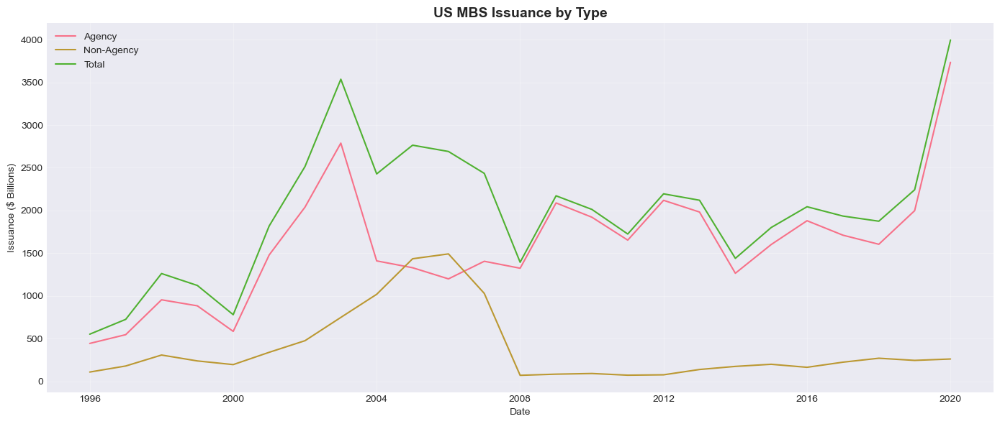

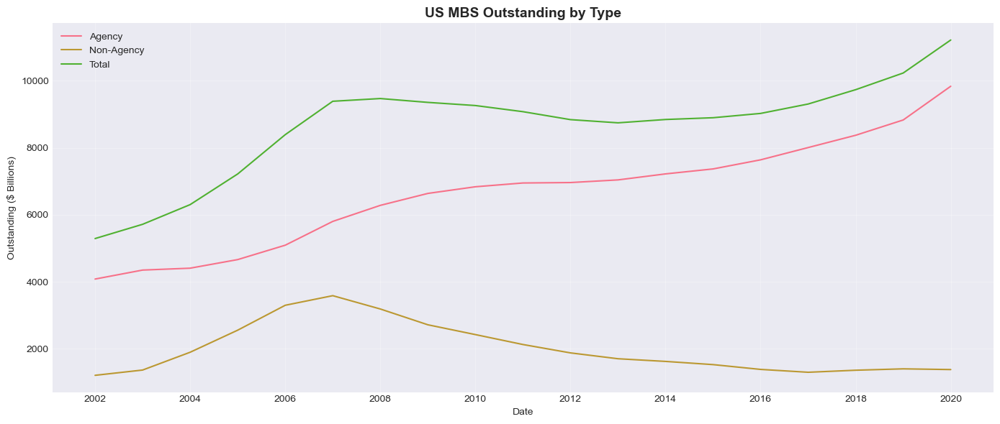


 MACROECONOMIC CORRELATIONS
--------------------------------------------------------------------------------

Issuance:


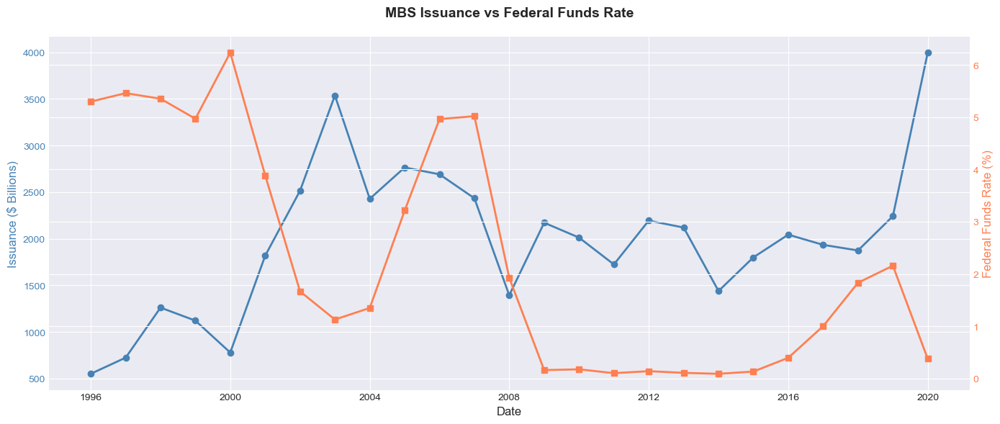

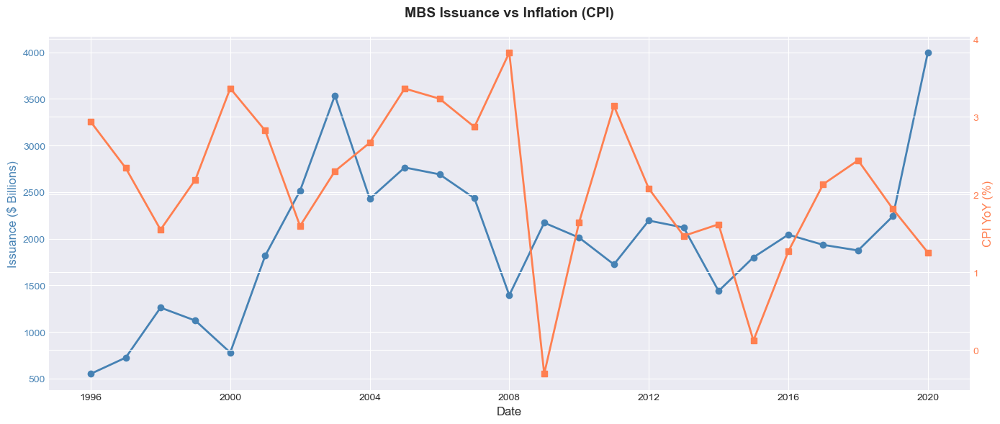

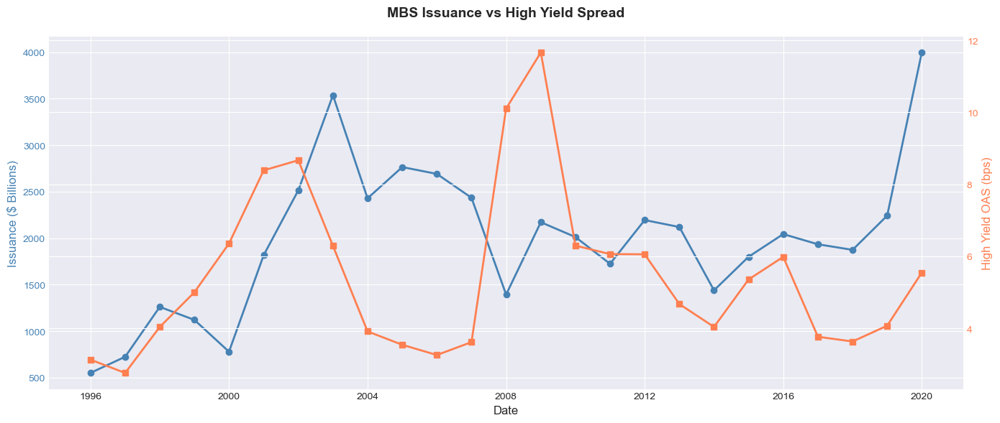


Issuance - Correlation with Macro Indicators:
  Federal Funds Rate...................... -0.458
  CPI YoY................................. -0.182
  High Yield Spread.......................  0.098


Outstanding:


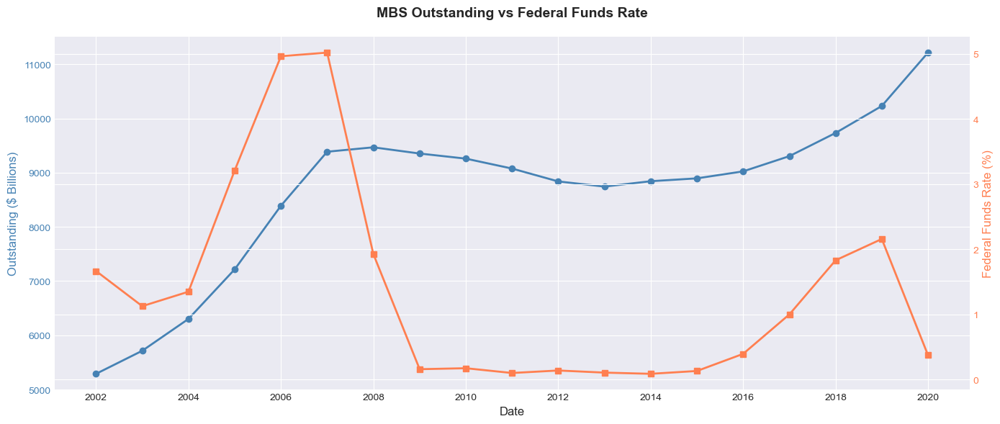

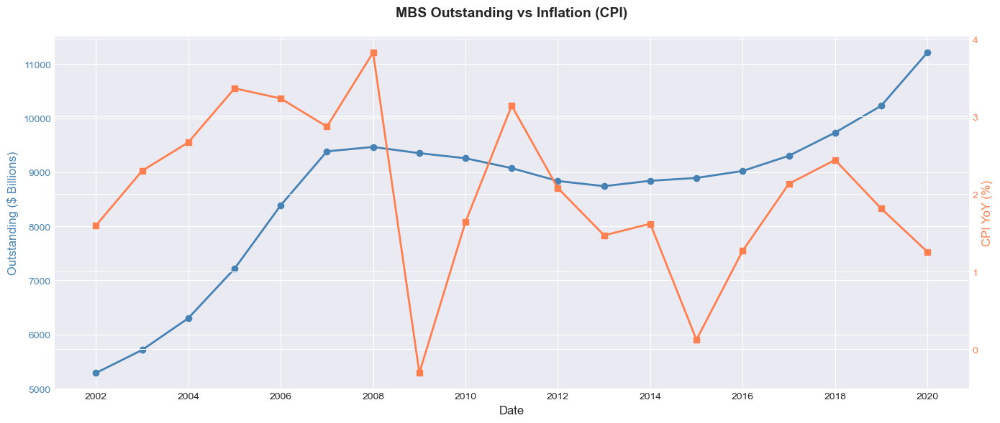

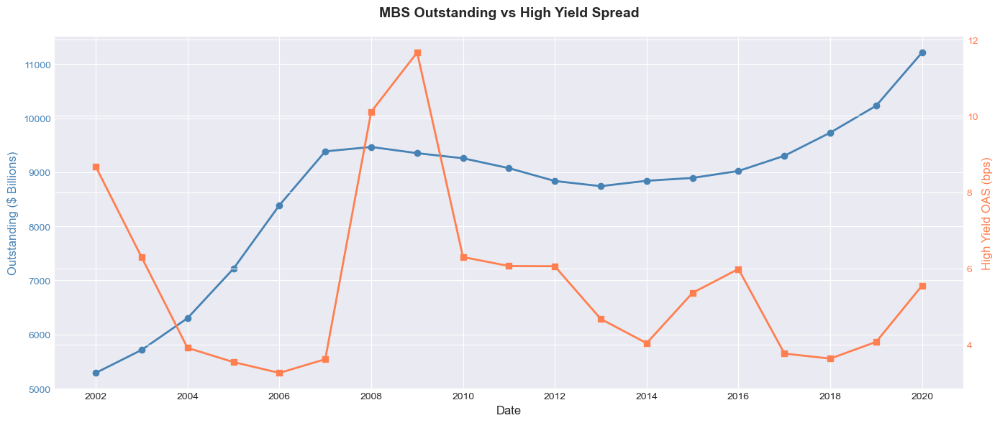


Outstanding - Correlation with Macro Indicators:
  Federal Funds Rate...................... -0.121
  CPI YoY................................. -0.176
  High Yield Spread....................... -0.061


In [59]:
# ============================================================================
# MBS ISSUANCE AND OUTSTANDING ANALYSIS
# ============================================================================

print("=" * 80)
print("US MBS ISSUANCE AND OUTSTANDING ANALYSIS")
print("=" * 80)

# Descriptive Statistics
print("\n DESCRIPTIVE STATISTICS")
print("-" * 80)

print("\nMBS Issuance:")
mbs_issuance_cols = ['Agency', 'Non-Agency', 'Total']
mbs_issuance_stats = calculate_descriptive_stats(us_mortgage_issuance, mbs_issuance_cols)
display(mbs_issuance_stats)

print("\nMBS Outstanding:")
mbs_outstanding_cols = ['Agency', 'Non-Agency', 'Total']
mbs_outstanding_stats = calculate_descriptive_stats(us_mortgage_outstanding, mbs_outstanding_cols)
display(mbs_outstanding_stats)

# Time Series Plots
print("\n TIME SERIES PLOTS")
print("-" * 80)

plot_time_series(
    us_mortgage_issuance,
    value_cols=mbs_issuance_cols,
    title='US MBS Issuance by Type',
    ylabel='Issuance ($ Billions)'
)

plot_time_series(
    us_mortgage_outstanding,
    value_cols=mbs_outstanding_cols,
    title='US MBS Outstanding by Type',
    ylabel='Outstanding ($ Billions)'
)

# Macroeconomic Correlations
print("\n MACROECONOMIC CORRELATIONS")
print("-" * 80)

# ISSUANCE - Merge and plot
print("\nIssuance:")
mbs_issuance_macro = us_mortgage_issuance[['Date', 'Total']].copy()
mbs_issuance_macro = mbs_issuance_macro.merge(fed_funds_annual, on='Date', how='inner')
mbs_issuance_macro = mbs_issuance_macro.merge(cpi_yoy_annual, on='Date', how='inner')
mbs_issuance_macro = mbs_issuance_macro.merge(hy_spread_annual, on='Date', how='inner')

# Plot with Federal Funds Rate
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(mbs_issuance_macro['Date'], mbs_issuance_macro['Total'], color='steelblue', linewidth=2, marker='o')
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Issuance ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(mbs_issuance_macro['Date'], mbs_issuance_macro['FedFunds'], color='coral', linewidth=2, marker='s')
ax2.set_ylabel('Federal Funds Rate (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('MBS Issuance vs Federal Funds Rate', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with CPI
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(mbs_issuance_macro['Date'], mbs_issuance_macro['Total'], color='steelblue', linewidth=2, marker='o')
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Issuance ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(mbs_issuance_macro['Date'], mbs_issuance_macro['CPI_YoY'], color='coral', linewidth=2, marker='s')
ax2.set_ylabel('CPI YoY (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('MBS Issuance vs Inflation (CPI)', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with High Yield Spread
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(mbs_issuance_macro['Date'], mbs_issuance_macro['Total'], color='steelblue', linewidth=2, marker='o')
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Issuance ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(mbs_issuance_macro['Date'], mbs_issuance_macro['HY_OAS'], color='coral', linewidth=2, marker='s')
ax2.set_ylabel('High Yield OAS (bps)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('MBS Issuance vs High Yield Spread', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

correlations_mbs_issuance = {
    'Federal Funds Rate': mbs_issuance_macro[['Total', 'FedFunds']].corr().iloc[0, 1],
    'CPI YoY': mbs_issuance_macro[['Total', 'CPI_YoY']].corr().iloc[0, 1],
    'High Yield Spread': mbs_issuance_macro[['Total', 'HY_OAS']].corr().iloc[0, 1]
}

print("\nIssuance - Correlation with Macro Indicators:")
for indicator, corr in correlations_mbs_issuance.items():
    print(f"  {indicator:.<40} {corr:>6.3f}")

# OUTSTANDING - Merge and plot
print("\n\nOutstanding:")
mbs_outstanding_macro = us_mortgage_outstanding[['Date', 'Total']].copy()
mbs_outstanding_macro = mbs_outstanding_macro.merge(fed_funds_annual, on='Date', how='inner')
mbs_outstanding_macro = mbs_outstanding_macro.merge(cpi_yoy_annual, on='Date', how='inner')
mbs_outstanding_macro = mbs_outstanding_macro.merge(hy_spread_annual, on='Date', how='inner')

# Plot with Federal Funds Rate
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(mbs_outstanding_macro['Date'], mbs_outstanding_macro['Total'], color='steelblue', linewidth=2, marker='o')
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Outstanding ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(mbs_outstanding_macro['Date'], mbs_outstanding_macro['FedFunds'], color='coral', linewidth=2, marker='s')
ax2.set_ylabel('Federal Funds Rate (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('MBS Outstanding vs Federal Funds Rate', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with CPI
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(mbs_outstanding_macro['Date'], mbs_outstanding_macro['Total'], color='steelblue', linewidth=2, marker='o')
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Outstanding ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(mbs_outstanding_macro['Date'], mbs_outstanding_macro['CPI_YoY'], color='coral', linewidth=2, marker='s')
ax2.set_ylabel('CPI YoY (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('MBS Outstanding vs Inflation (CPI)', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with High Yield Spread
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(mbs_outstanding_macro['Date'], mbs_outstanding_macro['Total'], color='steelblue', linewidth=2, marker='o')
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Outstanding ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(mbs_outstanding_macro['Date'], mbs_outstanding_macro['HY_OAS'], color='coral', linewidth=2, marker='s')
ax2.set_ylabel('High Yield OAS (bps)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('MBS Outstanding vs High Yield Spread', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

correlations_mbs_outstanding = {
    'Federal Funds Rate': mbs_outstanding_macro[['Total', 'FedFunds']].corr().iloc[0, 1],
    'CPI YoY': mbs_outstanding_macro[['Total', 'CPI_YoY']].corr().iloc[0, 1],
    'High Yield Spread': mbs_outstanding_macro[['Total', 'HY_OAS']].corr().iloc[0, 1]
}

print("\nOutstanding - Correlation with Macro Indicators:")
for indicator, corr in correlations_mbs_outstanding.items():
    print(f"  {indicator:.<40} {corr:>6.3f}")

### 3. US ABS Issuance and Outstanding

US ABS ISSUANCE AND OUTSTANDING ANALYSIS

 DESCRIPTIVE STATISTICS
--------------------------------------------------------------------------------

ABS Issuance:


,Auto,CDO/CLO,Credit Cards,Equipment,Other,Student Loans,Total
count,36.000000,32.000000,34.000000,36.000000,36.000000,31.000000,36.000000
mean,59838.386472,95240.487591,37289.136059,11213.072492,26664.997715,20212.236484,234997.166677
std,36964.631888,120359.910713,21820.687749,8476.192760,21862.239494,18065.563741,194421.095217
min,894.900000,1.500000,2405.200000,111.500000,83.313310,12.292000,1314.313310
25%,25189.825000,6360.849500,20317.100000,3691.865250,6156.707606,10187.145000,64412.705023
50%,65270.400000,55746.700000,38494.055000,11920.100000,24414.425045,15802.000000,205753.987075
75%,89644.813250,120878.784750,51469.943750,17215.900000,39365.766682,24008.859000,326708.683141
max,123533.505000,489680.190000,95727.985000,33004.390000,71712.060120,67545.975000,795868.142575
skew,-0.121096,1.872554,0.364179,0.434259,0.574936,1.396135,0.990765
kurtosis,-1.419999,3.418238,0.001479,-0.286124,-0.680157,1.491957,0.809387



ABS Outstanding:


,Automobile,CDO/CLO,Credit Card,Equipment,Other,Student Loans,Total
count,36.000000,36.000000,36.000000,36.000000,36.000000,36.000000,36.000000
mean,118.993462,381.905217,157.313646,33.371754,76.861821,104.355850,872.801749
std,74.036973,365.781725,103.026820,23.366615,68.718778,96.953843,657.538066
min,0.898100,0.000000,0.000000,0.264100,0.084400,0.000000,1.320800
25%,42.364425,1.979625,74.043750,10.241875,6.568325,2.775475,155.417250
50%,133.713100,278.233050,130.789600,38.467500,69.220650,73.855350,950.071600
75%,187.734350,703.641450,247.105450,49.865600,113.963925,201.308450,1408.297750
max,236.194472,1056.897800,324.776600,84.262800,235.436550,242.201800,1963.522000
skew,-0.220242,0.294095,0.138661,-0.031720,0.656935,0.216110,-0.039046
kurtosis,-1.429538,-1.545167,-1.165098,-0.797273,-0.361360,-1.729892,-1.580928



 TIME SERIES PLOTS
--------------------------------------------------------------------------------


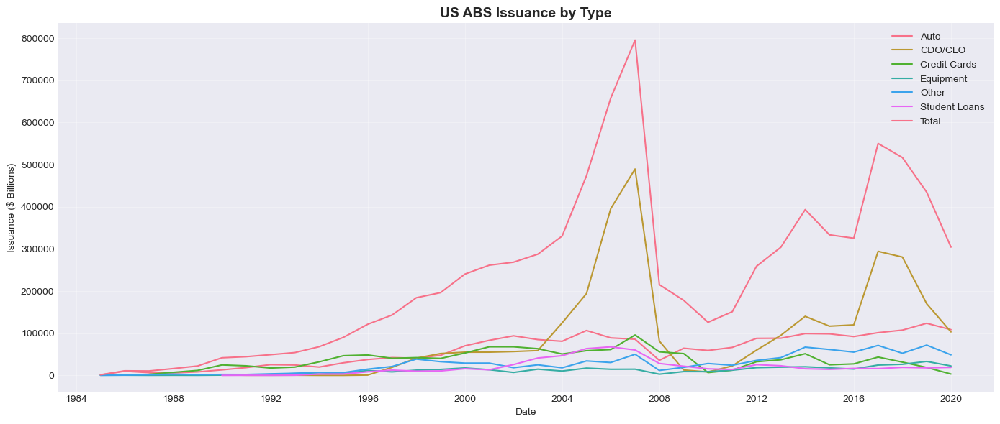

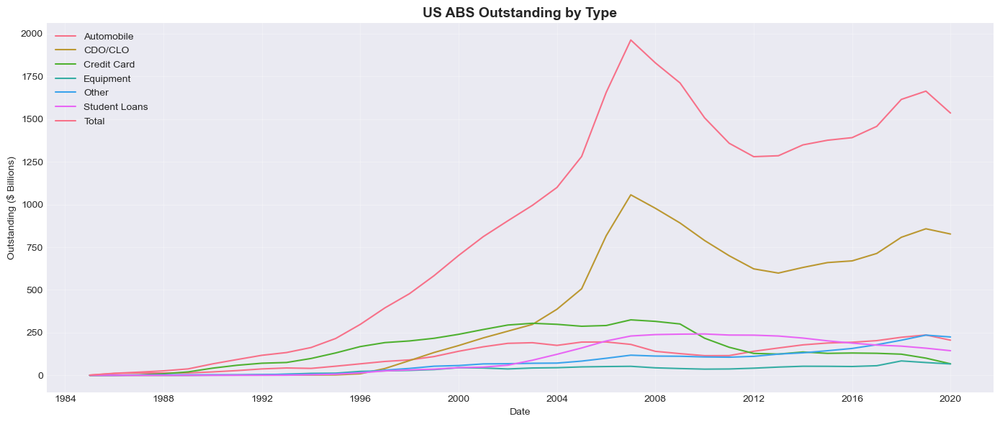


 MACROECONOMIC CORRELATIONS
--------------------------------------------------------------------------------

Issuance:


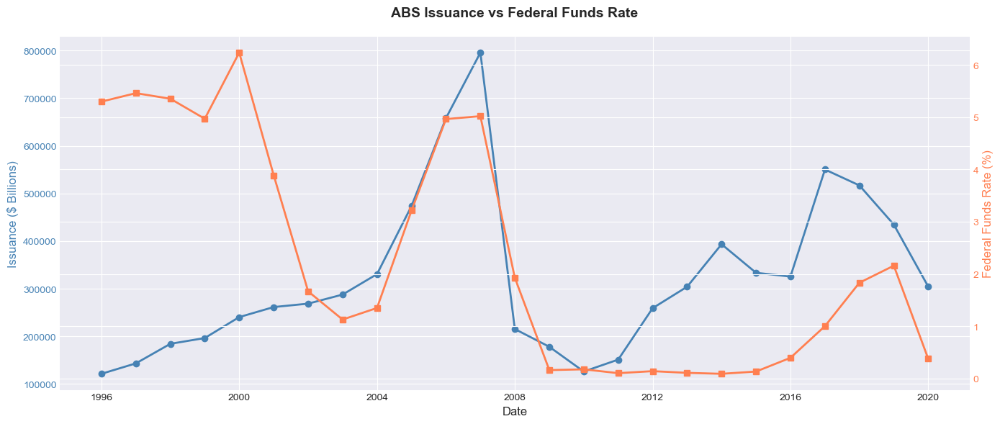

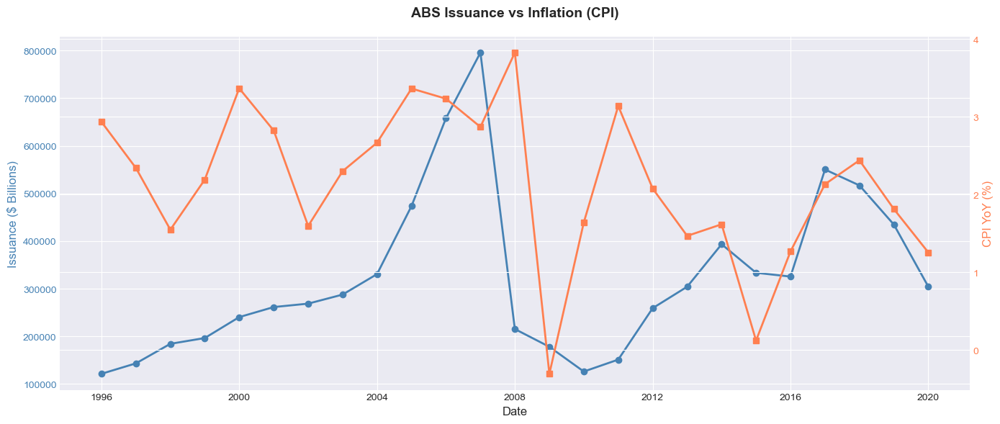

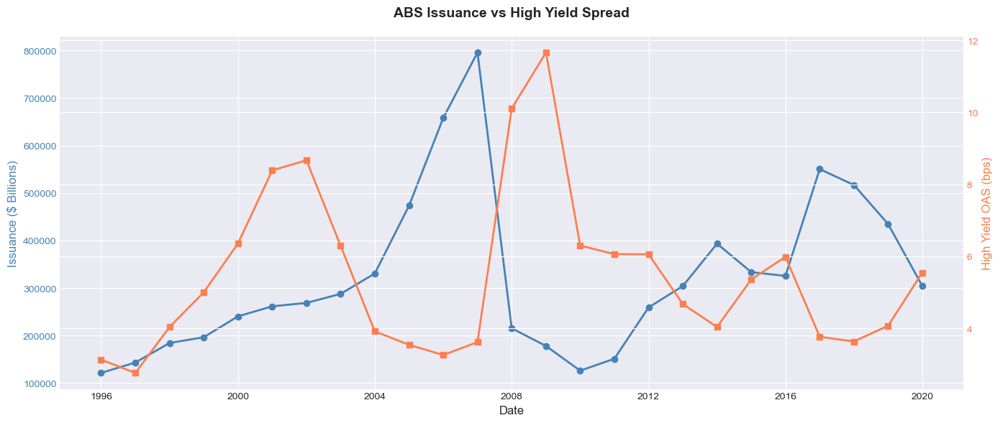


Issuance - Correlation with Macro Indicators:
  Federal Funds Rate......................  0.090
  CPI YoY.................................  0.186
  High Yield Spread....................... -0.417


Outstanding:


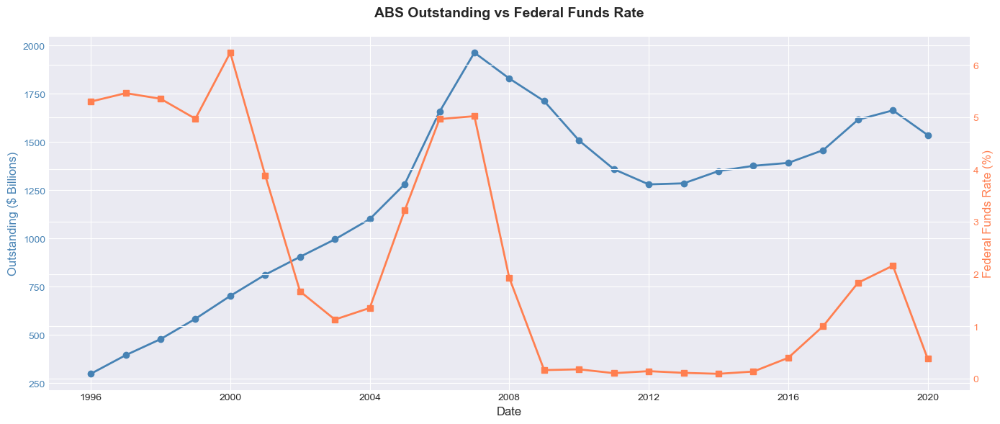

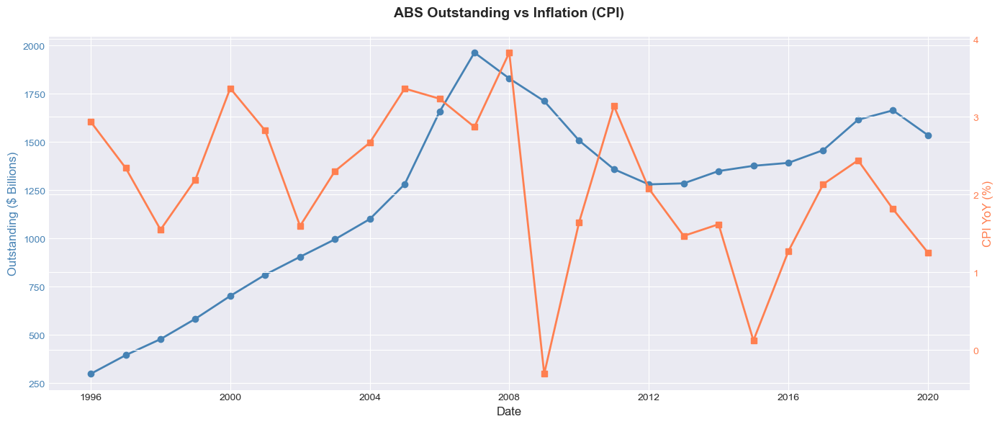

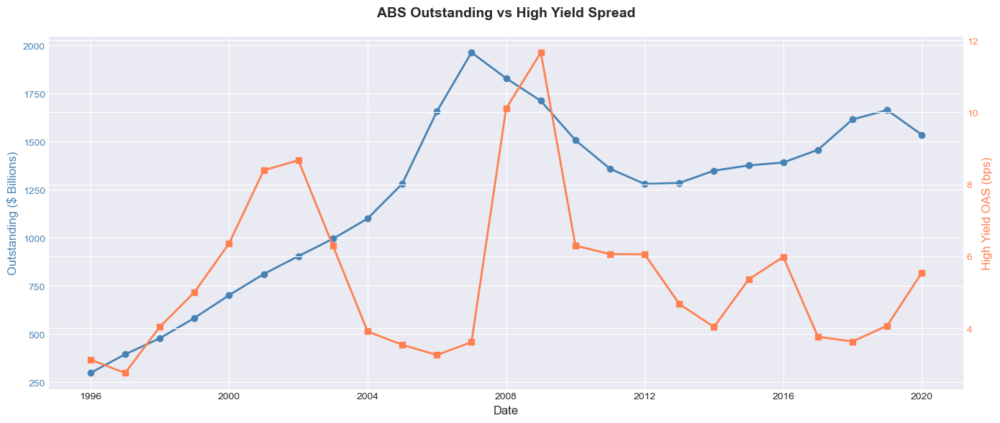


Outstanding - Correlation with Macro Indicators:
  Federal Funds Rate...................... -0.529
  CPI YoY................................. -0.119
  High Yield Spread.......................  0.198


In [60]:
# ============================================================================
# ABS ISSUANCE AND OUTSTANDING ANALYSIS
# ============================================================================

print("=" * 80)
print("US ABS ISSUANCE AND OUTSTANDING ANALYSIS")
print("=" * 80)

# Descriptive Statistics
print("\n DESCRIPTIVE STATISTICS")
print("-" * 80)

print("\nABS Issuance:")
abs_issuance_cols = ['Auto', 'CDO/CLO', 'Credit Cards', 'Equipment', 'Other', 'Student Loans', 'Total']
abs_issuance_stats = calculate_descriptive_stats(us_abs_issuance, abs_issuance_cols)
display(abs_issuance_stats)

print("\nABS Outstanding:")
abs_outstanding_cols = ['Automobile', 'CDO/CLO', 'Credit Card', 'Equipment', 'Other', 'Student Loans', 'Total']
abs_outstanding_stats = calculate_descriptive_stats(us_abs_outstanding, abs_outstanding_cols)
display(abs_outstanding_stats)

# Time Series Plots
print("\n TIME SERIES PLOTS")
print("-" * 80)

plot_time_series(
    us_abs_issuance,
    value_cols=abs_issuance_cols,
    title='US ABS Issuance by Type',
    ylabel='Issuance ($ Billions)'
)

plot_time_series(
    us_abs_outstanding,
    value_cols=abs_outstanding_cols,
    title='US ABS Outstanding by Type',
    ylabel='Outstanding ($ Billions)'
)

# Macroeconomic Correlations
print("\n MACROECONOMIC CORRELATIONS")
print("-" * 80)

# ISSUANCE - Merge and plot
print("\nIssuance:")
abs_issuance_macro = us_abs_issuance[['Date', 'Total']].copy()
abs_issuance_macro = abs_issuance_macro.merge(fed_funds_annual, on='Date', how='inner')
abs_issuance_macro = abs_issuance_macro.merge(cpi_yoy_annual, on='Date', how='inner')
abs_issuance_macro = abs_issuance_macro.merge(hy_spread_annual, on='Date', how='inner')

# Plot with Federal Funds Rate
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(abs_issuance_macro['Date'], abs_issuance_macro['Total'], color='steelblue', linewidth=2, marker='o')
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Issuance ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(abs_issuance_macro['Date'], abs_issuance_macro['FedFunds'], color='coral', linewidth=2, marker='s')
ax2.set_ylabel('Federal Funds Rate (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('ABS Issuance vs Federal Funds Rate', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with CPI
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(abs_issuance_macro['Date'], abs_issuance_macro['Total'], color='steelblue', linewidth=2, marker='o')
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Issuance ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(abs_issuance_macro['Date'], abs_issuance_macro['CPI_YoY'], color='coral', linewidth=2, marker='s')
ax2.set_ylabel('CPI YoY (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('ABS Issuance vs Inflation (CPI)', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with High Yield Spread
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(abs_issuance_macro['Date'], abs_issuance_macro['Total'], color='steelblue', linewidth=2, marker='o')
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Issuance ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(abs_issuance_macro['Date'], abs_issuance_macro['HY_OAS'], color='coral', linewidth=2, marker='s')
ax2.set_ylabel('High Yield OAS (bps)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('ABS Issuance vs High Yield Spread', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

correlations_abs_issuance = {
    'Federal Funds Rate': abs_issuance_macro[['Total', 'FedFunds']].corr().iloc[0, 1],
    'CPI YoY': abs_issuance_macro[['Total', 'CPI_YoY']].corr().iloc[0, 1],
    'High Yield Spread': abs_issuance_macro[['Total', 'HY_OAS']].corr().iloc[0, 1]
}

print("\nIssuance - Correlation with Macro Indicators:")
for indicator, corr in correlations_abs_issuance.items():
    print(f"  {indicator:.<40} {corr:>6.3f}")

# OUTSTANDING - Merge and plot
print("\n\nOutstanding:")
abs_outstanding_macro = us_abs_outstanding[['Date', 'Total']].copy()
abs_outstanding_macro = abs_outstanding_macro.merge(fed_funds_annual, on='Date', how='inner')
abs_outstanding_macro = abs_outstanding_macro.merge(cpi_yoy_annual, on='Date', how='inner')
abs_outstanding_macro = abs_outstanding_macro.merge(hy_spread_annual, on='Date', how='inner')

# Plot with Federal Funds Rate
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(abs_outstanding_macro['Date'], abs_outstanding_macro['Total'], color='steelblue', linewidth=2, marker='o')
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Outstanding ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(abs_outstanding_macro['Date'], abs_outstanding_macro['FedFunds'], color='coral', linewidth=2, marker='s')
ax2.set_ylabel('Federal Funds Rate (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('ABS Outstanding vs Federal Funds Rate', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with CPI
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(abs_outstanding_macro['Date'], abs_outstanding_macro['Total'], color='steelblue', linewidth=2, marker='o')
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Outstanding ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(abs_outstanding_macro['Date'], abs_outstanding_macro['CPI_YoY'], color='coral', linewidth=2, marker='s')
ax2.set_ylabel('CPI YoY (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('ABS Outstanding vs Inflation (CPI)', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with High Yield Spread
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(abs_outstanding_macro['Date'], abs_outstanding_macro['Total'], color='steelblue', linewidth=2, marker='o')
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Outstanding ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(abs_outstanding_macro['Date'], abs_outstanding_macro['HY_OAS'], color='coral', linewidth=2, marker='s')
ax2.set_ylabel('High Yield OAS (bps)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('ABS Outstanding vs High Yield Spread', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

correlations_abs_outstanding = {
    'Federal Funds Rate': abs_outstanding_macro[['Total', 'FedFunds']].corr().iloc[0, 1],
    'CPI YoY': abs_outstanding_macro[['Total', 'CPI_YoY']].corr().iloc[0, 1],
    'High Yield Spread': abs_outstanding_macro[['Total', 'HY_OAS']].corr().iloc[0, 1]
}

print("\nOutstanding - Correlation with Macro Indicators:")
for indicator, corr in correlations_abs_outstanding.items():
    print(f"  {indicator:.<40} {corr:>6.3f}")

### 4. US Fixed Income Issuance and Outstanding

US FIXED INCOME ISSUANCE AND OUTSTANDING ANALYSIS

 DESCRIPTIVE STATISTICS
--------------------------------------------------------------------------------

Fixed Income Issuance:


,Treasury,Corporate Debt,Municipal,Mortgage-Related,Total
count,25.000000,25.000000,25.000000,25.000000,25.000000
mean,1504.490165,1081.726516,354.502004,1974.865166,6050.576651
std,996.168177,451.740057,83.520602,803.558496,2209.280897
min,312.584918,357.880200,182.898600,551.782278,2144.342594
25%,652.722222,757.501300,295.124200,1439.641644,4710.221766
50%,1029.445376,1045.938100,380.290900,2012.587623,6432.285651
75%,2215.244415,1423.039800,409.625500,2428.318839,7341.480696
max,3895.800011,2282.020800,484.547000,3996.484141,12214.455082
skew,0.531538,0.625638,-0.672022,0.471618,0.279368
kurtosis,-0.659201,0.392883,-0.415736,0.828871,1.438911



Fixed Income Outstanding:


,Treasury,Corporate Debt,Municipal,Mortgage-Related,Total
count,41.000000,41.000000,41.000000,41.000000,41.000000
mean,5734.178902,4093.055000,2210.233537,4934.288806,20090.398956
std,5237.995103,3063.355503,1334.425265,3774.094115,14535.563325
min,623.200000,467.853000,399.440000,111.396800,1930.009800
25%,2195.800000,1363.512000,1178.619000,1340.118200,7176.631300
50%,3340.500000,3440.712000,1480.713000,4119.309900,16162.204000
75%,8853.023000,6738.086000,3842.512000,8894.813341,33920.737851
max,20973.129000,10560.158000,3968.325000,11214.048700,50913.738821
skew,1.288595,0.544518,0.254785,0.137921,0.425502
kurtosis,0.648519,-1.001986,-1.717800,-1.653914,-1.180744



 TIME SERIES PLOTS
--------------------------------------------------------------------------------


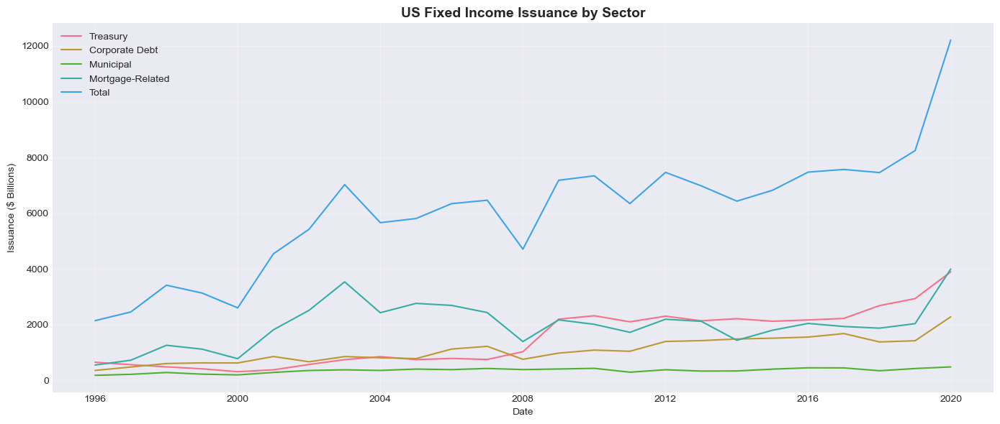

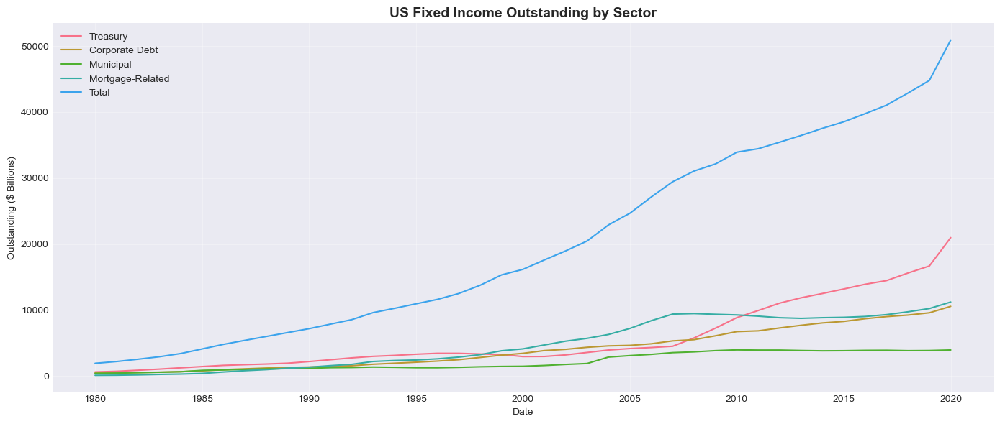


 MACROECONOMIC CORRELATIONS
--------------------------------------------------------------------------------

Issuance:


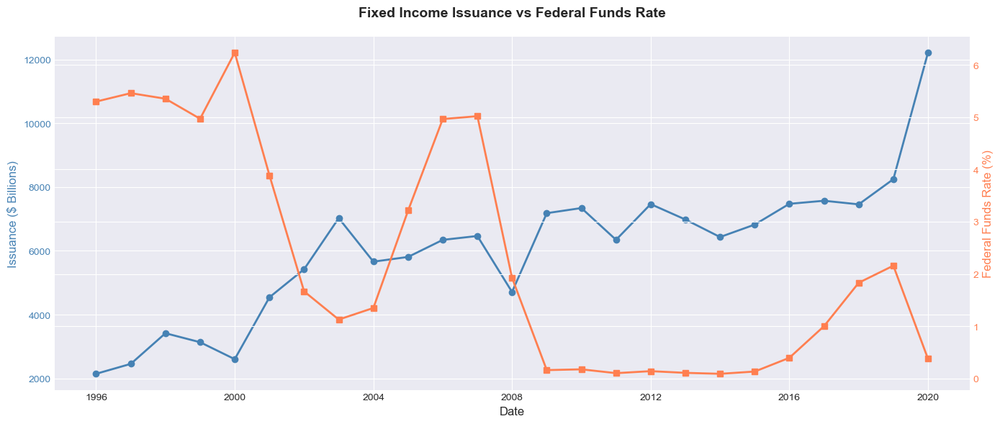

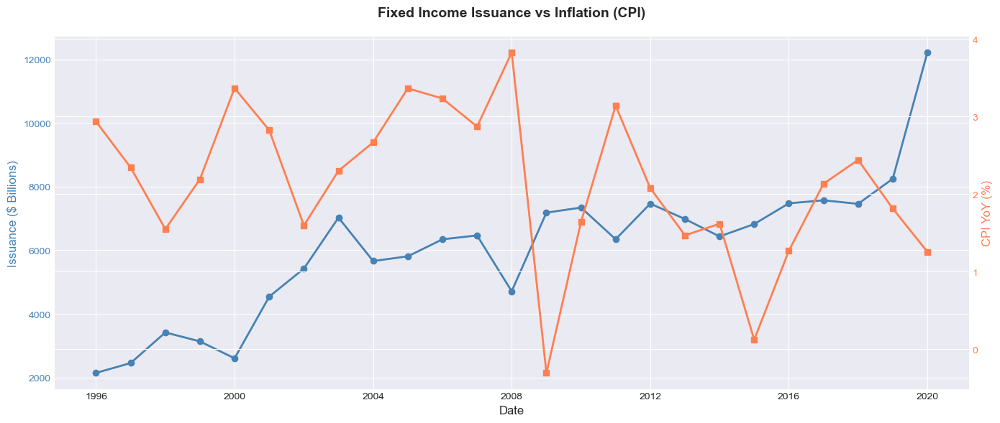

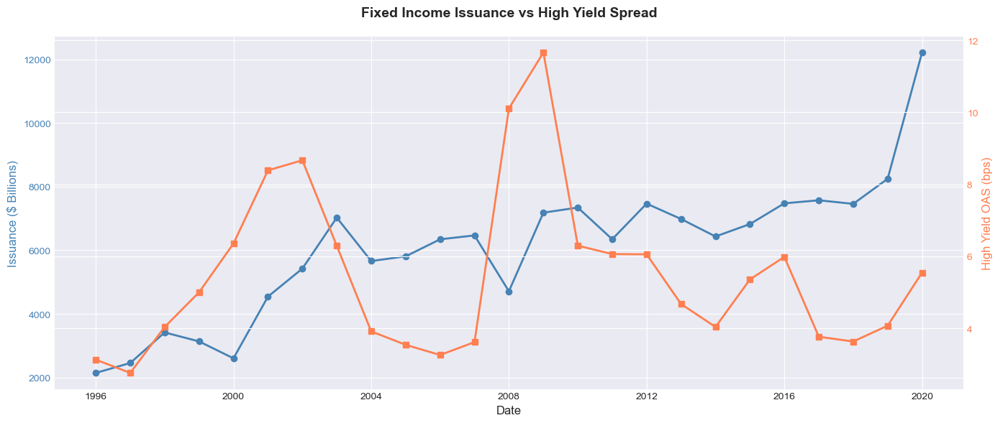


Issuance - Correlation with Macro Indicators:
  Federal Funds Rate...................... -0.727
  CPI YoY................................. -0.418
  High Yield Spread.......................  0.079


Outstanding:


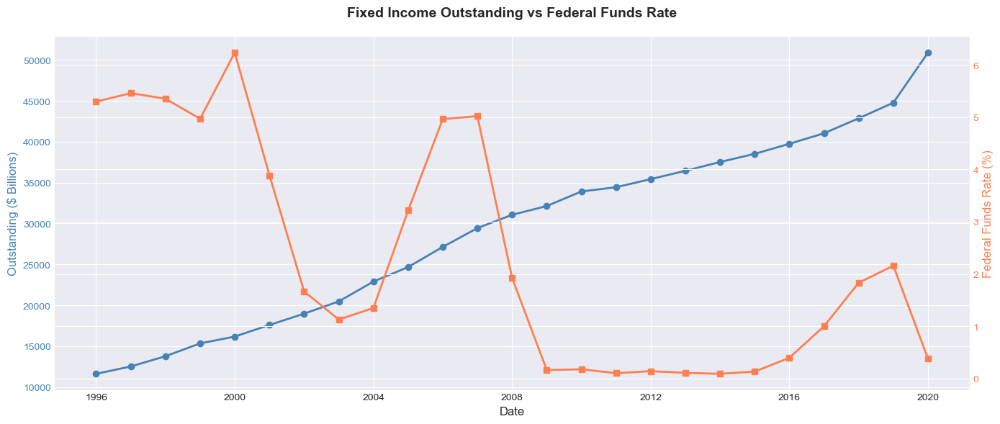

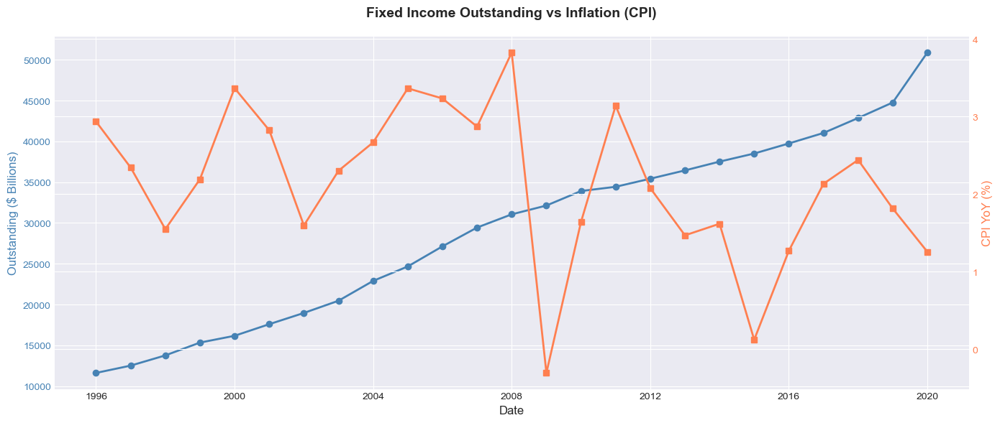

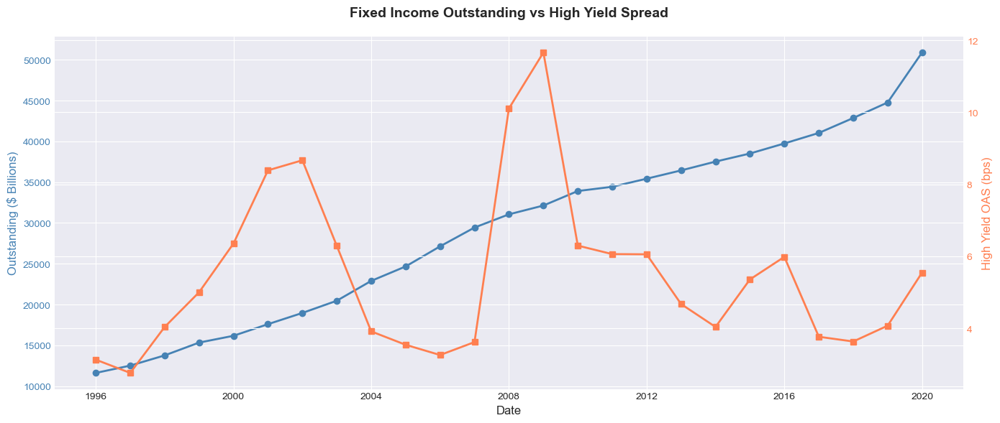


Outstanding - Correlation with Macro Indicators:
  Federal Funds Rate...................... -0.729
  CPI YoY................................. -0.370
  High Yield Spread.......................  0.018


In [61]:
# ============================================================================
# FIXED INCOME ISSUANCE AND OUTSTANDING ANALYSIS
# ============================================================================

print("=" * 80)
print("US FIXED INCOME ISSUANCE AND OUTSTANDING ANALYSIS")
print("=" * 80)

# Descriptive Statistics
print("\n DESCRIPTIVE STATISTICS")
print("-" * 80)

print("\nFixed Income Issuance:")
fixed_issuance_cols = ['Treasury', 'Corporate Debt', 'Municipal', 'Mortgage-Related', 'Total']
fixed_issuance_stats = calculate_descriptive_stats(us_fixed_income_issuance, fixed_issuance_cols)
display(fixed_issuance_stats)

print("\nFixed Income Outstanding:")
fixed_outstanding_cols = ['Treasury', 'Corporate Debt', 'Municipal', 'Mortgage-Related', 'Total']
fixed_outstanding_stats = calculate_descriptive_stats(us_fixed_income_outstanding, fixed_outstanding_cols)
display(fixed_outstanding_stats)

# Time Series Plots
print("\n TIME SERIES PLOTS")
print("-" * 80)

plot_time_series(
    us_fixed_income_issuance,
    value_cols=fixed_issuance_cols,
    title='US Fixed Income Issuance by Sector',
    ylabel='Issuance ($ Billions)'
)

plot_time_series(
    us_fixed_income_outstanding,
    value_cols=fixed_outstanding_cols,
    title='US Fixed Income Outstanding by Sector',
    ylabel='Outstanding ($ Billions)'
)

# Macroeconomic Correlations
print("\n MACROECONOMIC CORRELATIONS")
print("-" * 80)

# ISSUANCE - Merge and plot
print("\nIssuance:")
fixed_issuance_macro = us_fixed_income_issuance[['Date', 'Total']].copy()
fixed_issuance_macro = fixed_issuance_macro.merge(fed_funds_annual, on='Date', how='inner')
fixed_issuance_macro = fixed_issuance_macro.merge(cpi_yoy_annual, on='Date', how='inner')
fixed_issuance_macro = fixed_issuance_macro.merge(hy_spread_annual, on='Date', how='inner')

# Plot with Federal Funds Rate
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(fixed_issuance_macro['Date'], fixed_issuance_macro['Total'], color='steelblue', linewidth=2, marker='o')
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Issuance ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(fixed_issuance_macro['Date'], fixed_issuance_macro['FedFunds'], color='coral', linewidth=2, marker='s')
ax2.set_ylabel('Federal Funds Rate (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Fixed Income Issuance vs Federal Funds Rate', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with CPI
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(fixed_issuance_macro['Date'], fixed_issuance_macro['Total'], color='steelblue', linewidth=2, marker='o')
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Issuance ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(fixed_issuance_macro['Date'], fixed_issuance_macro['CPI_YoY'], color='coral', linewidth=2, marker='s')
ax2.set_ylabel('CPI YoY (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Fixed Income Issuance vs Inflation (CPI)', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with High Yield Spread
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(fixed_issuance_macro['Date'], fixed_issuance_macro['Total'], color='steelblue', linewidth=2, marker='o')
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Issuance ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(fixed_issuance_macro['Date'], fixed_issuance_macro['HY_OAS'], color='coral', linewidth=2, marker='s')
ax2.set_ylabel('High Yield OAS (bps)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Fixed Income Issuance vs High Yield Spread', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

correlations_fixed_issuance = {
    'Federal Funds Rate': fixed_issuance_macro[['Total', 'FedFunds']].corr().iloc[0, 1],
    'CPI YoY': fixed_issuance_macro[['Total', 'CPI_YoY']].corr().iloc[0, 1],
    'High Yield Spread': fixed_issuance_macro[['Total', 'HY_OAS']].corr().iloc[0, 1]
}

print("\nIssuance - Correlation with Macro Indicators:")
for indicator, corr in correlations_fixed_issuance.items():
    print(f"  {indicator:.<40} {corr:>6.3f}")

# OUTSTANDING - Merge and plot
print("\n\nOutstanding:")
fixed_outstanding_macro = us_fixed_income_outstanding[['Date', 'Total']].copy()
fixed_outstanding_macro = fixed_outstanding_macro.merge(fed_funds_annual, on='Date', how='inner')
fixed_outstanding_macro = fixed_outstanding_macro.merge(cpi_yoy_annual, on='Date', how='inner')
fixed_outstanding_macro = fixed_outstanding_macro.merge(hy_spread_annual, on='Date', how='inner')

# Plot with Federal Funds Rate
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(fixed_outstanding_macro['Date'], fixed_outstanding_macro['Total'], color='steelblue', linewidth=2, marker='o')
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Outstanding ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(fixed_outstanding_macro['Date'], fixed_outstanding_macro['FedFunds'], color='coral', linewidth=2, marker='s')
ax2.set_ylabel('Federal Funds Rate (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Fixed Income Outstanding vs Federal Funds Rate', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with CPI
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(fixed_outstanding_macro['Date'], fixed_outstanding_macro['Total'], color='steelblue', linewidth=2, marker='o')
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Outstanding ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(fixed_outstanding_macro['Date'], fixed_outstanding_macro['CPI_YoY'], color='coral', linewidth=2, marker='s')
ax2.set_ylabel('CPI YoY (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Fixed Income Outstanding vs Inflation (CPI)', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with High Yield Spread
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(fixed_outstanding_macro['Date'], fixed_outstanding_macro['Total'], color='steelblue', linewidth=2, marker='o')
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Outstanding ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(fixed_outstanding_macro['Date'], fixed_outstanding_macro['HY_OAS'], color='coral', linewidth=2, marker='s')
ax2.set_ylabel('High Yield OAS (bps)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Fixed Income Outstanding vs High Yield Spread', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

correlations_fixed_outstanding = {
    'Federal Funds Rate': fixed_outstanding_macro[['Total', 'FedFunds']].corr().iloc[0, 1],
    'CPI YoY': fixed_outstanding_macro[['Total', 'CPI_YoY']].corr().iloc[0, 1],
    'High Yield Spread': fixed_outstanding_macro[['Total', 'HY_OAS']].corr().iloc[0, 1]
}

print("\nOutstanding - Correlation with Macro Indicators:")
for indicator, corr in correlations_fixed_outstanding.items():
    print(f"  {indicator:.<40} {corr:>6.3f}")

### 5. US ABCP and CP Outstanding

US ABCP AND CP OUTSTANDING ANALYSIS

 DESCRIPTIVE STATISTICS
--------------------------------------------------------------------------------

ABCP Outstanding:


,Non-Financial,Financial,ABCP,Other,Total
count,18.000000,18.000000,18.000000,18.000000,18.000000
mean,171.354635,551.181218,492.245469,0.265643,1215.046965
std,55.390994,102.375382,278.458181,0.865136,334.604447
min,92.899368,409.288580,231.146295,0.000000,884.870210
25%,124.069131,475.465527,252.066687,0.000000,955.743048
50%,161.789592,520.752804,366.466200,0.000000,1051.350395
75%,223.761805,588.153703,703.771930,0.000000,1388.849507
max,252.199228,794.789825,1117.126062,3.629470,1957.516590
skew,0.169782,1.060853,0.819184,3.886257,1.015596
kurtosis,-1.439190,0.516167,-0.492039,15.578172,-0.183726



 TIME SERIES PLOTS
--------------------------------------------------------------------------------


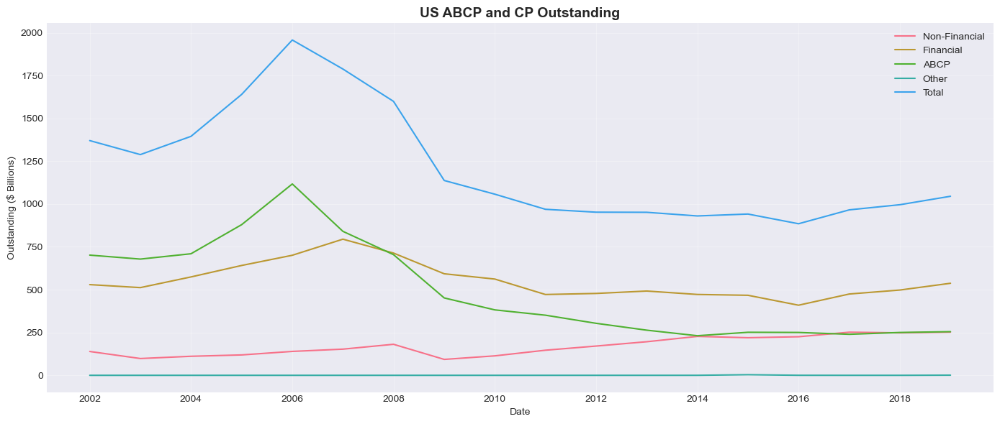


 MACROECONOMIC CORRELATIONS
--------------------------------------------------------------------------------

Using 'Total' for macro correlations


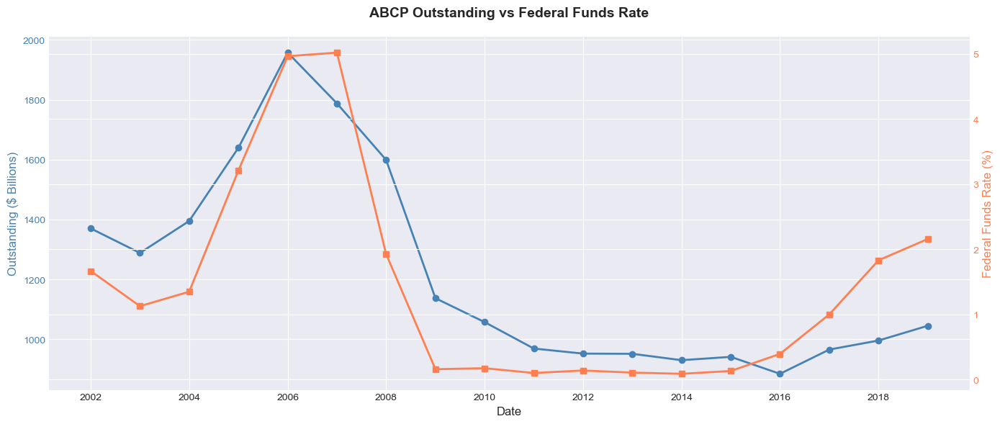

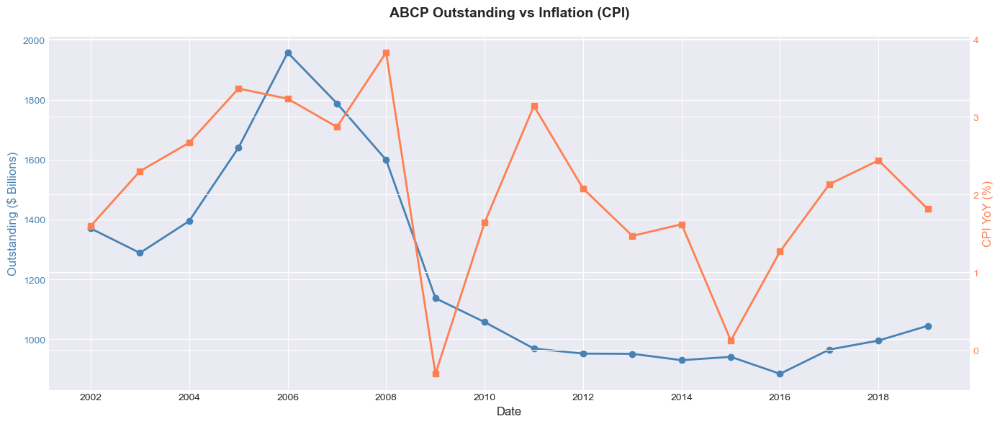

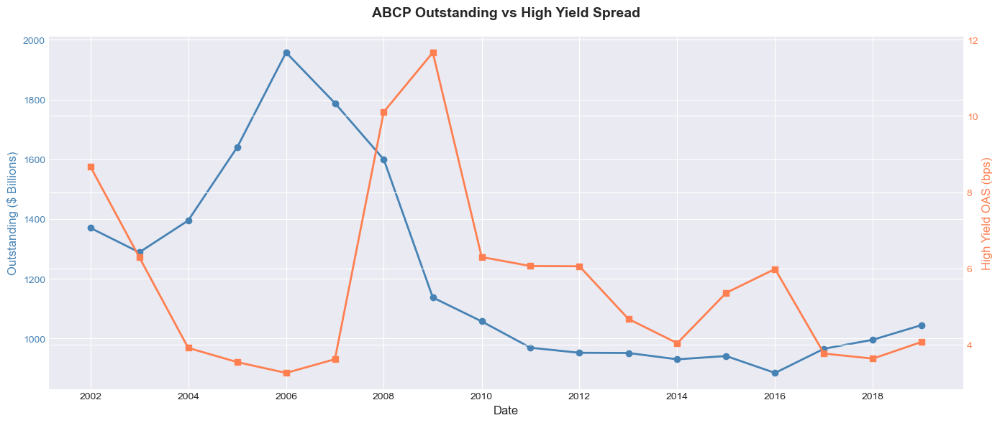


Outstanding - Correlation with Macro Indicators:
  Federal Funds Rate......................  0.877
  CPI YoY.................................  0.593
  High Yield Spread....................... -0.061


In [62]:
# ============================================================================
# ABCP AND CP OUTSTANDING ANALYSIS
# ============================================================================

print("=" * 80)
print("US ABCP AND CP OUTSTANDING ANALYSIS")
print("=" * 80)

# Note: ABCP only has Outstanding data, no Issuance data

# Descriptive Statistics
print("\n DESCRIPTIVE STATISTICS")
print("-" * 80)

# Get all numeric columns (excluding Date)
abcp_cols = [col for col in us_abcp_outstanding.columns if col != 'Date' and us_abcp_outstanding[col].dtype in ['float64', 'int64']]

print("\nABCP Outstanding:")
abcp_stats = calculate_descriptive_stats(us_abcp_outstanding, abcp_cols)
display(abcp_stats)

# Time Series Plots
print("\n TIME SERIES PLOTS")
print("-" * 80)

plot_time_series(
    us_abcp_outstanding,
    value_cols=abcp_cols,
    title='US ABCP and CP Outstanding',
    ylabel='Outstanding ($ Billions)'
)

# Macroeconomic Correlations
print("\n MACROECONOMIC CORRELATIONS")
print("-" * 80)

# Find Total column
total_col = [c for c in abcp_cols if 'Total' in c or 'total' in c.lower()]
if not total_col:
    total_col = abcp_cols[0]  # Use first numeric column if no Total found
else:
    total_col = total_col[0]

print(f"\nUsing '{total_col}' for macro correlations")

# OUTSTANDING - Merge and plot
abcp_outstanding_macro = us_abcp_outstanding[['Date', total_col]].copy()
abcp_outstanding_macro = abcp_outstanding_macro.merge(fed_funds_annual, on='Date', how='inner')
abcp_outstanding_macro = abcp_outstanding_macro.merge(cpi_yoy_annual, on='Date', how='inner')
abcp_outstanding_macro = abcp_outstanding_macro.merge(hy_spread_annual, on='Date', how='inner')

# Plot with Federal Funds Rate
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(abcp_outstanding_macro['Date'], abcp_outstanding_macro[total_col], color='steelblue', linewidth=2, marker='o')
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Outstanding ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(abcp_outstanding_macro['Date'], abcp_outstanding_macro['FedFunds'], color='coral', linewidth=2, marker='s')
ax2.set_ylabel('Federal Funds Rate (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('ABCP Outstanding vs Federal Funds Rate', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with CPI
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(abcp_outstanding_macro['Date'], abcp_outstanding_macro[total_col], color='steelblue', linewidth=2, marker='o')
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Outstanding ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(abcp_outstanding_macro['Date'], abcp_outstanding_macro['CPI_YoY'], color='coral', linewidth=2, marker='s')
ax2.set_ylabel('CPI YoY (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('ABCP Outstanding vs Inflation (CPI)', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with High Yield Spread
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(abcp_outstanding_macro['Date'], abcp_outstanding_macro[total_col], color='steelblue', linewidth=2, marker='o')
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Outstanding ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(abcp_outstanding_macro['Date'], abcp_outstanding_macro['HY_OAS'], color='coral', linewidth=2, marker='s')
ax2.set_ylabel('High Yield OAS (bps)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('ABCP Outstanding vs High Yield Spread', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

correlations_abcp = {
    'Federal Funds Rate': abcp_outstanding_macro[[total_col, 'FedFunds']].corr().iloc[0, 1],
    'CPI YoY': abcp_outstanding_macro[[total_col, 'CPI_YoY']].corr().iloc[0, 1],
    'High Yield Spread': abcp_outstanding_macro[[total_col, 'HY_OAS']].corr().iloc[0, 1]
}

print("\nOutstanding - Correlation with Macro Indicators:")
for indicator, corr in correlations_abcp.items():
    print(f"  {indicator:.<40} {corr:>6.3f}")

### 6. US Municipal Issuance

US MUNICIPAL ISSUANCE ANALYSIS

 DESCRIPTIVE STATISTICS
--------------------------------------------------------------------------------

Municipal Issuance:


,GO,Revenue,Competitive,Negotiated,Private Placement,New Capital,Refunding,Total
count,25.000000,25.000000,25.000000,25.000000,25.000000,25.000000,25.000000,25.000000
mean,126.349548,228.152476,70.845996,271.074408,12.581620,202.764292,151.737112,354.502004
std,35.949882,51.146247,15.878508,68.299743,11.523641,51.404981,61.555815,83.520602
min,63.010300,119.888300,46.283900,132.973800,1.818800,121.680000,35.647000,182.898600
25%,106.011900,192.782700,59.556800,225.668800,3.640900,154.584500,120.490100,295.124200
50%,131.460400,240.787300,71.456600,290.101100,6.467700,203.175300,148.953500,380.290900
75%,147.525700,272.010600,75.917500,325.157200,22.674900,256.755000,188.269300,409.625500
max,199.641000,296.635400,99.169400,358.418500,40.560000,279.283900,275.082300,484.547000
skew,-0.182367,-0.659393,0.280532,-0.647702,1.023809,0.088607,0.189115,-0.672022
kurtosis,-0.335393,-0.552202,-0.580339,-0.652611,-0.207743,-1.532752,-0.415314,-0.415736



 TIME SERIES PLOTS
--------------------------------------------------------------------------------


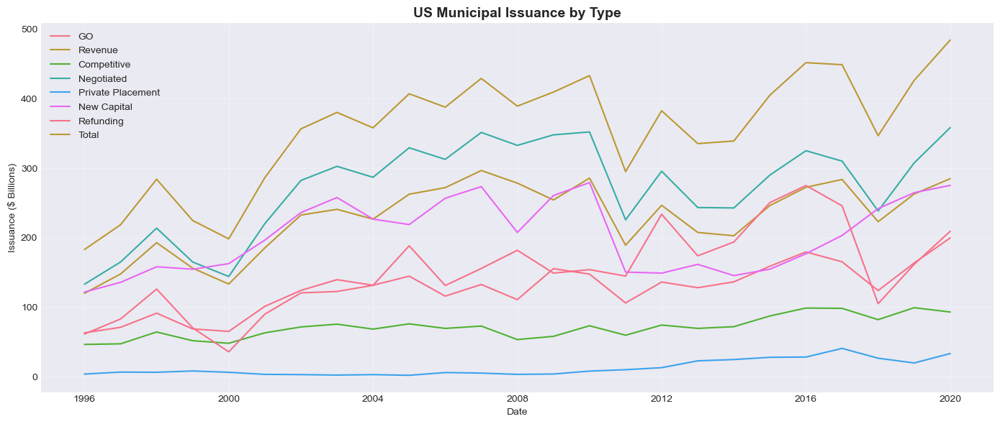


 MACROECONOMIC CORRELATIONS
--------------------------------------------------------------------------------


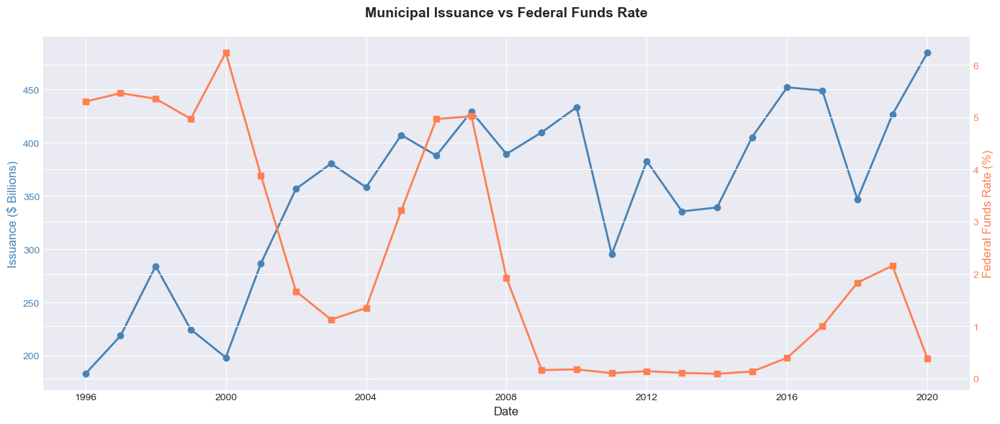

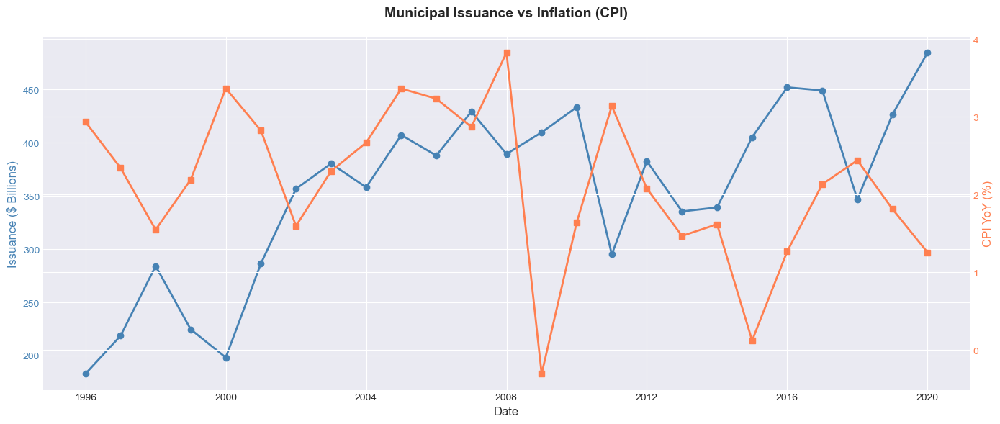

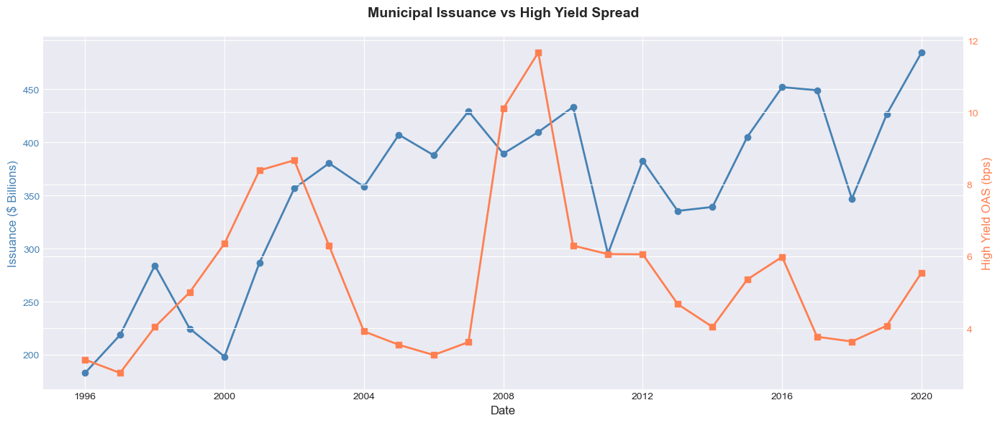


Issuance - Correlation with Macro Indicators:
  Federal Funds Rate...................... -0.630
  CPI YoY................................. -0.349
  High Yield Spread.......................  0.154


In [63]:
# ============================================================================
# MUNICIPAL ISSUANCE ANALYSIS
# ============================================================================

print("=" * 80)
print("US MUNICIPAL ISSUANCE ANALYSIS")
print("=" * 80)

# Note: Municipal only has Issuance data, no Outstanding data

# Descriptive Statistics
print("\n DESCRIPTIVE STATISTICS")
print("-" * 80)

municipal_cols = ['GO', 'Revenue', 'Competitive', 'Negotiated', 'Private Placement', 'New Capital', 'Refunding', 'Total']

print("\nMunicipal Issuance:")
municipal_stats = calculate_descriptive_stats(us_municipal_issuance, municipal_cols)
display(municipal_stats)

# Time Series Plots
print("\n TIME SERIES PLOTS")
print("-" * 80)

plot_time_series(
    us_municipal_issuance,
    value_cols=municipal_cols,
    title='US Municipal Issuance by Type',
    ylabel='Issuance ($ Billions)'
)

# Macroeconomic Correlations
print("\n MACROECONOMIC CORRELATIONS")
print("-" * 80)

# ISSUANCE - Merge and plot
municipal_issuance_macro = us_municipal_issuance[['Date', 'Total']].copy()
municipal_issuance_macro = municipal_issuance_macro.merge(fed_funds_annual, on='Date', how='inner')
municipal_issuance_macro = municipal_issuance_macro.merge(cpi_yoy_annual, on='Date', how='inner')
municipal_issuance_macro = municipal_issuance_macro.merge(hy_spread_annual, on='Date', how='inner')

# Plot with Federal Funds Rate
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(municipal_issuance_macro['Date'], municipal_issuance_macro['Total'], color='steelblue', linewidth=2, marker='o')
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Issuance ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(municipal_issuance_macro['Date'], municipal_issuance_macro['FedFunds'], color='coral', linewidth=2, marker='s')
ax2.set_ylabel('Federal Funds Rate (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Municipal Issuance vs Federal Funds Rate', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with CPI
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(municipal_issuance_macro['Date'], municipal_issuance_macro['Total'], color='steelblue', linewidth=2, marker='o')
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Issuance ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(municipal_issuance_macro['Date'], municipal_issuance_macro['CPI_YoY'], color='coral', linewidth=2, marker='s')
ax2.set_ylabel('CPI YoY (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Municipal Issuance vs Inflation (CPI)', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with High Yield Spread
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(municipal_issuance_macro['Date'], municipal_issuance_macro['Total'], color='steelblue', linewidth=2, marker='o')
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Issuance ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(municipal_issuance_macro['Date'], municipal_issuance_macro['HY_OAS'], color='coral', linewidth=2, marker='s')
ax2.set_ylabel('High Yield OAS (bps)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Municipal Issuance vs High Yield Spread', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

correlations_municipal = {
    'Federal Funds Rate': municipal_issuance_macro[['Total', 'FedFunds']].corr().iloc[0, 1],
    'CPI YoY': municipal_issuance_macro[['Total', 'CPI_YoY']].corr().iloc[0, 1],
    'High Yield Spread': municipal_issuance_macro[['Total', 'HY_OAS']].corr().iloc[0, 1]
}

print("\nIssuance - Correlation with Macro Indicators:")
for indicator, corr in correlations_municipal.items():
    print(f"  {indicator:.<40} {corr:>6.3f}")

### 7. US Corporate Bond Issuance

US CORPORATE BOND ISSUANCE ANALYSIS

 DESCRIPTIVE STATISTICS
--------------------------------------------------------------------------------

Corporate Bond Issuance:


,Nonconvertible,Convertible,Total
count,19.000000,19.000000,19.000000
mean,863.327426,42.293484,905.620911
std,319.975323,22.048041,324.170923
min,337.378800,17.529900,357.880200
25%,618.794850,25.871400,648.883550
50%,773.779000,36.360200,855.418600
75%,1057.240950,49.270050,1106.869000
max,1446.619600,86.415200,1486.217400
skew,0.419984,1.049469,0.325995
kurtosis,-0.652936,-0.081832,-0.710463



 TIME SERIES PLOTS
--------------------------------------------------------------------------------


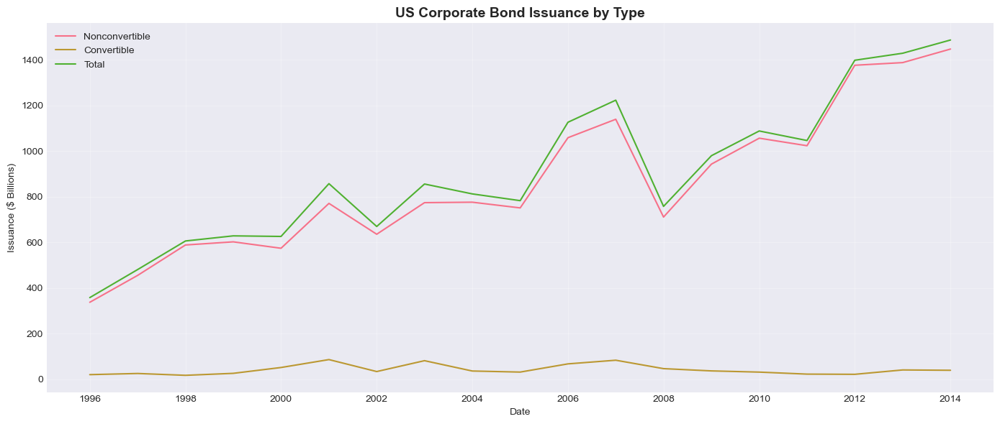


 MACROECONOMIC CORRELATIONS
--------------------------------------------------------------------------------


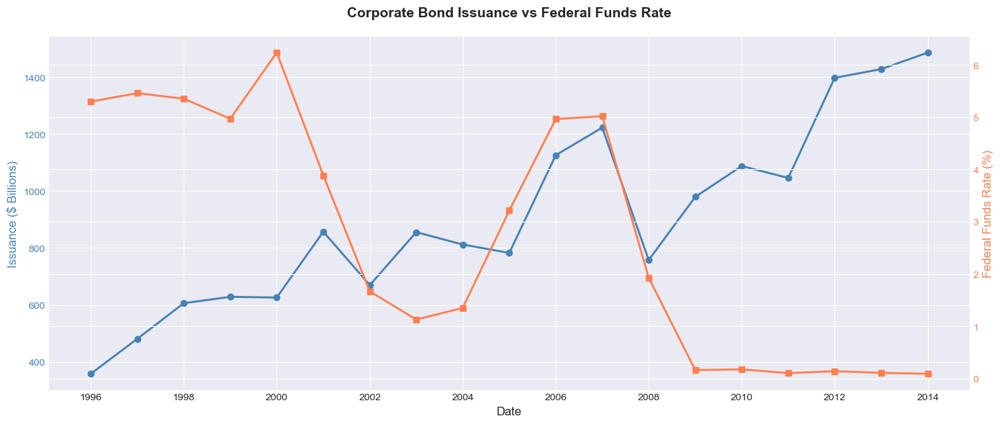

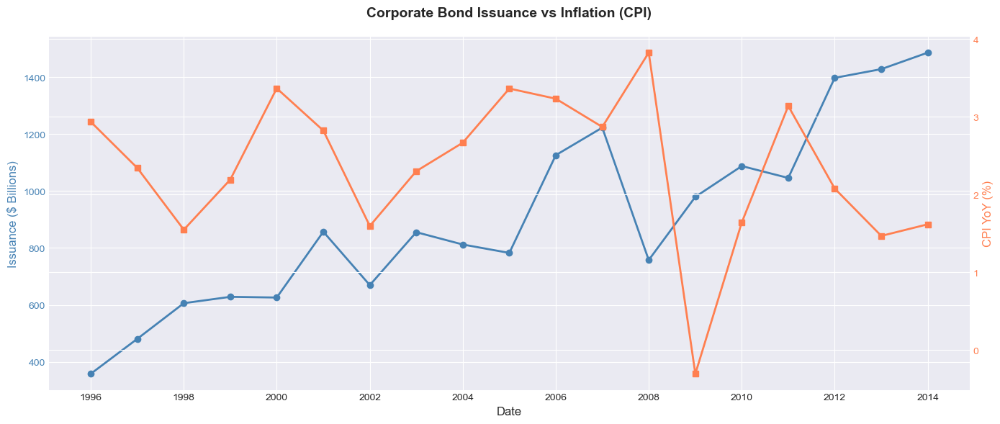

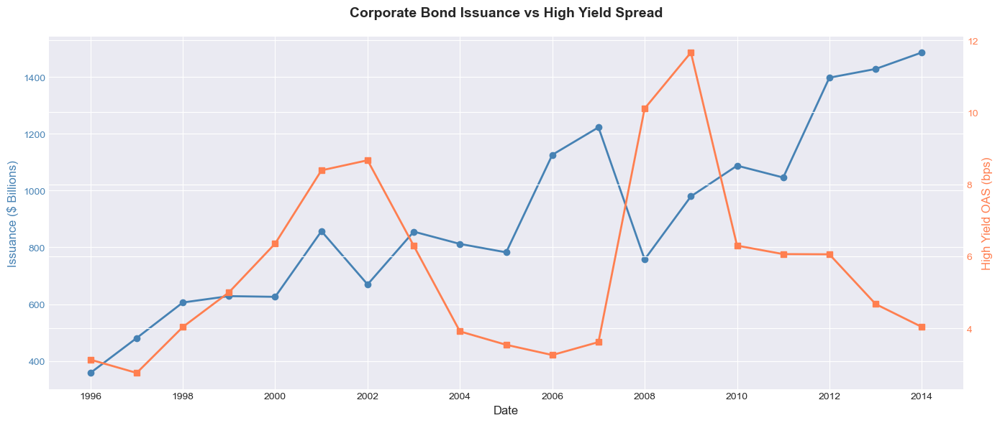


Issuance - Correlation with Macro Indicators:
  Federal Funds Rate...................... -0.626
  CPI YoY................................. -0.250
  High Yield Spread.......................  0.011


In [64]:
# ============================================================================
# CORPORATE BOND ISSUANCE ANALYSIS
# ============================================================================

print("=" * 80)
print("US CORPORATE BOND ISSUANCE ANALYSIS")
print("=" * 80)

# Note: Corporate Bond only has Issuance data, no Outstanding data

# Descriptive Statistics
print("\n DESCRIPTIVE STATISTICS")
print("-" * 80)

corporate_issuance_cols = ['Nonconvertible', 'Convertible', 'Total']

print("\nCorporate Bond Issuance:")
corporate_issuance_stats = calculate_descriptive_stats(us_corporate_bond_issuance, corporate_issuance_cols)
display(corporate_issuance_stats)

# Time Series Plots
print("\n TIME SERIES PLOTS")
print("-" * 80)

plot_time_series(
    us_corporate_bond_issuance,
    value_cols=corporate_issuance_cols,
    title='US Corporate Bond Issuance by Type',
    ylabel='Issuance ($ Billions)'
)

# Macroeconomic Correlations
print("\n MACROECONOMIC CORRELATIONS")
print("-" * 80)

# ISSUANCE - Merge and plot
corporate_issuance_macro = us_corporate_bond_issuance[['Date', 'Total']].copy()
corporate_issuance_macro = corporate_issuance_macro.merge(fed_funds_annual, on='Date', how='inner')
corporate_issuance_macro = corporate_issuance_macro.merge(cpi_yoy_annual, on='Date', how='inner')
corporate_issuance_macro = corporate_issuance_macro.merge(hy_spread_annual, on='Date', how='inner')

# Plot with Federal Funds Rate
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(corporate_issuance_macro['Date'], corporate_issuance_macro['Total'], color='steelblue', linewidth=2, marker='o')
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Issuance ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(corporate_issuance_macro['Date'], corporate_issuance_macro['FedFunds'], color='coral', linewidth=2, marker='s')
ax2.set_ylabel('Federal Funds Rate (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Corporate Bond Issuance vs Federal Funds Rate', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with CPI
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(corporate_issuance_macro['Date'], corporate_issuance_macro['Total'], color='steelblue', linewidth=2, marker='o')
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Issuance ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(corporate_issuance_macro['Date'], corporate_issuance_macro['CPI_YoY'], color='coral', linewidth=2, marker='s')
ax2.set_ylabel('CPI YoY (%)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Corporate Bond Issuance vs Inflation (CPI)', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Plot with High Yield Spread
fig, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(corporate_issuance_macro['Date'], corporate_issuance_macro['Total'], color='steelblue', linewidth=2, marker='o')
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Issuance ($ Billions)', fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

ax2 = ax1.twinx()
ax2.plot(corporate_issuance_macro['Date'], corporate_issuance_macro['HY_OAS'], color='coral', linewidth=2, marker='s')
ax2.set_ylabel('High Yield OAS (bps)', fontsize=12, color='coral')
ax2.tick_params(axis='y', labelcolor='coral')

plt.title('Corporate Bond Issuance vs High Yield Spread', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

correlations_corporate_issuance = {
    'Federal Funds Rate': corporate_issuance_macro[['Total', 'FedFunds']].corr().iloc[0, 1],
    'CPI YoY': corporate_issuance_macro[['Total', 'CPI_YoY']].corr().iloc[0, 1],
    'High Yield Spread': corporate_issuance_macro[['Total', 'HY_OAS']].corr().iloc[0, 1]
}

print("\nIssuance - Correlation with Macro Indicators:")
for indicator, corr in correlations_corporate_issuance.items():
    print(f"  {indicator:.<40} {corr:>6.3f}")